- regular bayes between 20-1000
- kappa now float
- trade only on state shifts

In [2]:
# General
import numpy as np
import pandas as pd
import os, sys
import optuna

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt
import matplotlib as mpl    
mpl.rcParams["text.usetex"] = False


# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier

#sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
from feature_set_v2 import MergedDataLoader 




In [3]:
# ---------------------------------------------------------------------
# 1) Purged/embargoed window function
# ---------------------------------------------------------------------
def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=3,
        initial_train_start=None,
        gap_days=3                                      # gap_days: number of days to exclude at the train/validation boundary (purge/embargo) to avoid look‑ahead; set to 0 to disable
    ):
    # 1) Validation window
    val_end   = current_date
    val_start = val_end - pd.DateOffset(years=val_years)
    
    # 2) Train ends just before validation
    train_end = val_start - pd.DateOffset(days=1)
    
    # 3) Max‐length training start
    train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
    if initial_train_start is not None:
        earliest = pd.to_datetime(initial_train_start)
        train_start_candidate = max(train_start_candidate, earliest)
    
    # 4) Enforce min‐length
    if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
        train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
        if initial_train_start is not None:
            train_start_candidate = max(train_start_candidate, earliest)
    
    idx       = full_data.index
    train_idx = idx[(idx >= train_start_candidate) & (idx <= train_end)]
    val_idx   = idx[(idx >= val_start)           & (idx <= val_end)]
    
    # 5) Purge/embargo
    if gap_days > 0:
        if len(train_idx) > gap_days:
            train_idx = train_idx[:-gap_days]
        if len(val_idx)   > gap_days:
            val_idx   = val_idx[gap_days:]
    
    if train_idx.empty or val_idx.empty:
        raise ValueError(
            f"No data for train [{train_start_candidate.date()}-{train_end.date()}] "
            f"or val [{val_start.date()}-{val_end.date()}] after {gap_days}-day gap"
        )
    
    return train_idx[0], train_idx[-1], val_idx[0], val_idx[-1]


# ---------------------------------------------------------------------
# 2) Optuna objective & wrapper
# ---------------------------------------------------------------------
# 1) New evaluator that fits one model & returns Sharpe:
# ------------------------------------------------------------------
# Trade-only-at-state-shift evaluator
def evaluate_sjm_sharpe(
    lam, kappa,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")

    # 1) Online state predictions
    val_states = model.predict_online(X_vl_s)

    # 2) Flag re-hedge days  – True where *state* flips vs. yesterday
    shift = val_states.ne(val_states.shift()).fillna(True)

    # 3) P&L with trades **only** on those days
    pnl = np.zeros(len(val_states))
    prev_pos = 0.0
    for t, st in enumerate(val_states):
        if shift.iloc[t]:                         # rebalance
            exp_ann = model.ret_[st] * 252
            if   exp_ann >  annual_threshold: pos =  1.0
            elif exp_ann < -annual_threshold: pos = -1.0
            else:                                 pos = exp_ann / annual_threshold
        else:                                     # carry position
            pos = prev_pos

        pnl[t] = prev_pos * ar_vl.iloc[t] - abs(pos - prev_pos) * cost_per_100pct
        prev_pos = pos

    sharpe = pnl.mean() / pnl.std(ddof=1) * np.sqrt(252)
    return sharpe


# 2) Rewrite your Optuna objective to use it:
def optuna_objective(
    trial,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    lam   = trial.suggest_float("lambda", 10**2 / 5, 10**3)
    kappa = trial.suggest_float("kappa", 1, np.sqrt(17))
    return evaluate_sjm_sharpe(
        lam, kappa,
        X_tr_s, X_vl_s,
        ar_tr, ar_vl,
        cost_per_100pct, annual_threshold
    )

# 3) In your Bayesian wrapper, return the study:
def bayesian_hyperparam_search(
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct=0.0021,
    annual_threshold=0.05,
    n_trials=30
):
    study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42), direction="maximize")
    study.optimize(
        lambda t: optuna_objective(
            t, X_tr_s, X_vl_s, ar_tr, ar_vl,
            cost_per_100pct, annual_threshold
        ),
        n_trials=n_trials
    )
    return study


# ---------------------------------------------------------------------
# 3) Rolling CV + final‑model fit using Optuna
# ---------------------------------------------------------------------
def rolling_time_series_cv_sjm_long_short_optimized(
    X_train, X_val,
    factor_returns_train, factor_returns_val,
    market_returns_train, market_returns_val,
    cost_per_100pct=0.0021,
    annual_threshold=0.05,
    n_trials=30
):
    # --- align indices & build active returns ---
    tr_idx = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    vl_idx = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    X_tr = X_train.loc[tr_idx]
    X_vl = X_val.loc[vl_idx]
    ar_tr = factor_returns_train.loc[tr_idx] - market_returns_train.loc[tr_idx]
    ar_vl = factor_returns_val.loc[vl_idx]     - market_returns_val.loc[vl_idx]
    
    # --- preprocess ---
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    
    X_tr_s = pd.DataFrame(
        scaler.fit_transform(clipper.fit_transform(X_tr)),
        index=X_tr.index, columns=X_tr.columns
    )
    X_vl_s = pd.DataFrame(
        scaler.transform(clipper.transform(X_vl)),
        index=X_vl.index, columns=X_vl.columns
    )
    
    # --- Bayesian search ---
    study = bayesian_hyperparam_search(
        X_tr_s, X_vl_s, ar_tr, ar_vl,
        cost_per_100pct, annual_threshold,
        n_trials
    )
    lam, kappa = study.best_params["lambda"], study.best_params["kappa"]
    best_sharpe = study.best_value
    print(f"Optuna best λ={lam:.4f}, κ={kappa}, Sharpe={best_sharpe:.4f}")
    
    # --- fit final SJM on the full train window ---
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    
    return {
        "best_lambda": lam,
        "best_kappa":  kappa,
        "best_sharpe": best_sharpe,
        "best_model":  model,
        "results_array": None,
        "study": study
    }

In [4]:
# ---------------------------------------------------------------------
# 4) Updated cross‑validation module (run_cv)
# ---------------------------------------------------------------------
def run_cv(
    factors,
    factor_data_dict,
    cv_dates,
    *,
    min_train_years=8,
    max_train_years=12,
    val_years=3,
    initial_train_start=None,
    save_path="0505_21bps_20-1000_21bps_tradeshift.parquet",
    make_plots=True,
    cost_per_100pct=0.0021,
    annual_threshold=0.05,
    n_trials=30
):
    records = []
    evolution_plotbuf = []

    for cv_end in cv_dates:
        for fac in factors:
            X       = factor_data_dict[fac]["X"]
            fac_ret = factor_data_dict[fac]["fac_ret"]
            mkt_ret = factor_data_dict[fac]["mkt_ret"]

            # get purged train/val windows
            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_end, X,
                min_train_years=min_train_years,
                max_train_years=max_train_years,
                val_years=val_years,
                initial_train_start=initial_train_start,
                gap_days=3
            )

            # slice data
            X_train  = filter_date_range(X, train_start, train_end)
            X_val    = filter_date_range(X, val_start,   val_end)
            fr_train = filter_date_range(fac_ret, train_start, train_end)
            fr_val   = filter_date_range(fac_ret, val_start,   val_end)
            mr_train = filter_date_range(mkt_ret, train_start, train_end)
            mr_val   = filter_date_range(mkt_ret, val_start,   val_end)

            # run Optuna‐powered CV
            res = rolling_time_series_cv_sjm_long_short_optimized(
                X_train=X_train,
                X_val=X_val,
                factor_returns_train=fr_train,
                factor_returns_val=fr_val,
                market_returns_train=mr_train,
                market_returns_val=mr_val,
                cost_per_100pct=cost_per_100pct,
                annual_threshold=annual_threshold,
                n_trials=n_trials
            )

            # store results
            records.append({
                "date": cv_end,
                "factor": fac,
                "best_lambda": res["best_lambda"],
                "best_kappa":  res["best_kappa"]
            })
            evolution_plotbuf.append({
                "date": cv_end,
                "factor": fac,
                "lambda": res["best_lambda"],
                "kappa":  res["best_kappa"]
            })

            # per‐fold Optuna scatter plot
            if make_plots:
                trials = res["study"].trials
                df_t = pd.DataFrame([
                    {"lambda": t.params["lambda"],
                     "kappa":  t.params["kappa"],
                     "value":  t.value}
                    for t in trials
                ])
                plt.figure(figsize=(8,5))
                sc = plt.scatter(
                    df_t["lambda"],
                    df_t["value"],
                    c=df_t["kappa"].astype(float),
                    cmap="viridis",
                    alpha=0.8
                )
                plt.xscale("log")
                plt.axvline(res["best_lambda"], ls="--", c="r", alpha=0.6)
                plt.colorbar(sc, label='$\\kappa$')
                plt.xlabel("'$\\lambda$' (log scale)")
                plt.ylabel("Validation Sharpe")
                plt.title(f"{fac} | CV cutoff {cv_end.date()} - Optuna trials")
                plt.grid(True, ls=":")
                plt.tight_layout()
                plt.show()

    # assemble and save
    cv_df = pd.DataFrame(records).sort_values(["factor", "date"])
    if save_path:
        cv_df.to_parquet(save_path)

    # overall λ/κ evolution
    if make_plots:
        evo = pd.DataFrame(evolution_plotbuf)
        for fac in factors:
            sub = evo[evo["factor"] == fac].sort_values("date")
            fig, ax1 = plt.subplots(figsize=(9,5))
            ax1.plot(sub["date"], sub["lambda"], marker="o", label='$\\lambda$')
            ax1.set_ylabel('$\\lambda$', color="tab:blue")
            ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2 = ax1.twinx()
            ax2.plot(sub["date"], sub["kappa"], marker="x", ls="--", color="tab:red", label='$\\kappa$')
            ax2.set_ylabel('$\\kappa$', color="tab:red")
            ax2.tick_params(axis='y', labelcolor='tab:red')
            ax1.set_xlabel("CV end-date")
            ax1.set_title(f"{fac} — hyperparameter evolution")
            ax1.grid(True, ls=":")
            ax1.legend(loc="upper left")
            ax2.legend(loc="upper right")
            plt.tight_layout()
            plt.show()

    return cv_df


[I 2025-05-05 23:28:31,090] A new study created in memory with name: no-name-c016fdd4-60bd-4252-bf73-2661d892666e
[I 2025-05-05 23:28:35,239] Trial 0 finished with value: 0.03887758055175635 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.03887758055175635.
[I 2025-05-05 23:28:38,021] Trial 1 finished with value: 0.0388775805517565 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.0388775805517565.
[I 2025-05-05 23:28:42,620] Trial 2 finished with value: -0.24243816780225094 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.0388775805517565.
[I 2025-05-05 23:28:49,304] Trial 3 finished with value: -0.4613154579290444 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.0388775805517565.
[I 2025-05-05 23:28:53,355] Trial 4 finished with value: 0.03887758055175635 and pa

Optuna best λ=318.1574, κ=2.6388697637096916, Sharpe=0.0881


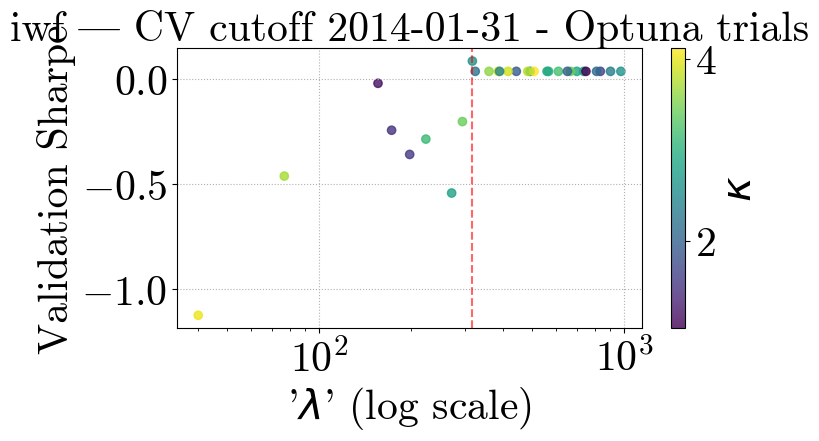

[I 2025-05-05 23:30:28,668] A new study created in memory with name: no-name-09d8b940-ed94-460d-8b96-57833c02b4cc
[I 2025-05-05 23:30:31,152] Trial 0 finished with value: 0.7716704676816151 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7716704676816151.
[I 2025-05-05 23:30:33,709] Trial 1 finished with value: 0.7716704676816151 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7716704676816151.
[I 2025-05-05 23:30:37,525] Trial 2 finished with value: 0.43300492810579444 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7716704676816151.
[I 2025-05-05 23:30:42,145] Trial 3 finished with value: 0.8152476237141241 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.8152476237141241.
[I 2025-05-05 23:30:44,722] Trial 4 finished with value: 0.7716704676816151 and paramet

Optuna best λ=207.8435, κ=2.1855441481340363, Sharpe=0.8650


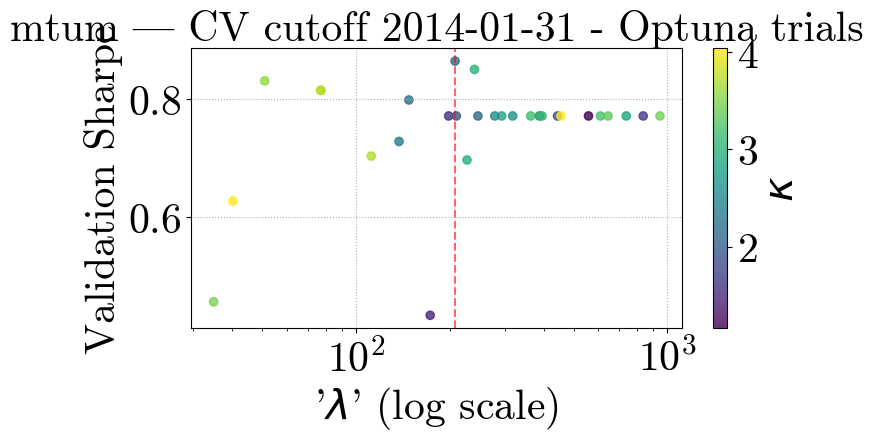

[I 2025-05-05 23:32:06,750] A new study created in memory with name: no-name-df4aa40b-40d0-4e9a-bb36-6bd4dabd46d1
[I 2025-05-05 23:32:09,238] Trial 0 finished with value: -0.45202074456085306 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.45202074456085306.
[I 2025-05-05 23:32:11,487] Trial 1 finished with value: -0.7229715043039668 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.45202074456085306.
[I 2025-05-05 23:32:14,319] Trial 2 finished with value: -0.5377658742563313 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.45202074456085306.
[I 2025-05-05 23:32:19,504] Trial 3 finished with value: -1.1360904804782554 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.45202074456085306.
[I 2025-05-05 23:32:21,750] Trial 4 finished with value: -0.722971504303966

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.6747


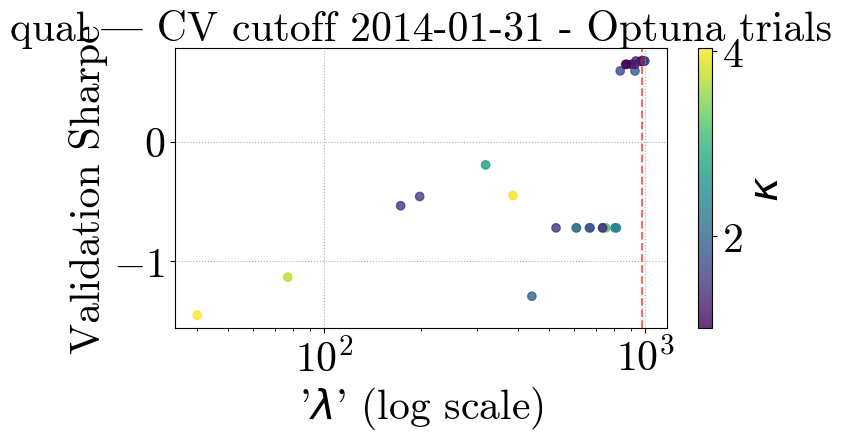

[I 2025-05-05 23:33:21,536] A new study created in memory with name: no-name-fa40b2c7-546c-42e5-92cf-e18557acd273
[I 2025-05-05 23:33:24,585] Trial 0 finished with value: -0.2385499450201934 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2385499450201934.
[I 2025-05-05 23:33:26,837] Trial 1 finished with value: -0.508735777845072 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.2385499450201934.
[I 2025-05-05 23:33:33,469] Trial 2 finished with value: -0.14503466403030493 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.14503466403030493.
[I 2025-05-05 23:33:39,035] Trial 3 finished with value: -0.06355446048644489 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.06355446048644489.
[I 2025-05-05 23:33:41,984] Trial 4 finished with value: 0.038688309755403584

Optuna best λ=416.9228, κ=3.8260542456916884, Sharpe=0.1576


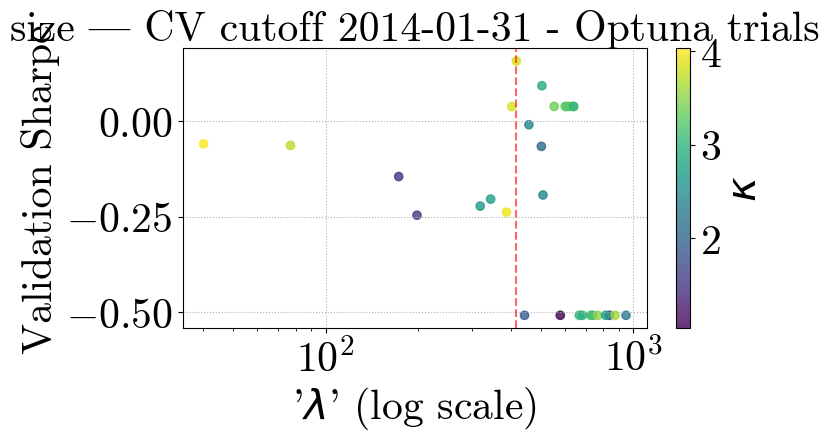

[I 2025-05-05 23:34:58,951] A new study created in memory with name: no-name-bf0d9392-879c-4c4c-9bbb-5bfeef65ae42
[I 2025-05-05 23:35:02,756] Trial 0 finished with value: -0.8888835069189772 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.8888835069189772.
[I 2025-05-05 23:35:06,800] Trial 1 finished with value: -0.3473321748178448 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.3473321748178448.
[I 2025-05-05 23:35:13,631] Trial 2 finished with value: -0.3002937915901012 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.3002937915901012.
[I 2025-05-05 23:35:21,400] Trial 3 finished with value: -0.5682478235609162 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.3002937915901012.
[I 2025-05-05 23:35:25,817] Trial 4 finished with value: -0.3473321748178448 and

Optuna best λ=186.8792, κ=1.0395373178924283, Sharpe=-0.1799


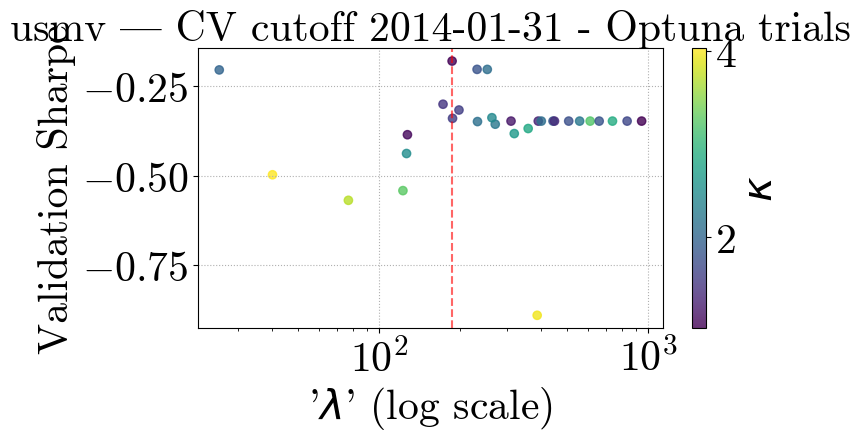

[I 2025-05-05 23:37:06,099] A new study created in memory with name: no-name-dfb42b62-f8cd-4182-bf50-124612709697
[I 2025-05-05 23:37:09,652] Trial 0 finished with value: -0.10428947414722169 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10428947414722169.
[I 2025-05-05 23:37:12,017] Trial 1 finished with value: 0.23413523501879446 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.23413523501879446.
[I 2025-05-05 23:37:15,717] Trial 2 finished with value: 0.10962233392142545 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.23413523501879446.
[I 2025-05-05 23:37:21,183] Trial 3 finished with value: 0.1912680065221188 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.23413523501879446.
[I 2025-05-05 23:37:23,278] Trial 4 finished with value: 0.4047240868541106 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.5590


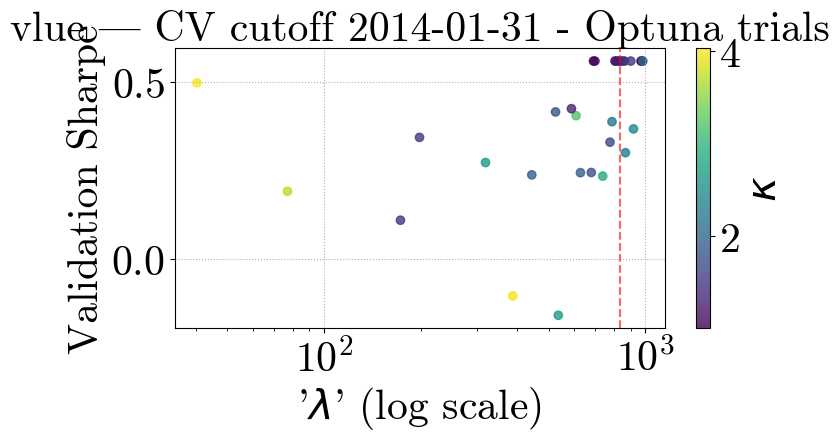

[I 2025-05-05 23:38:25,582] A new study created in memory with name: no-name-4cecd790-036e-495c-b997-8ee00ebcb2e0
[I 2025-05-05 23:38:30,380] Trial 0 finished with value: -0.16748934844497299 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.16748934844497299.
[I 2025-05-05 23:38:34,549] Trial 1 finished with value: -0.16748934844497299 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.16748934844497299.
[I 2025-05-05 23:38:40,784] Trial 2 finished with value: 0.05532036054870933 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.05532036054870933.
[I 2025-05-05 23:38:48,115] Trial 3 finished with value: -0.5837024052324603 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.05532036054870933.
[I 2025-05-05 23:38:52,483] Trial 4 finished with value: -0.1674893484449729

Optuna best λ=203.3695, κ=3.094032317267148, Sharpe=0.0663


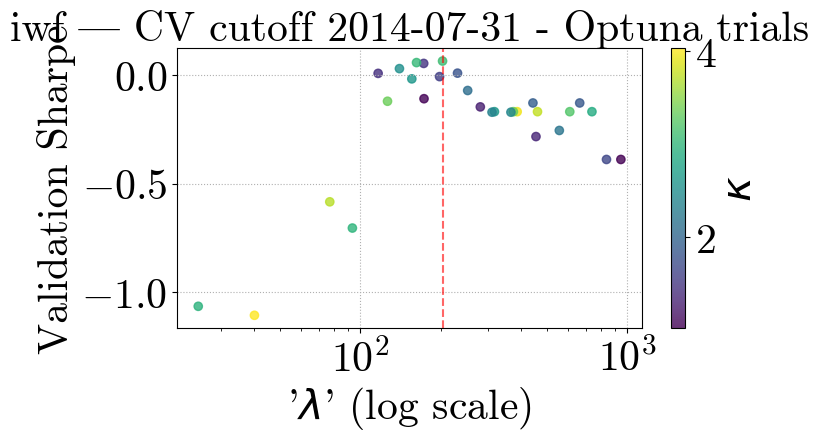

[I 2025-05-05 23:41:00,447] A new study created in memory with name: no-name-9db8dac1-a29a-406f-b52f-b5e744f55ca1
[I 2025-05-05 23:41:03,781] Trial 0 finished with value: 0.40988790353758936 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.40988790353758936.
[I 2025-05-05 23:41:06,964] Trial 1 finished with value: 0.40988790353758936 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.40988790353758936.
[I 2025-05-05 23:41:11,831] Trial 2 finished with value: 0.43123702427125776 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.43123702427125776.
[I 2025-05-05 23:41:18,665] Trial 3 finished with value: 0.40559570797885364 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.43123702427125776.
[I 2025-05-05 23:41:21,964] Trial 4 finished with value: 0.40988790353758936 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.4792


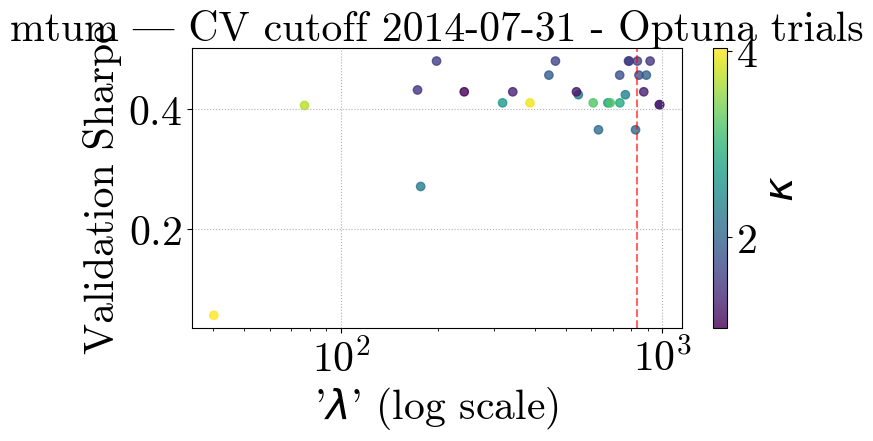

[I 2025-05-05 23:42:52,363] A new study created in memory with name: no-name-fe81decd-cb2c-4f4a-9a20-51dd196ba72e
[I 2025-05-05 23:42:55,330] Trial 0 finished with value: 0.0858657115617506 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.0858657115617506.
[I 2025-05-05 23:42:57,698] Trial 1 finished with value: 0.04266731585758273 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.0858657115617506.
[I 2025-05-05 23:43:02,081] Trial 2 finished with value: 0.1979077753836688 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.1979077753836688.
[I 2025-05-05 23:43:07,829] Trial 3 finished with value: -0.3848647948458985 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.1979077753836688.
[I 2025-05-05 23:43:10,646] Trial 4 finished with value: 0.04266731585758273 and param

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.1979


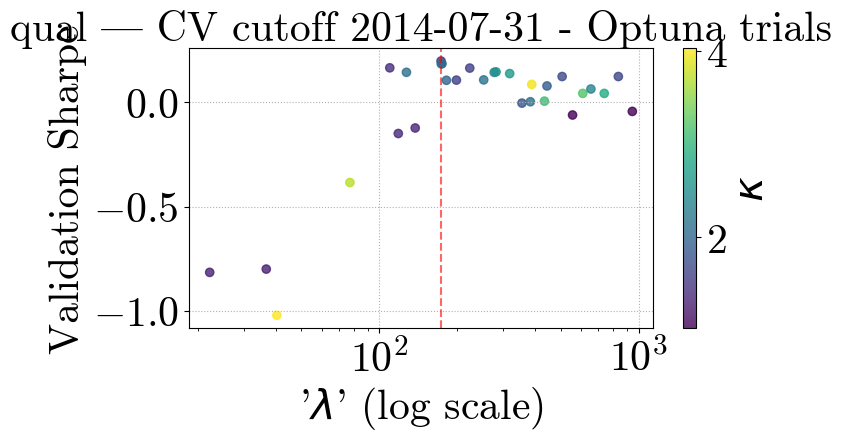

[I 2025-05-05 23:44:53,038] A new study created in memory with name: no-name-a6750d6b-ee06-4a55-84f5-a0334ff03a3c
[I 2025-05-05 23:44:56,682] Trial 0 finished with value: -0.021395947432467817 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.021395947432467817.
[I 2025-05-05 23:45:00,181] Trial 1 finished with value: 0.01714814818240085 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.01714814818240085.
[I 2025-05-05 23:45:07,777] Trial 2 finished with value: 0.03646671052894774 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.03646671052894774.
[I 2025-05-05 23:45:18,077] Trial 3 finished with value: 0.01878632713959965 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.03646671052894774.
[I 2025-05-05 23:45:21,444] Trial 4 finished with value: 0.2684209485346414 

Optuna best λ=491.6627, κ=2.291554963104842, Sharpe=0.3087


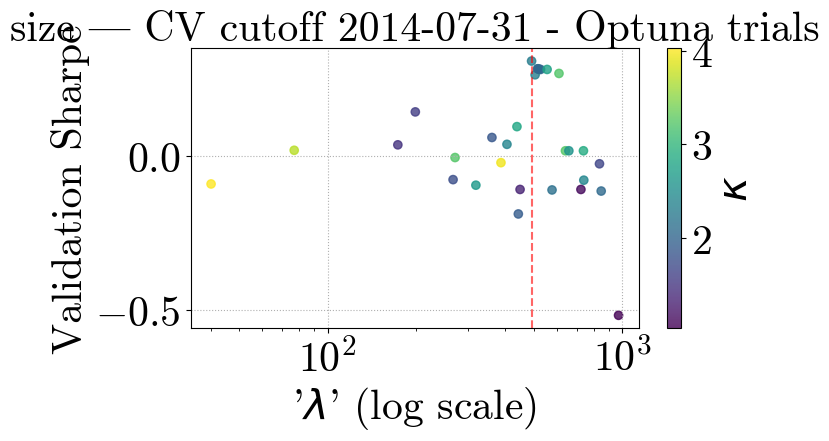

[I 2025-05-05 23:46:52,226] A new study created in memory with name: no-name-c81617cd-0b47-4cba-b956-75756648725f
[I 2025-05-05 23:46:57,296] Trial 0 finished with value: 0.44082495703615965 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.44082495703615965.
[I 2025-05-05 23:46:59,678] Trial 1 finished with value: 0.2748851352289315 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.44082495703615965.
[I 2025-05-05 23:47:05,958] Trial 2 finished with value: 0.46806331235385895 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.46806331235385895.
[I 2025-05-05 23:47:11,778] Trial 3 finished with value: -0.1624338708443448 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.46806331235385895.
[I 2025-05-05 23:47:14,312] Trial 4 finished with value: 0.2748851352289315 and p

Optuna best λ=320.4090, κ=1.4875454939234798, Sharpe=0.5686


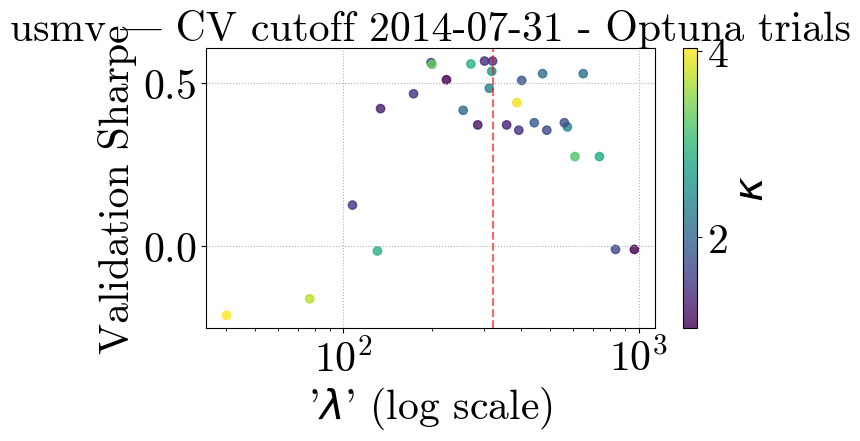

[I 2025-05-05 23:49:00,769] A new study created in memory with name: no-name-2a9ee43e-62a6-4bf6-961a-bfeb73d58b86
[I 2025-05-05 23:49:05,179] Trial 0 finished with value: 0.9588040438249912 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.9588040438249912.
[I 2025-05-05 23:49:08,909] Trial 1 finished with value: 1.3585407772177884 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.3585407772177884.
[I 2025-05-05 23:49:12,327] Trial 2 finished with value: 1.018552930977322 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.3585407772177884.
[I 2025-05-05 23:49:16,801] Trial 3 finished with value: 0.22122955855571813 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.3585407772177884.
[I 2025-05-05 23:49:20,277] Trial 4 finished with value: 1.3005555095752632 and paramete

Optuna best λ=823.3549, κ=1.032158511026232, Sharpe=1.4512


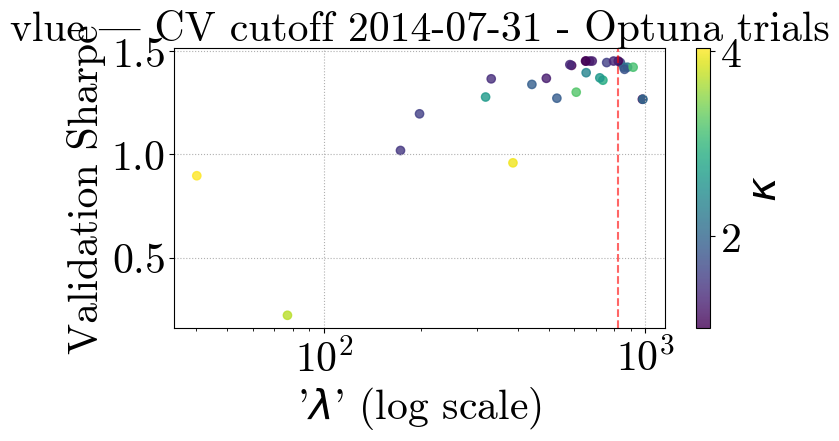

[I 2025-05-05 23:50:25,591] A new study created in memory with name: no-name-3f67e5f0-d94f-48be-bb67-de2a5cdae8db
[I 2025-05-05 23:50:29,860] Trial 0 finished with value: 0.17428450599193931 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.17428450599193931.
[I 2025-05-05 23:50:31,559] Trial 1 finished with value: 0.5140856492309281 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5140856492309281.
[I 2025-05-05 23:50:38,876] Trial 2 finished with value: 0.17428450599193943 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5140856492309281.
[I 2025-05-05 23:50:48,312] Trial 3 finished with value: -1.0436793851537682 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5140856492309281.
[I 2025-05-05 23:50:52,626] Trial 4 finished with value: 0.17428450599193931 and par

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.5141


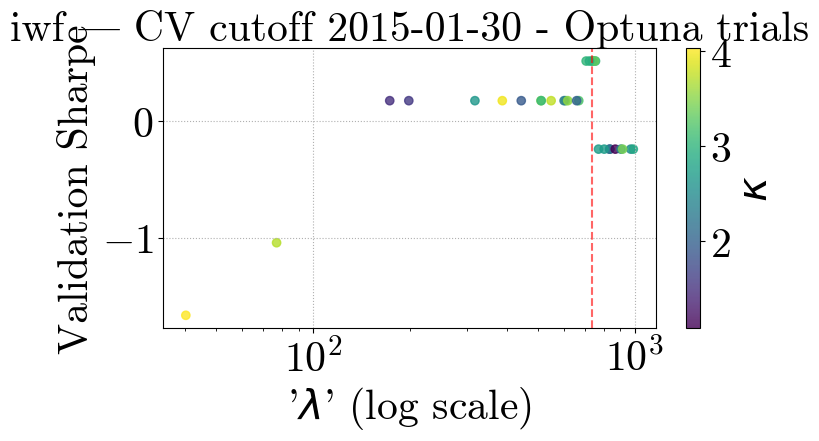

[I 2025-05-05 23:52:07,227] A new study created in memory with name: no-name-597c56eb-26ac-4e76-8b0b-ffae533618ee
[I 2025-05-05 23:52:10,642] Trial 0 finished with value: 1.0033364848042399 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0033364848042399.
[I 2025-05-05 23:52:13,948] Trial 1 finished with value: 1.0033364848042399 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0033364848042399.
[I 2025-05-05 23:52:19,042] Trial 2 finished with value: 1.0033364848042396 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.0033364848042399.
[I 2025-05-05 23:52:27,125] Trial 3 finished with value: 0.7656556929441042 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.0033364848042399.
[I 2025-05-05 23:52:30,825] Trial 4 finished with value: 1.0033364848042399 and paramete

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=1.0033


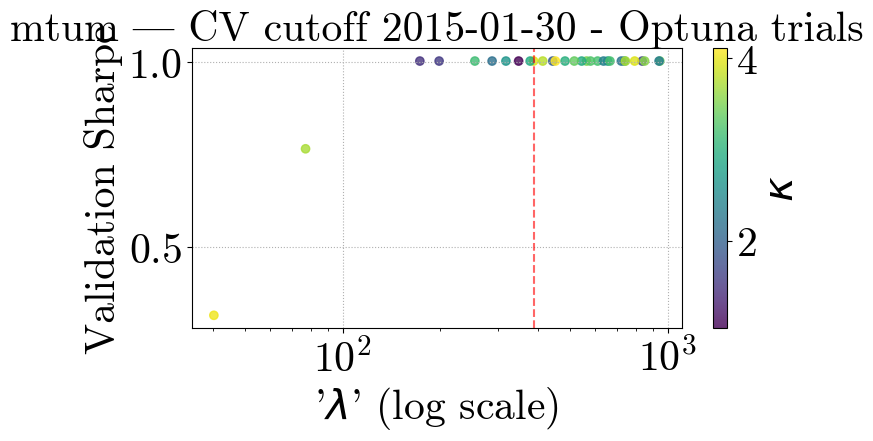

[I 2025-05-05 23:54:05,990] A new study created in memory with name: no-name-d4a7cb7c-426d-4fbc-ace5-56763011b0f3
[I 2025-05-05 23:54:10,524] Trial 0 finished with value: -0.2989135048384564 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2989135048384564.
[I 2025-05-05 23:54:13,439] Trial 1 finished with value: -0.2989135048384564 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.2989135048384564.
[I 2025-05-05 23:54:18,804] Trial 2 finished with value: -0.29891350483845647 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.2989135048384564.
[I 2025-05-05 23:54:24,458] Trial 3 finished with value: -1.1813075250471825 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.2989135048384564.
[I 2025-05-05 23:54:27,606] Trial 4 finished with value: -0.2989135048384564 an

Optuna best λ=850.0562, κ=1.8842009343045745, Sharpe=0.3134


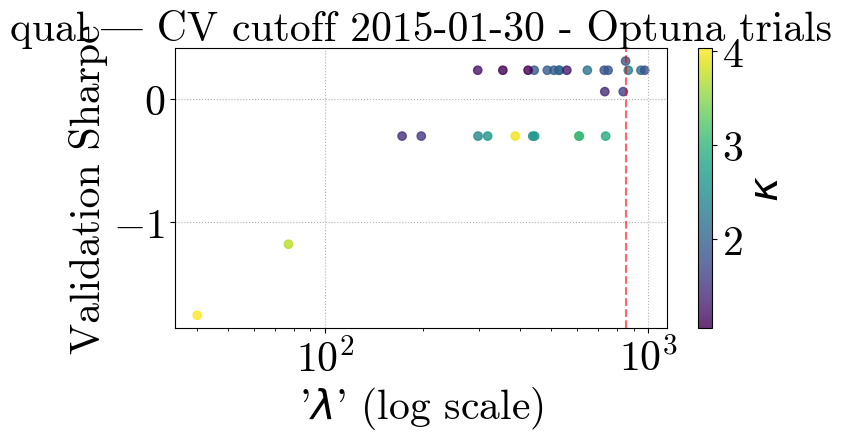

[I 2025-05-05 23:56:32,764] A new study created in memory with name: no-name-136308c2-10d1-4df1-a301-e2b76bb7b08f
[I 2025-05-05 23:56:36,223] Trial 0 finished with value: -0.7867852104016021 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7867852104016021.
[I 2025-05-05 23:56:40,042] Trial 1 finished with value: -0.609031303089014 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.609031303089014.
[I 2025-05-05 23:56:45,488] Trial 2 finished with value: -0.6707175041466718 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.609031303089014.
[I 2025-05-05 23:56:52,889] Trial 3 finished with value: -0.27961745285777545 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.27961745285777545.
[I 2025-05-05 23:56:57,358] Trial 4 finished with value: -0.609031303089014 and p

Optuna best λ=27.3964, κ=3.9798232276603978, Sharpe=0.0515


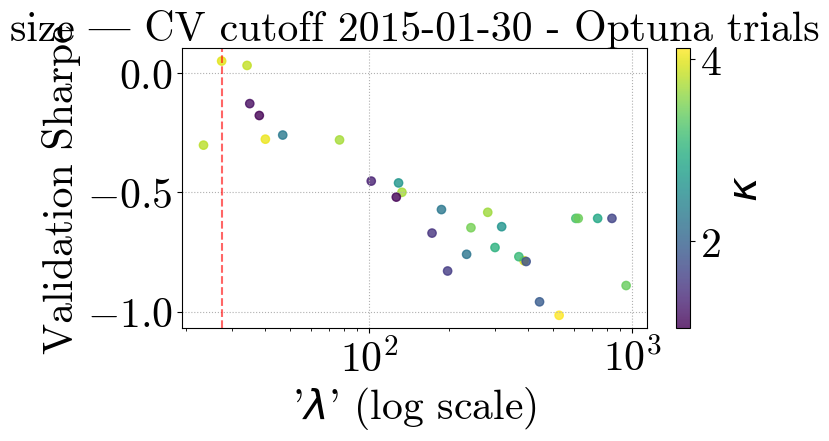

[I 2025-05-05 23:59:08,954] A new study created in memory with name: no-name-cf9b210b-22c4-49c5-9805-917a9a27855f
[I 2025-05-05 23:59:13,606] Trial 0 finished with value: -0.1972600689057503 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1972600689057503.
[I 2025-05-05 23:59:16,824] Trial 1 finished with value: -0.19726006890575035 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.1972600689057503.
[I 2025-05-05 23:59:22,271] Trial 2 finished with value: -0.19726006890575037 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.1972600689057503.
[I 2025-05-05 23:59:32,303] Trial 3 finished with value: -0.7972761702664855 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.1972600689057503.
[I 2025-05-05 23:59:35,305] Trial 4 finished with value: -0.19726006890575035 

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.1690


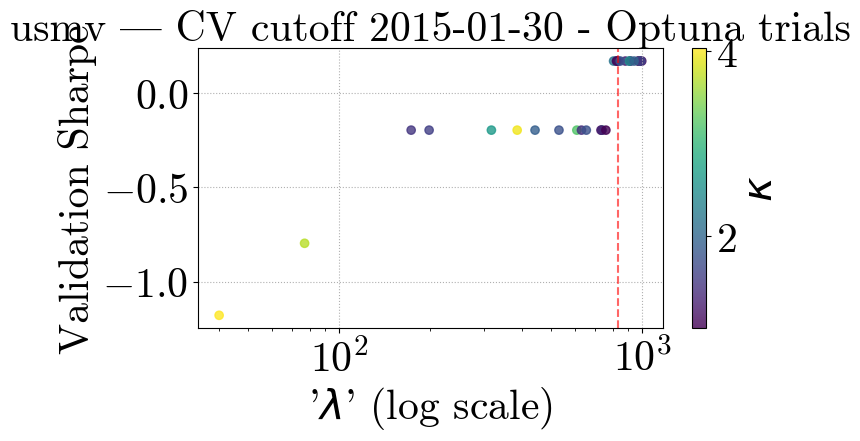

[I 2025-05-06 00:00:31,405] A new study created in memory with name: no-name-78b0e09b-00ec-4c2d-b9e2-3a4ebb7c455a
[I 2025-05-06 00:00:35,223] Trial 0 finished with value: 1.0912576623680366 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0912576623680366.
[I 2025-05-06 00:00:38,494] Trial 1 finished with value: 1.2643983285245732 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.2643983285245732.
[I 2025-05-06 00:00:45,638] Trial 2 finished with value: 1.1063375254274985 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.2643983285245732.
[I 2025-05-06 00:00:50,991] Trial 3 finished with value: 0.16467325965708415 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.2643983285245732.
[I 2025-05-06 00:00:54,637] Trial 4 finished with value: 1.2643983285245737 and paramet

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.2644


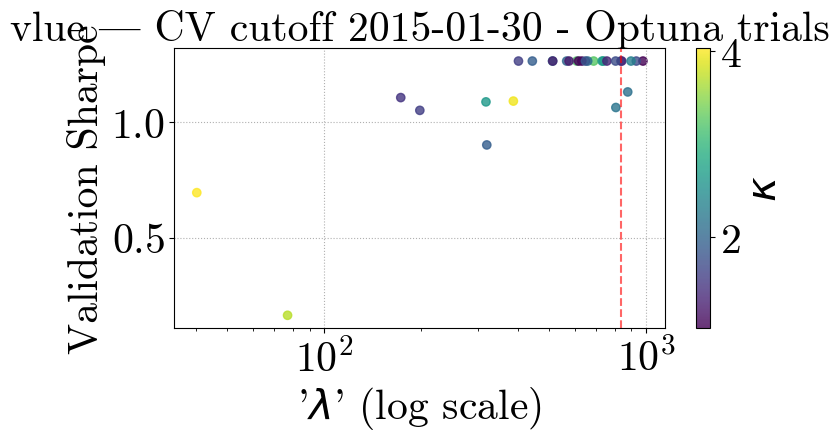

[I 2025-05-06 00:02:11,074] A new study created in memory with name: no-name-6203ac71-5415-4322-aa44-9ca6fa9038d7
[I 2025-05-06 00:02:15,620] Trial 0 finished with value: 0.25907801908147604 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.25907801908147604.
[I 2025-05-06 00:02:16,318] Trial 1 finished with value: 0.2590780190814761 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.2590780190814761.
[I 2025-05-06 00:02:33,836] Trial 2 finished with value: 0.259078019081476 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.2590780190814761.
[I 2025-05-06 00:02:41,402] Trial 3 finished with value: -1.1683473144874228 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.2590780190814761.
[I 2025-05-06 00:02:45,252] Trial 4 finished with value: 0.25907801908147604 and param

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.2591


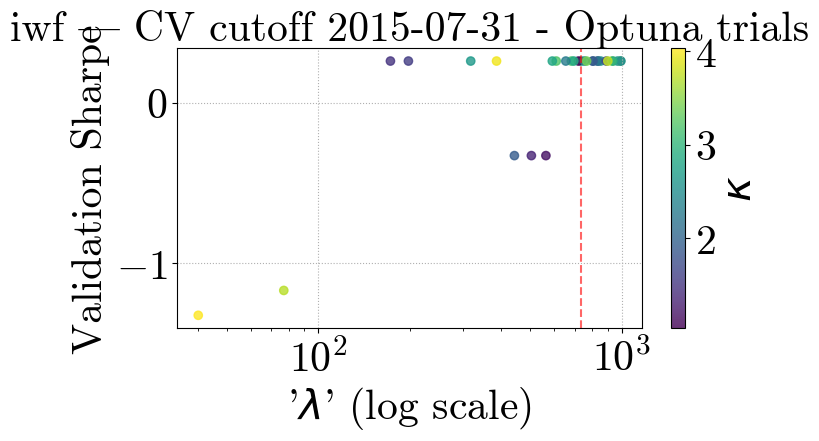

[I 2025-05-06 00:03:55,420] A new study created in memory with name: no-name-9bdbac6d-e293-45c7-acab-46c9225b77fa
[I 2025-05-06 00:03:59,104] Trial 0 finished with value: 0.9910353820043984 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.9910353820043984.
[I 2025-05-06 00:04:03,072] Trial 1 finished with value: 0.9910353820043984 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.9910353820043984.
[I 2025-05-06 00:04:08,972] Trial 2 finished with value: 0.9910353820043986 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9910353820043986.
[I 2025-05-06 00:04:18,519] Trial 3 finished with value: 0.7447869974239223 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.9910353820043986.
[I 2025-05-06 00:04:22,501] Trial 4 finished with value: 0.9910353820043984 and paramete

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.9910


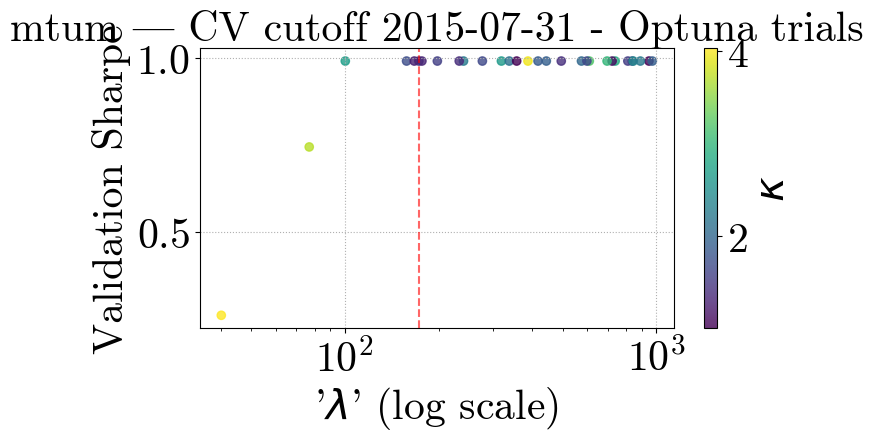

[I 2025-05-06 00:06:03,686] A new study created in memory with name: no-name-ff77010c-dda3-4e8a-a725-90bf0c6214ea
[I 2025-05-06 00:06:08,669] Trial 0 finished with value: -0.49879284817101405 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.49879284817101405.
[I 2025-05-06 00:06:12,304] Trial 1 finished with value: -0.49879284817101405 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.49879284817101405.
[I 2025-05-06 00:06:20,615] Trial 2 finished with value: -0.4987928481710138 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.4987928481710138.
[I 2025-05-06 00:06:28,237] Trial 3 finished with value: -1.2341565547069429 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.4987928481710138.
[I 2025-05-06 00:06:32,186] Trial 4 finished with value: -0.4987928481710140

Optuna best λ=408.7523, κ=1.271385935727363, Sharpe=0.4371


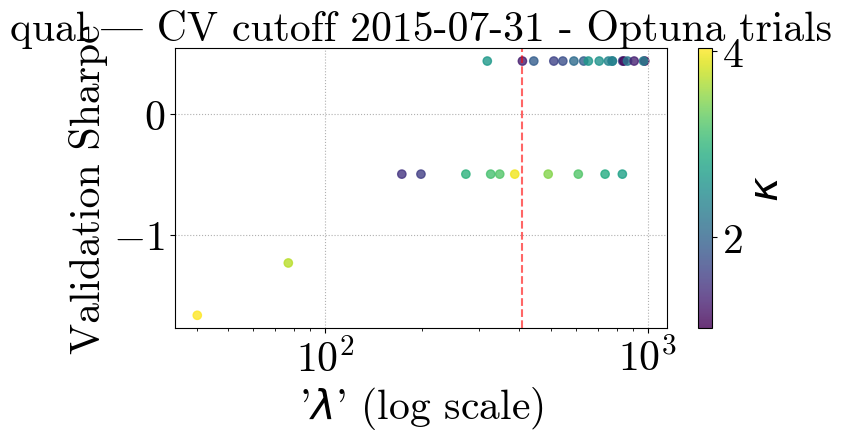

[I 2025-05-06 00:08:49,431] A new study created in memory with name: no-name-e1e892da-d22d-4bcc-84e0-2e5eb851b44d
[I 2025-05-06 00:08:54,132] Trial 0 finished with value: -0.4656401449576457 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.4656401449576457.
[I 2025-05-06 00:08:57,649] Trial 1 finished with value: -0.4203812464685511 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.4203812464685511.
[I 2025-05-06 00:09:02,333] Trial 2 finished with value: -0.3317789858874968 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.3317789858874968.
[I 2025-05-06 00:09:07,931] Trial 3 finished with value: -0.010530169107076 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.010530169107076.
[I 2025-05-06 00:09:11,516] Trial 4 finished with value: -0.5783242434166481 and p

Optuna best λ=34.2366, κ=3.5723657905253328, Sharpe=0.2832


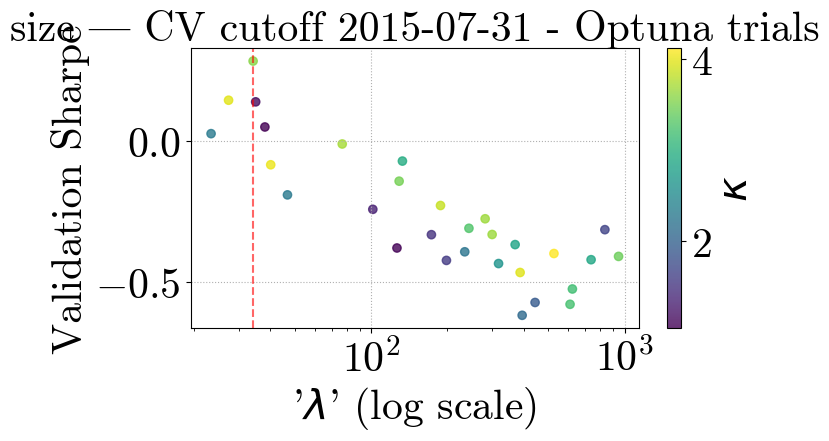

[I 2025-05-06 00:11:37,851] A new study created in memory with name: no-name-ffbb5488-7519-48fa-8cd6-1e219715eb0d
[I 2025-05-06 00:11:41,564] Trial 0 finished with value: 0.1783019574297574 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.1783019574297574.
[I 2025-05-06 00:11:45,714] Trial 1 finished with value: -0.7381630464130003 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.1783019574297574.
[I 2025-05-06 00:11:51,517] Trial 2 finished with value: -0.20922767009690116 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.1783019574297574.
[I 2025-05-06 00:12:01,016] Trial 3 finished with value: -0.18577629059883088 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.1783019574297574.
[I 2025-05-06 00:12:04,400] Trial 4 finished with value: 0.17830195742975738 and pa

Optuna best λ=625.8773, κ=2.2256718351156524, Sharpe=0.1783


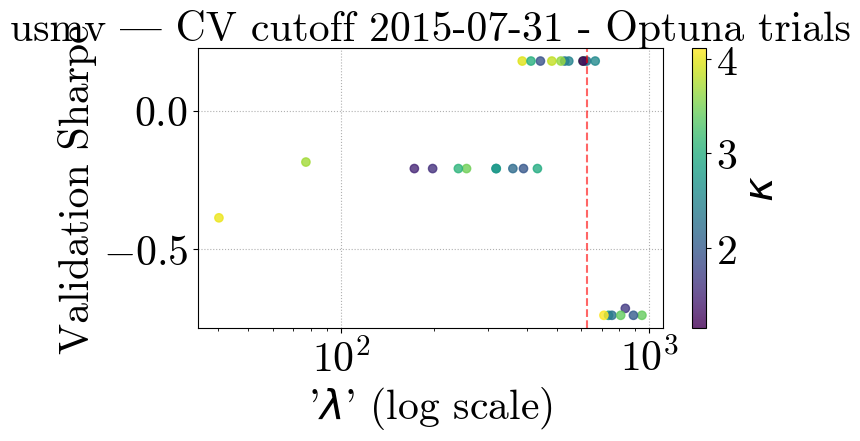

[I 2025-05-06 00:13:59,964] A new study created in memory with name: no-name-f3cdc96c-4935-4455-93a0-5b6424688fc6
[I 2025-05-06 00:14:03,550] Trial 0 finished with value: 1.4305388591755528 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.4305388591755528.
[I 2025-05-06 00:14:06,714] Trial 1 finished with value: 1.4305388591755526 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.4305388591755528.
[I 2025-05-06 00:14:14,313] Trial 2 finished with value: 1.296095714004689 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.4305388591755528.
[I 2025-05-06 00:14:20,398] Trial 3 finished with value: 0.7368239082592072 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.4305388591755528.
[I 2025-05-06 00:14:23,781] Trial 4 finished with value: 1.4305388591755526 and parameter

Optuna best λ=720.8662, κ=2.0739346614866854, Sharpe=1.4305


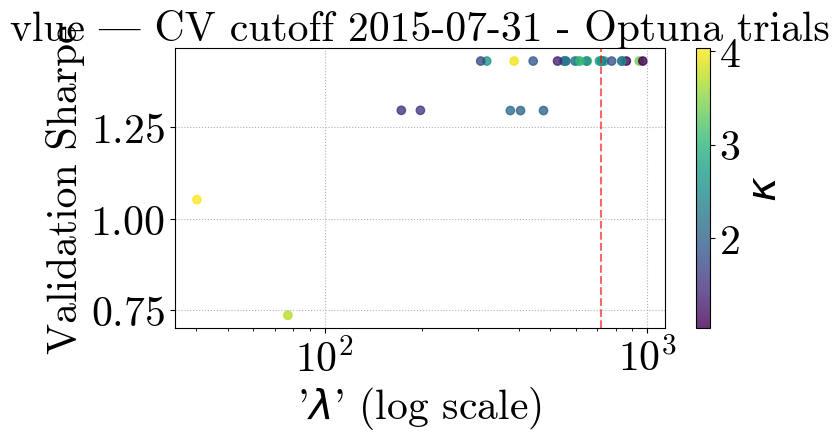

[I 2025-05-06 00:15:47,445] A new study created in memory with name: no-name-6c890cb6-a6ef-46ae-a5ea-a0bf36e796fc
[I 2025-05-06 00:15:51,861] Trial 0 finished with value: -0.9033097643163086 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.9033097643163086.
[I 2025-05-06 00:15:55,748] Trial 1 finished with value: -0.9033097643163086 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.9033097643163086.
[I 2025-05-06 00:16:11,244] Trial 2 finished with value: -0.9033097643163085 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.9033097643163085.
[I 2025-05-06 00:16:20,345] Trial 3 finished with value: -1.0764217980050355 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.9033097643163085.
[I 2025-05-06 00:16:24,363] Trial 4 finished with value: -0.9033097643163086 and

Optuna best λ=215.2239, κ=1.2301063237234902, Sharpe=0.2954


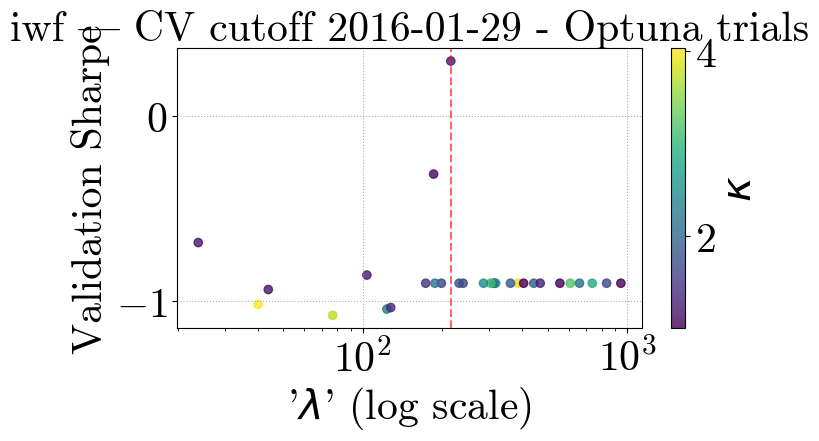

[I 2025-05-06 00:18:44,698] A new study created in memory with name: no-name-9b2ca8f3-defc-4cc1-a6b9-4851695dbaed
[I 2025-05-06 00:18:49,370] Trial 0 finished with value: 1.5140749278697996 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.5140749278697996.
[I 2025-05-06 00:18:52,929] Trial 1 finished with value: 1.5140749278697996 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.5140749278697996.
[I 2025-05-06 00:18:59,947] Trial 2 finished with value: 1.5140749278698 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.5140749278698.
[I 2025-05-06 00:19:09,128] Trial 3 finished with value: 0.8476719026376219 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.5140749278698.
[I 2025-05-06 00:19:12,667] Trial 4 finished with value: 1.5140749278697996 and parameters: {'lam

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=1.5141


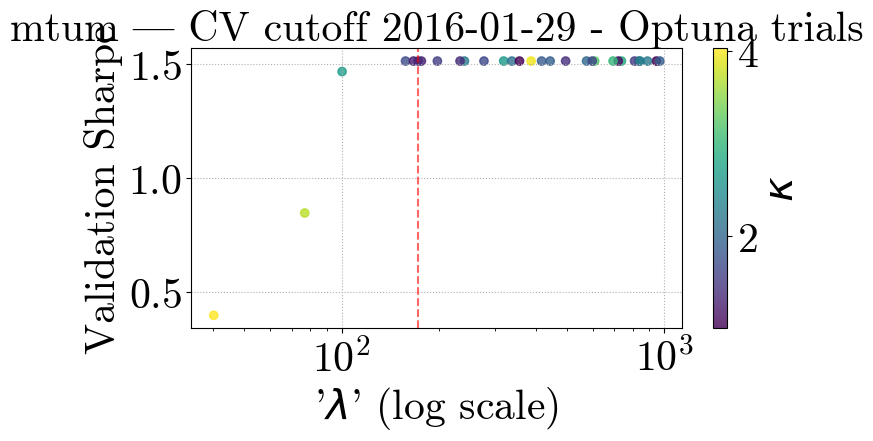

[I 2025-05-06 00:21:05,245] A new study created in memory with name: no-name-f45c3e76-c253-4f9b-a543-327d59d75f4a
[I 2025-05-06 00:21:08,595] Trial 0 finished with value: -1.3206481904067624 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.3206481904067624.
[I 2025-05-06 00:21:11,513] Trial 1 finished with value: -1.3206481904067624 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -1.3206481904067624.
[I 2025-05-06 00:21:18,592] Trial 2 finished with value: -0.6316263992509173 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.6316263992509173.
[I 2025-05-06 00:21:33,126] Trial 3 finished with value: -0.38328539186719607 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.38328539186719607.
[I 2025-05-06 00:21:36,196] Trial 4 finished with value: -1.3206481904067624 a

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=1.2638


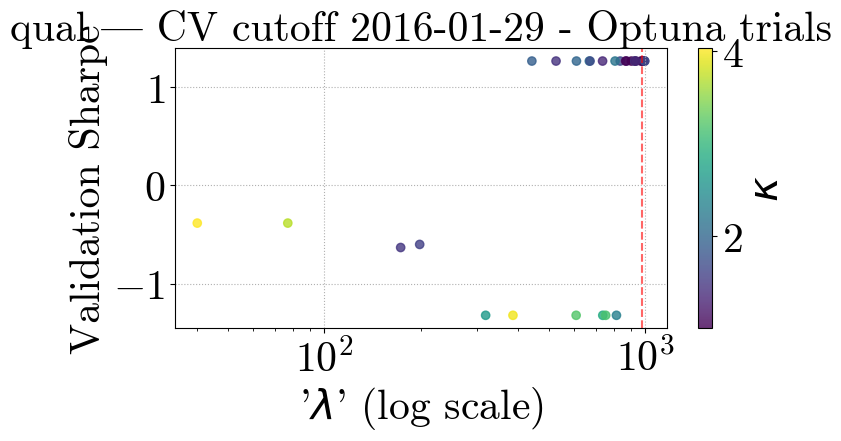

[I 2025-05-06 00:23:28,944] A new study created in memory with name: no-name-d107ea06-7e5a-4471-ae49-320c55e5ed9b
[I 2025-05-06 00:23:33,526] Trial 0 finished with value: -0.5043646286411044 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5043646286411044.
[I 2025-05-06 00:23:39,707] Trial 1 finished with value: -0.5266271807252789 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5043646286411044.
[I 2025-05-06 00:23:49,916] Trial 2 finished with value: -0.2977574179387238 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.2977574179387238.
[I 2025-05-06 00:23:55,995] Trial 3 finished with value: -0.14032596880923956 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.14032596880923956.
[I 2025-05-06 00:24:01,109] Trial 4 finished with value: -0.5266271807252789 a

Optuna best λ=23.3699, κ=1.9321629133842002, Sharpe=-0.0016


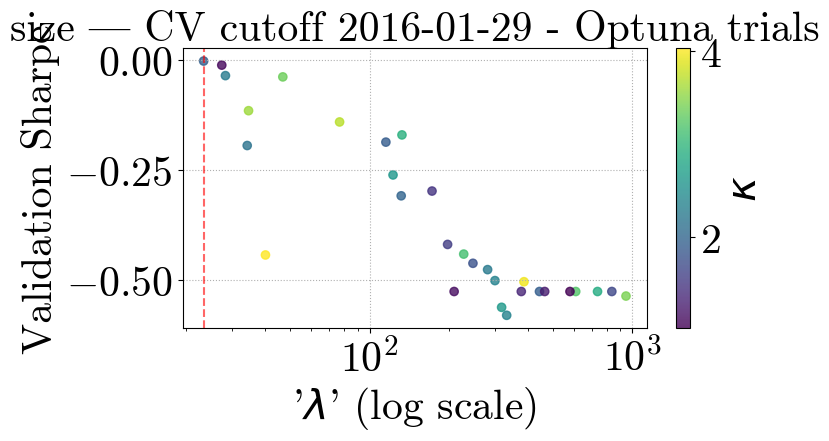

[I 2025-05-06 00:26:18,491] A new study created in memory with name: no-name-e55b6535-5015-419f-800c-fe484fd769b0
[I 2025-05-06 00:26:22,492] Trial 0 finished with value: -0.607288942668416 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.607288942668416.
[I 2025-05-06 00:26:26,789] Trial 1 finished with value: -0.7492378096553977 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.607288942668416.
[I 2025-05-06 00:26:35,244] Trial 2 finished with value: -0.7204840069991914 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.607288942668416.
[I 2025-05-06 00:26:45,524] Trial 3 finished with value: 0.20868930803420796 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.20868930803420796.
[I 2025-05-06 00:26:48,845] Trial 4 finished with value: -0.6072889426684162 and par

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.2087


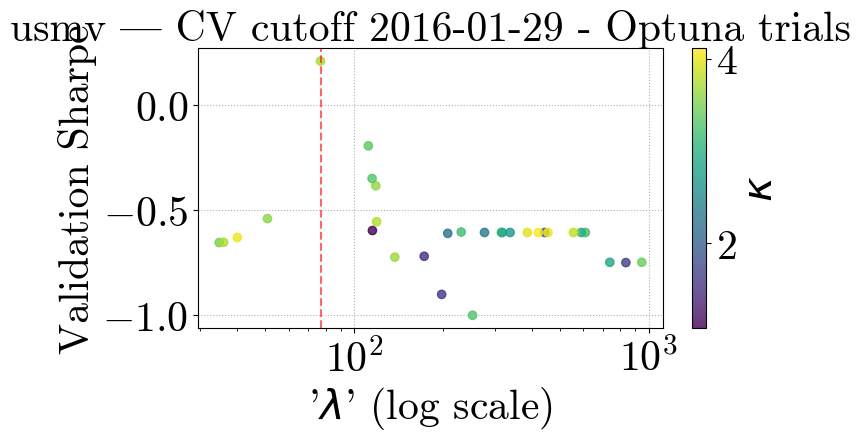

[I 2025-05-06 00:29:43,006] A new study created in memory with name: no-name-75be472b-5873-4c29-bffe-289eaa00732e
[I 2025-05-06 00:29:48,250] Trial 0 finished with value: 1.049669190125126 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.049669190125126.
[I 2025-05-06 00:29:51,089] Trial 1 finished with value: 0.255463925631183 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.049669190125126.
[I 2025-05-06 00:30:00,291] Trial 2 finished with value: 1.1854723305675234 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.1854723305675234.
[I 2025-05-06 00:30:05,439] Trial 3 finished with value: 0.9594196582897053 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.1854723305675234.
[I 2025-05-06 00:30:08,669] Trial 4 finished with value: 0.620631633926396 and parameters: {

Optuna best λ=240.1798, κ=3.7629494035516347, Sharpe=1.2789


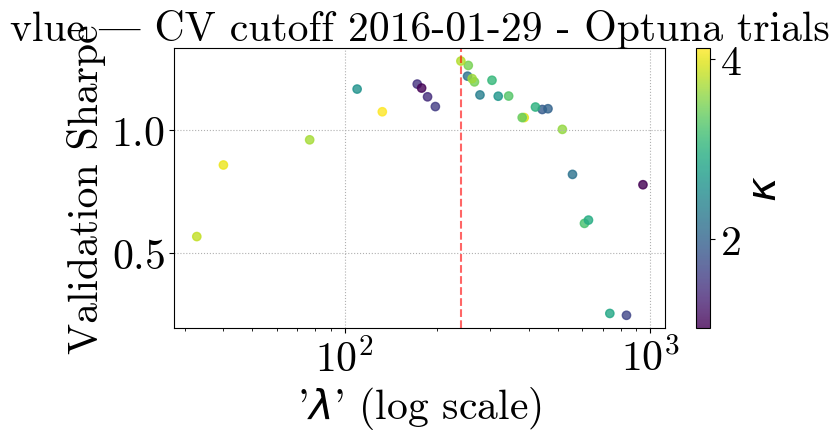

[I 2025-05-06 00:32:26,552] A new study created in memory with name: no-name-33fd895d-3c31-4c86-8649-7a55b7493f4b
[I 2025-05-06 00:32:34,905] Trial 0 finished with value: -0.7493239144314642 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7493239144314642.
[I 2025-05-06 00:32:39,374] Trial 1 finished with value: -0.7493239144314643 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.7493239144314642.
[I 2025-05-06 00:32:57,205] Trial 2 finished with value: -0.7493239144314641 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.7493239144314641.
[I 2025-05-06 00:33:05,754] Trial 3 finished with value: -1.1662374546208825 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.7493239144314641.
[I 2025-05-06 00:33:12,251] Trial 4 finished with value: -0.7493239144314642 and

Optuna best λ=176.8528, κ=1.3230609934850297, Sharpe=-0.6430


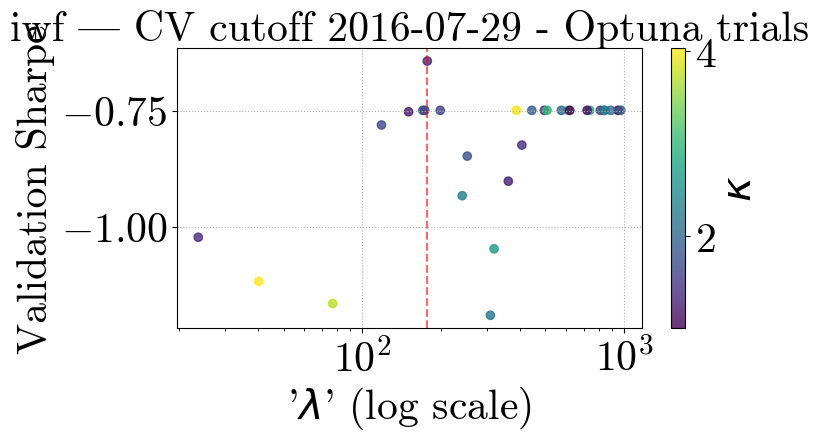

[I 2025-05-06 00:35:43,255] A new study created in memory with name: no-name-ddd20e3b-5543-4c4c-9b6b-ee064a0adcdf
[I 2025-05-06 00:35:48,361] Trial 0 finished with value: 1.1674729425940265 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.1674729425940265.
[I 2025-05-06 00:35:53,355] Trial 1 finished with value: 1.1674729425940265 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.1674729425940265.
[I 2025-05-06 00:35:59,620] Trial 2 finished with value: 1.1991530844329243 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.1991530844329243.
[I 2025-05-06 00:36:12,538] Trial 3 finished with value: 0.8037740926657152 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.1991530844329243.
[I 2025-05-06 00:36:17,143] Trial 4 finished with value: 1.1674729425940265 and paramete

Optuna best λ=112.1492, κ=1.501841895750529, Sharpe=1.6078


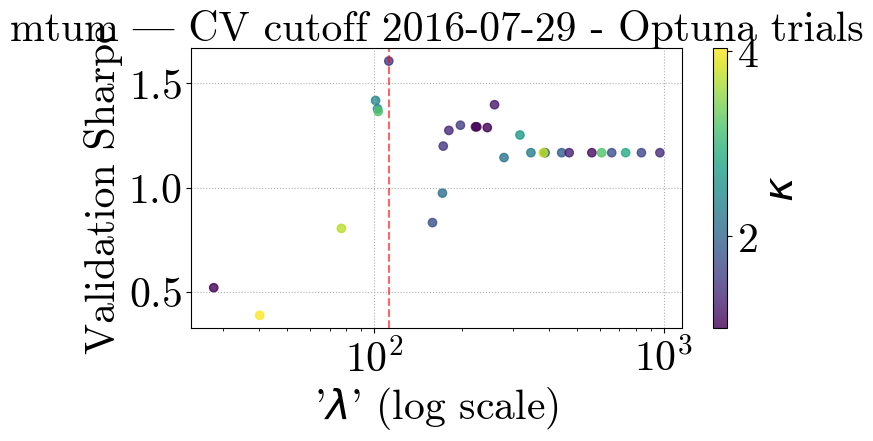

[I 2025-05-06 00:38:22,052] A new study created in memory with name: no-name-a13d85f1-a1a9-43a1-8526-6eca9b909354
[I 2025-05-06 00:38:25,753] Trial 0 finished with value: -1.0202249413153246 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0202249413153246.
[I 2025-05-06 00:38:29,185] Trial 1 finished with value: -1.0202249413153246 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -1.0202249413153246.
[I 2025-05-06 00:38:38,949] Trial 2 finished with value: -0.06759686167299862 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.06759686167299862.
[I 2025-05-06 00:38:48,916] Trial 3 finished with value: -0.31331150051972045 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.06759686167299862.
[I 2025-05-06 00:38:52,236] Trial 4 finished with value: -1.0202249413153246

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.9665


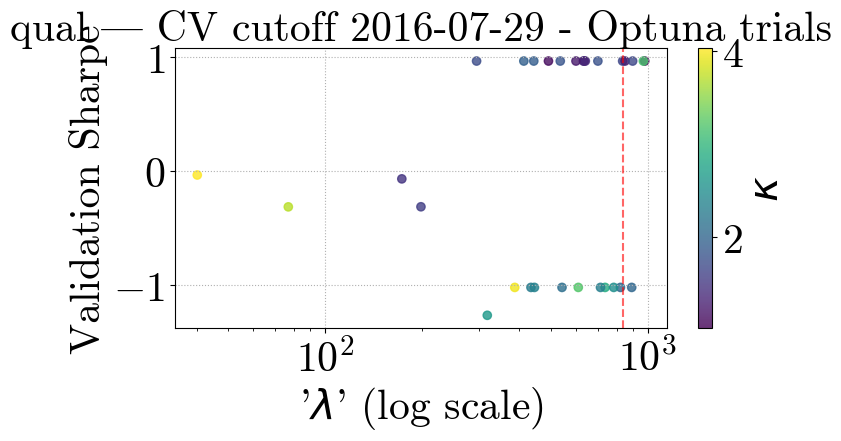

[I 2025-05-06 00:41:35,203] A new study created in memory with name: no-name-0ad3bb96-2515-478d-a7df-6ac1f44c9f43
[I 2025-05-06 00:41:40,101] Trial 0 finished with value: -0.26398119305515894 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.26398119305515894.
[I 2025-05-06 00:41:45,052] Trial 1 finished with value: -0.4577763197786391 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.26398119305515894.
[I 2025-05-06 00:41:55,281] Trial 2 finished with value: -0.20879571314152248 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.20879571314152248.
[I 2025-05-06 00:42:05,688] Trial 3 finished with value: 0.037407508632980736 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.037407508632980736.
[I 2025-05-06 00:42:11,367] Trial 4 finished with value: -0.4577763197786

Optuna best λ=151.7421, κ=3.3518251112732322, Sharpe=0.0575


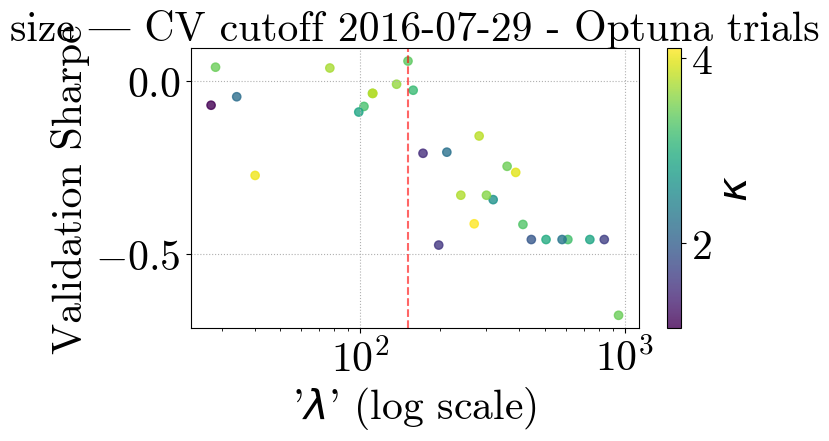

[I 2025-05-06 00:45:16,651] A new study created in memory with name: no-name-413ec913-8175-42b7-ab7f-fccb3f37dc53
[I 2025-05-06 00:45:22,148] Trial 0 finished with value: -0.6479929154580814 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6479929154580814.
[I 2025-05-06 00:45:27,200] Trial 1 finished with value: -0.21907031224931475 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.21907031224931475.
[I 2025-05-06 00:45:33,135] Trial 2 finished with value: -0.626901020602638 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.21907031224931475.
[I 2025-05-06 00:45:43,594] Trial 3 finished with value: 0.3599615488225508 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.3599615488225508.
[I 2025-05-06 00:45:46,429] Trial 4 finished with value: -0.6479929154580815 and

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.3600


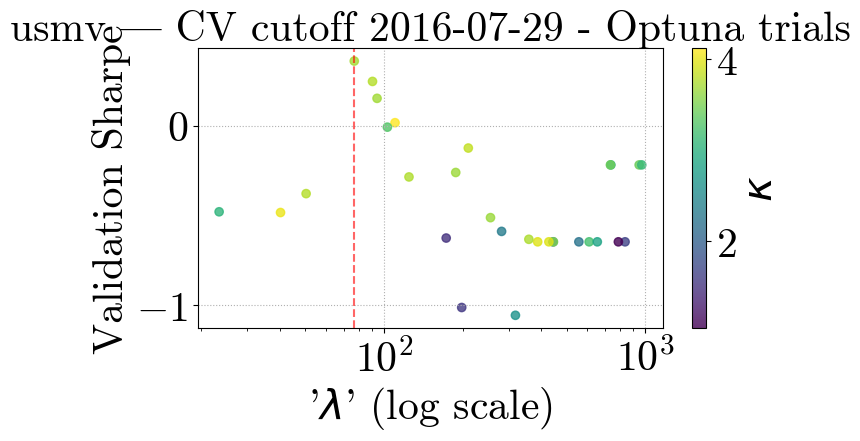

[I 2025-05-06 00:48:40,415] A new study created in memory with name: no-name-c9acb1f6-ba14-4559-90c3-65eb24e2f16f
[I 2025-05-06 00:48:46,346] Trial 0 finished with value: 0.1641315440575335 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.1641315440575335.
[I 2025-05-06 00:48:52,531] Trial 1 finished with value: -0.016000281455949294 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.1641315440575335.
[I 2025-05-06 00:49:01,367] Trial 2 finished with value: 0.1661621744978313 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.1661621744978313.
[I 2025-05-06 00:49:07,613] Trial 3 finished with value: -0.24646040676125075 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.1661621744978313.
[I 2025-05-06 00:49:14,532] Trial 4 finished with value: -0.02873754474170781 and p

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.4928


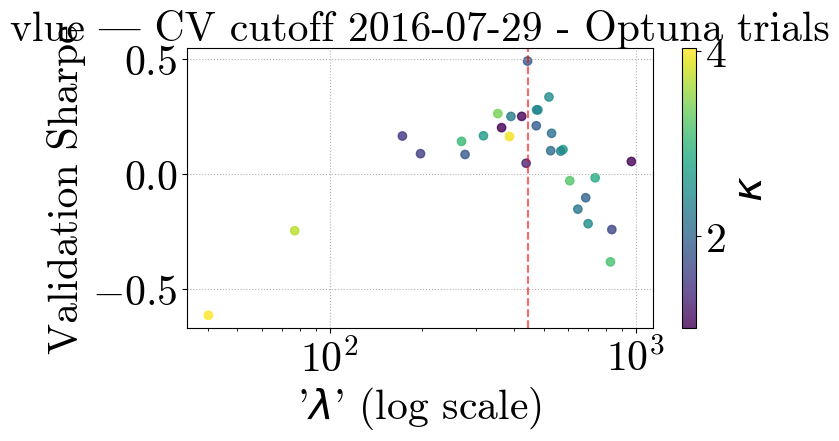

[I 2025-05-06 00:51:27,628] A new study created in memory with name: no-name-cf62f692-64fa-4934-8ea1-844bad5ca183
[I 2025-05-06 00:51:35,292] Trial 0 finished with value: -0.18740128584793359 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.18740128584793359.
[I 2025-05-06 00:51:41,944] Trial 1 finished with value: -0.18740128584793359 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.18740128584793359.
[I 2025-05-06 00:51:50,728] Trial 2 finished with value: -0.5568073602703354 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.18740128584793359.
[I 2025-05-06 00:52:01,079] Trial 3 finished with value: -1.332916813002328 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.18740128584793359.
[I 2025-05-06 00:52:06,828] Trial 4 finished with value: -0.187401285847933

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=-0.1874


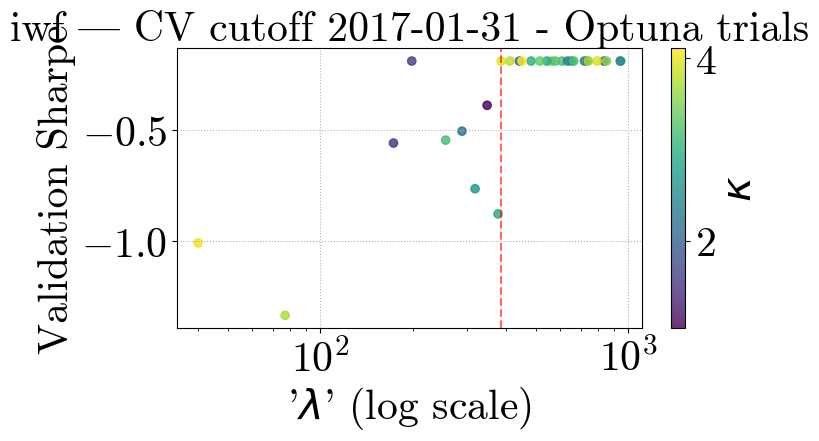

[I 2025-05-06 00:54:43,646] A new study created in memory with name: no-name-26398a62-136b-412a-990f-b8b98240e28d
[I 2025-05-06 00:54:48,088] Trial 0 finished with value: 0.7204171272148998 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7204171272148998.
[I 2025-05-06 00:54:52,894] Trial 1 finished with value: 0.7204171272148998 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7204171272148998.
[I 2025-05-06 00:54:58,561] Trial 2 finished with value: 0.7761840109156954 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.7761840109156954.
[I 2025-05-06 00:55:09,559] Trial 3 finished with value: 0.7514476102566139 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.7761840109156954.
[I 2025-05-06 00:55:14,240] Trial 4 finished with value: 0.7204171272148998 and paramete

Optuna best λ=104.6458, κ=3.681208076742638, Sharpe=1.2010


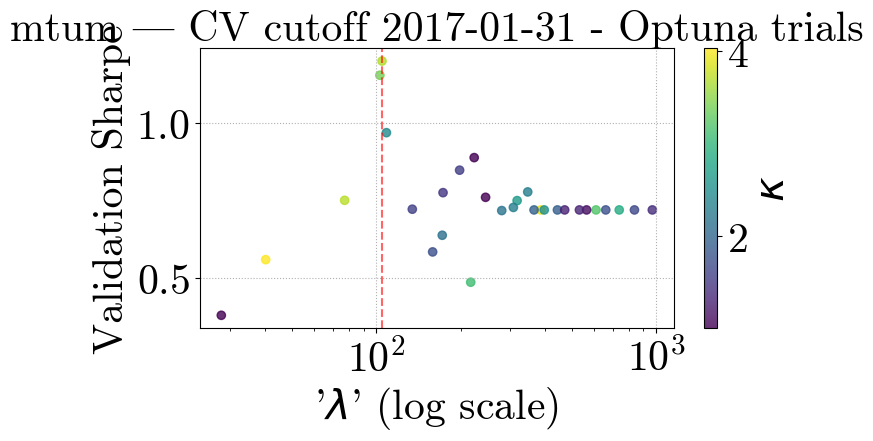

[I 2025-05-06 00:57:49,174] A new study created in memory with name: no-name-fc2e6fba-436b-467b-8a5b-e321d3a32cd3
[I 2025-05-06 00:57:54,073] Trial 0 finished with value: -0.6718273880958837 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6718273880958837.
[I 2025-05-06 00:57:58,243] Trial 1 finished with value: -0.6718273880958837 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.6718273880958837.
[I 2025-05-06 00:58:04,489] Trial 2 finished with value: 0.3148514368540538 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.3148514368540538.
[I 2025-05-06 00:58:12,947] Trial 3 finished with value: -0.2578184259053829 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.3148514368540538.
[I 2025-05-06 00:58:17,860] Trial 4 finished with value: -0.6718273880958837 and pa

Optuna best λ=805.2383, κ=2.1855441481340363, Sharpe=0.6201


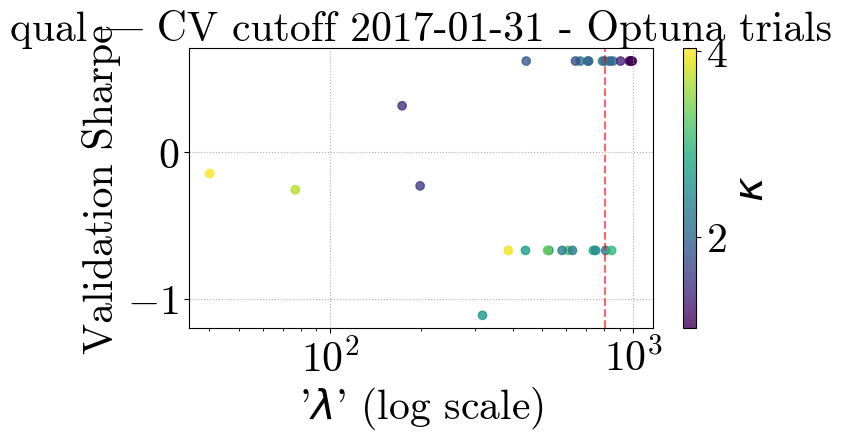

[I 2025-05-06 01:00:57,845] A new study created in memory with name: no-name-3fb1ba2c-397a-4ced-b135-ce6b4fadef56
[I 2025-05-06 01:01:03,385] Trial 0 finished with value: -0.30109496935288854 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.30109496935288854.
[I 2025-05-06 01:01:08,658] Trial 1 finished with value: -0.4912598603835876 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.30109496935288854.
[I 2025-05-06 01:01:17,019] Trial 2 finished with value: -0.15484166234409538 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.15484166234409538.
[I 2025-05-06 01:01:26,759] Trial 3 finished with value: 0.04544192668589756 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.04544192668589756.
[I 2025-05-06 01:01:32,559] Trial 4 finished with value: -0.491259860383587

Optuna best λ=38.1030, κ=1.0411523272835175, Sharpe=0.3600


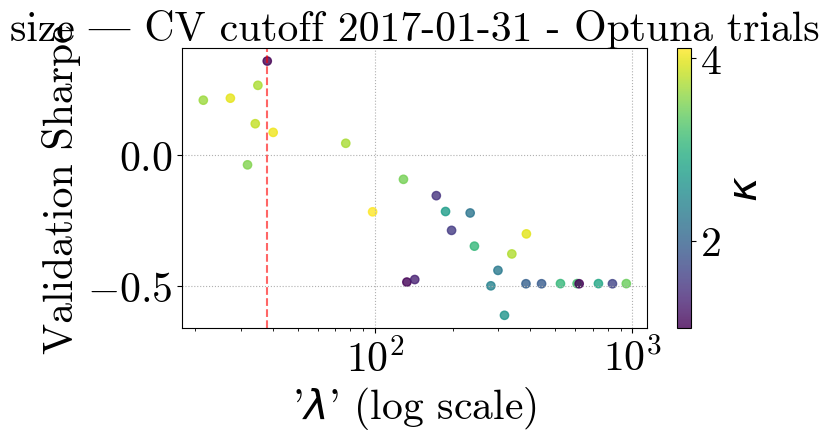

[I 2025-05-06 01:04:36,358] A new study created in memory with name: no-name-59667cb3-8513-4271-a349-0f4d40742018
[I 2025-05-06 01:04:41,472] Trial 0 finished with value: -1.1611231415150884 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.1611231415150884.
[I 2025-05-06 01:04:50,819] Trial 1 finished with value: -0.2128391430141303 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.2128391430141303.
[I 2025-05-06 01:04:56,503] Trial 2 finished with value: -1.068126193306954 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.2128391430141303.
[I 2025-05-06 01:05:09,756] Trial 3 finished with value: -0.2544413854492301 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.2128391430141303.
[I 2025-05-06 01:05:13,086] Trial 4 finished with value: -0.5628521889840575 and 

Optuna best λ=787.9570, κ=1.0411523272835175, Sharpe=0.0493


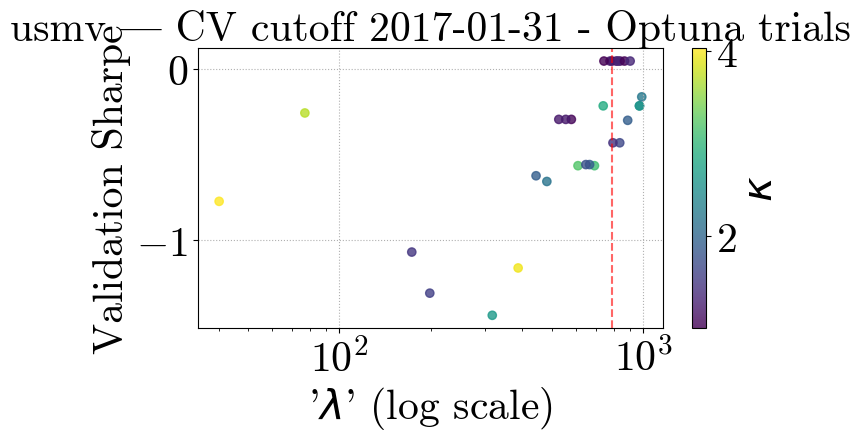

[I 2025-05-06 01:06:55,458] A new study created in memory with name: no-name-6299d5c9-808e-459d-b5c3-9e84f97aa1ea
[I 2025-05-06 01:07:01,589] Trial 0 finished with value: 0.7048151178007016 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7048151178007016.
[I 2025-05-06 01:07:05,872] Trial 1 finished with value: 0.19438666568302868 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7048151178007016.
[I 2025-05-06 01:07:14,025] Trial 2 finished with value: 0.6529782880184692 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7048151178007016.
[I 2025-05-06 01:07:21,623] Trial 3 finished with value: 0.3593078973353714 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.7048151178007016.
[I 2025-05-06 01:07:25,772] Trial 4 finished with value: 0.8077970603925805 and paramet

Optuna best λ=375.7770, κ=4.1131647857769, Sharpe=0.9053


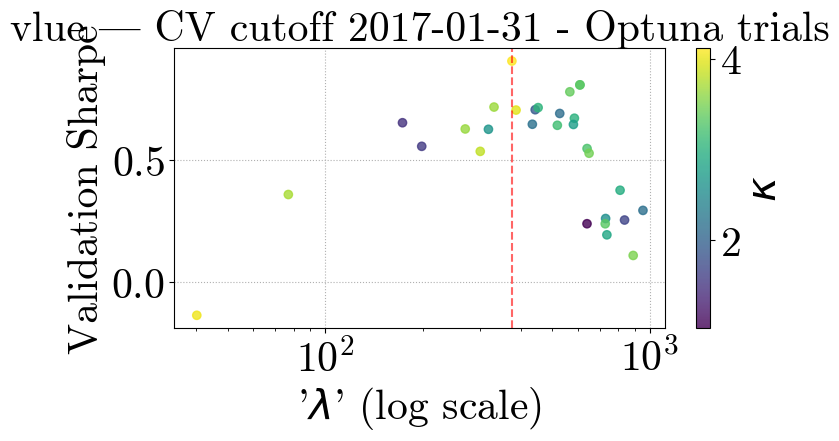

[I 2025-05-06 01:09:46,034] A new study created in memory with name: no-name-3e381a5c-cb2e-4db4-8684-bec18ce02ab1
[I 2025-05-06 01:09:55,002] Trial 0 finished with value: -1.1573765641935765 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.1573765641935765.
[I 2025-05-06 01:10:03,351] Trial 1 finished with value: -0.6528862251635108 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6528862251635108.
[I 2025-05-06 01:10:10,785] Trial 2 finished with value: -0.6595494497277986 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.6528862251635108.
[I 2025-05-06 01:10:19,552] Trial 3 finished with value: -1.7127576056868707 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.6528862251635108.
[I 2025-05-06 01:10:26,903] Trial 4 finished with value: -0.6528862251635108 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=-0.6529


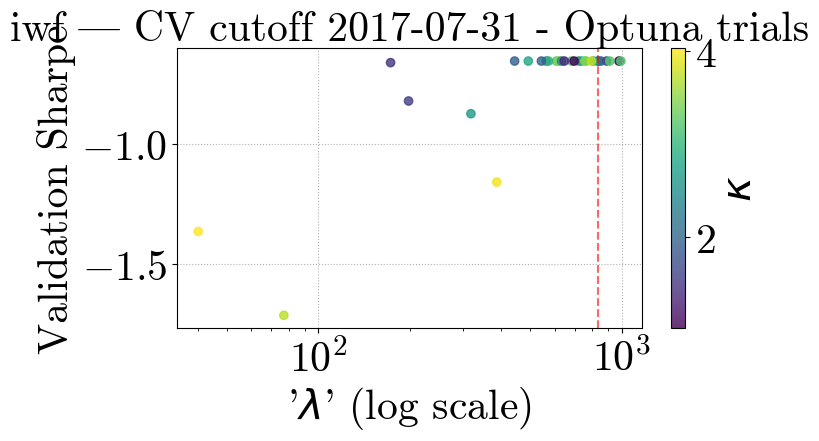

[I 2025-05-06 01:12:50,373] A new study created in memory with name: no-name-60311f02-d988-42a1-a16d-df2c4e76d519
[I 2025-05-06 01:12:54,401] Trial 0 finished with value: 1.2156741600348933 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.2156741600348933.
[I 2025-05-06 01:12:58,320] Trial 1 finished with value: 1.2156741600348933 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.2156741600348933.
[I 2025-05-06 01:13:06,269] Trial 2 finished with value: 1.2321825307758056 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.2321825307758056.
[I 2025-05-06 01:13:20,417] Trial 3 finished with value: 1.7150035841370006 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.7150035841370006.
[I 2025-05-06 01:13:24,684] Trial 4 finished with value: 1.2156741600348933 and paramete

Optuna best λ=78.1920, κ=1.9476948493779247, Sharpe=1.7155


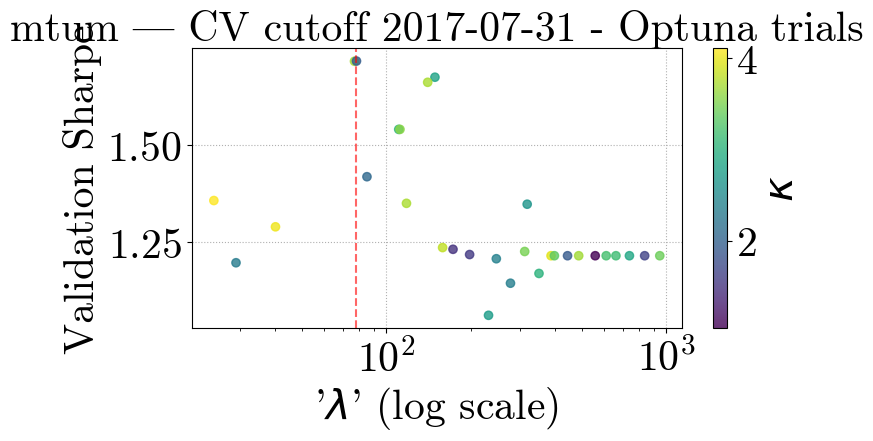

[I 2025-05-06 01:16:59,682] A new study created in memory with name: no-name-22f19bb2-6c22-400e-8ead-4d3d89215113
[I 2025-05-06 01:17:07,300] Trial 0 finished with value: -0.7542172323493167 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7542172323493167.
[I 2025-05-06 01:17:12,701] Trial 1 finished with value: -0.7542172323493167 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.7542172323493167.
[I 2025-05-06 01:17:19,348] Trial 2 finished with value: 0.46176369638403075 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.46176369638403075.
[I 2025-05-06 01:17:28,573] Trial 3 finished with value: -0.2553107199142029 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.46176369638403075.
[I 2025-05-06 01:17:33,732] Trial 4 finished with value: -0.7542172323493167 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.7031


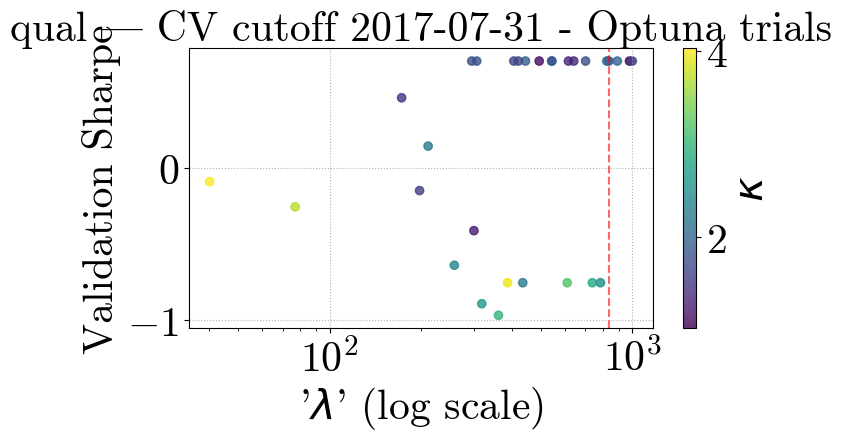

[I 2025-05-06 01:20:40,930] A new study created in memory with name: no-name-ccd877cb-1c31-418a-8c9e-c2475d497084
[I 2025-05-06 01:20:47,930] Trial 0 finished with value: 0.2927547673846034 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2927547673846034.
[I 2025-05-06 01:20:52,998] Trial 1 finished with value: -0.3140299762554735 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.2927547673846034.
[I 2025-05-06 01:21:00,762] Trial 2 finished with value: 0.2593177563763283 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.2927547673846034.
[I 2025-05-06 01:21:12,161] Trial 3 finished with value: 0.5168133820523654 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5168133820523654.
[I 2025-05-06 01:21:18,114] Trial 4 finished with value: -0.3140299762554735 and parame

Optuna best λ=28.2918, κ=3.7164421443642444, Sharpe=0.5878


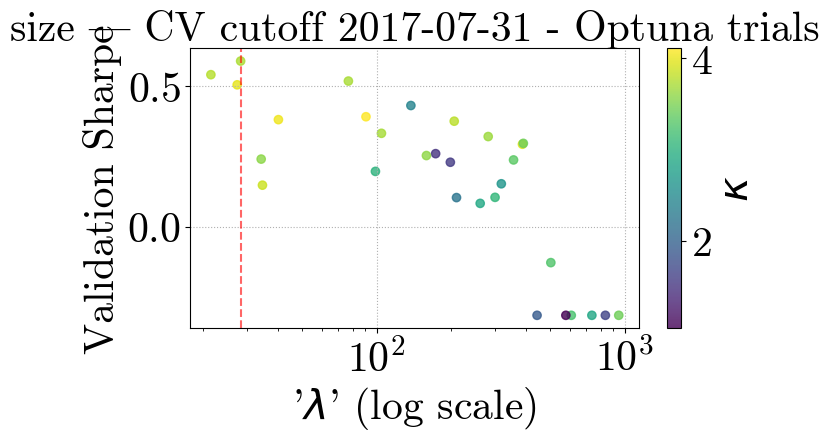

[I 2025-05-06 01:24:42,862] A new study created in memory with name: no-name-f93d64ba-f86b-4a39-94ae-002e73b99195
[I 2025-05-06 01:24:46,908] Trial 0 finished with value: -1.1071226776461636 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.1071226776461636.
[I 2025-05-06 01:24:52,964] Trial 1 finished with value: 1.1185934967033453 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.1185934967033453.
[I 2025-05-06 01:25:01,728] Trial 2 finished with value: -1.1885866393699644 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.1185934967033453.
[I 2025-05-06 01:25:12,366] Trial 3 finished with value: -0.18806132265947284 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.1185934967033453.
[I 2025-05-06 01:25:15,381] Trial 4 finished with value: -0.4227738623111737 and pa

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=1.1186


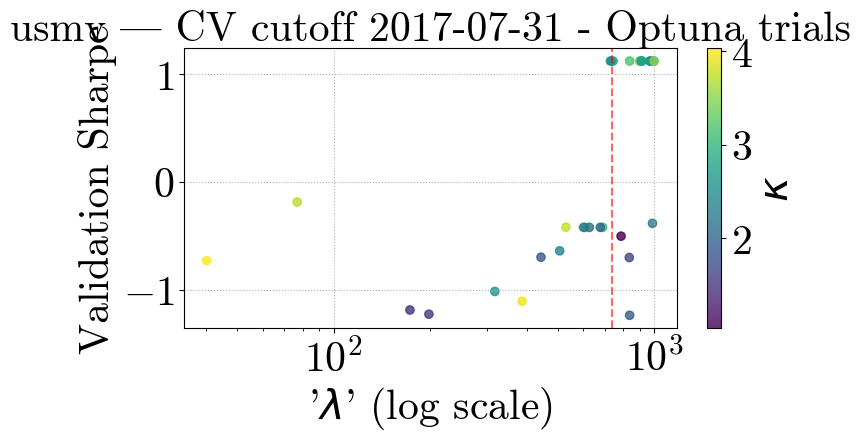

[I 2025-05-06 01:27:27,059] A new study created in memory with name: no-name-b469bcf2-c018-4ee1-9576-c8f227e40e2b
[I 2025-05-06 01:27:31,760] Trial 0 finished with value: 0.2937106957629821 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2937106957629821.
[I 2025-05-06 01:27:36,427] Trial 1 finished with value: -0.2474270661762943 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.2937106957629821.
[I 2025-05-06 01:27:44,145] Trial 2 finished with value: 0.09238779603019932 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.2937106957629821.
[I 2025-05-06 01:27:49,862] Trial 3 finished with value: -0.18664387261074755 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.2937106957629821.
[I 2025-05-06 01:27:53,760] Trial 4 finished with value: 0.09966864310097187 and par

Optuna best λ=360.6808, κ=1.417247520884584, Sharpe=0.4210


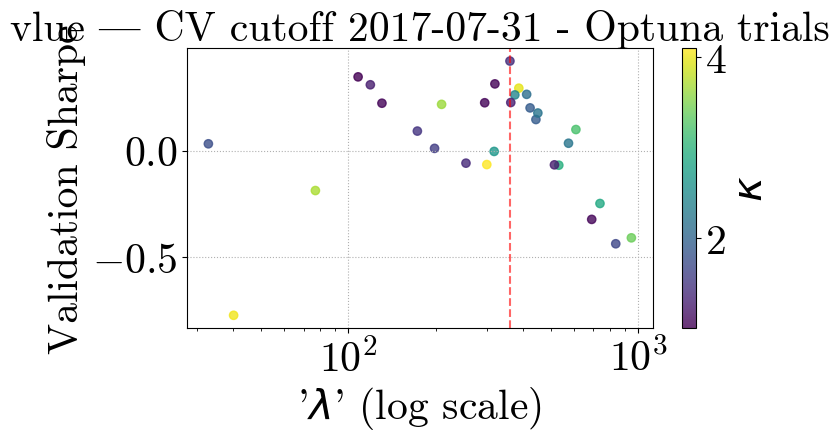

[I 2025-05-06 01:30:11,399] A new study created in memory with name: no-name-c9a6b3d7-8bdc-4901-ba52-da7908848bf9
[I 2025-05-06 01:30:17,725] Trial 0 finished with value: -0.5174349307624685 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5174349307624685.
[I 2025-05-06 01:30:23,759] Trial 1 finished with value: -0.8472310464133943 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5174349307624685.
[I 2025-05-06 01:30:28,890] Trial 2 finished with value: -0.6307554209251395 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.5174349307624685.
[I 2025-05-06 01:30:37,443] Trial 3 finished with value: -1.850761492081129 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.5174349307624685.
[I 2025-05-06 01:30:42,594] Trial 4 finished with value: -0.8472310464133943 and 

Optuna best λ=269.8500, κ=2.4258331254949925, Sharpe=0.0167


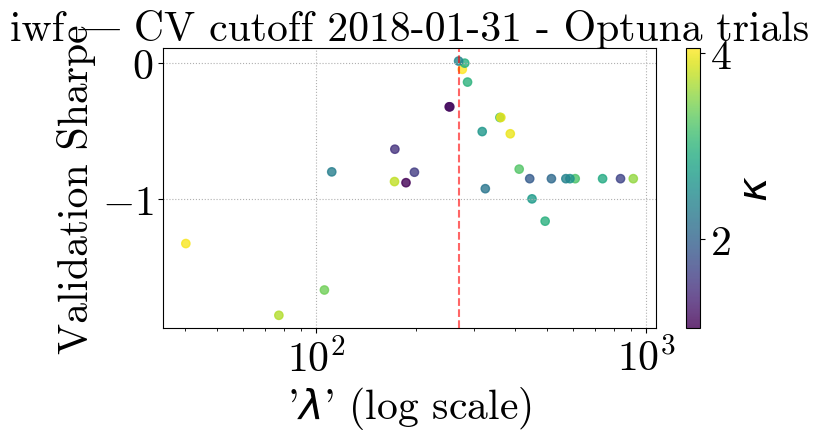

[I 2025-05-06 01:33:17,276] A new study created in memory with name: no-name-48d35954-0b1b-4c08-a3b6-18ad14ef349e
[I 2025-05-06 01:33:21,840] Trial 0 finished with value: 1.3556322732774067 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.3556322732774067.
[I 2025-05-06 01:33:26,389] Trial 1 finished with value: 1.3556322732774067 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.3556322732774067.
[I 2025-05-06 01:33:34,190] Trial 2 finished with value: 1.413024963822613 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.413024963822613.
[I 2025-05-06 01:33:50,641] Trial 3 finished with value: 1.8757073741364174 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.8757073741364174.
[I 2025-05-06 01:33:54,358] Trial 4 finished with value: 1.3556322732774067 and parameters

Optuna best λ=93.8557, κ=3.0627018391420346, Sharpe=2.1232


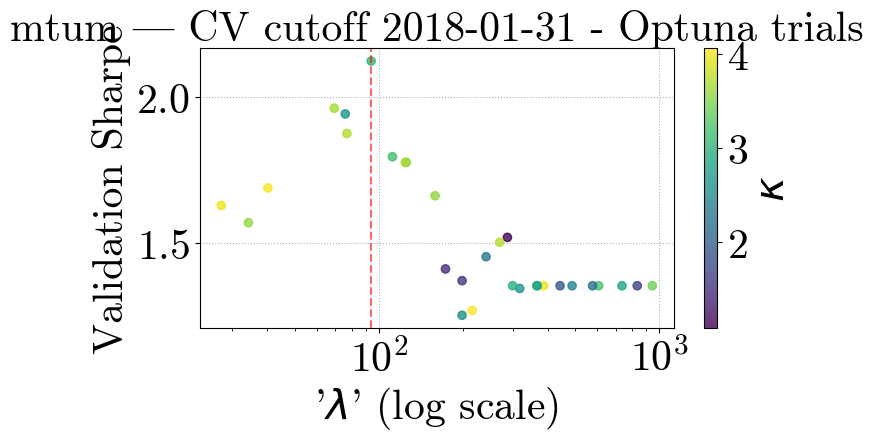

[I 2025-05-06 01:37:32,706] A new study created in memory with name: no-name-5d773a2e-9e6d-4028-9dab-f26c04486abd
[I 2025-05-06 01:37:39,071] Trial 0 finished with value: 0.6330556445527298 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6330556445527298.
[I 2025-05-06 01:37:44,140] Trial 1 finished with value: 0.6330556445527298 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6330556445527298.
[I 2025-05-06 01:37:53,340] Trial 2 finished with value: 0.36728444886266687 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6330556445527298.
[I 2025-05-06 01:38:05,805] Trial 3 finished with value: -0.11322259889545613 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6330556445527298.
[I 2025-05-06 01:38:11,038] Trial 4 finished with value: 0.6330556445527298 and param

Optuna best λ=531.1417, κ=2.1258152001831987, Sharpe=0.6331


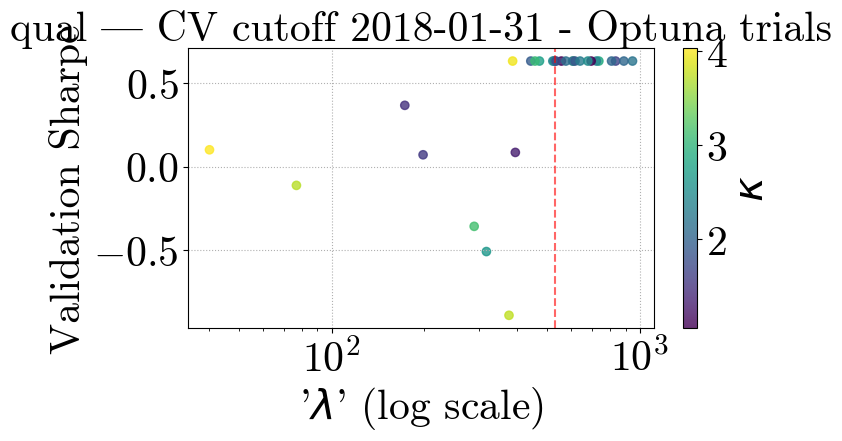

[I 2025-05-06 01:40:51,134] A new study created in memory with name: no-name-473b04e3-f67b-4e68-9f73-32bdae961046
[I 2025-05-06 01:40:55,702] Trial 0 finished with value: -0.11054680234633486 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.11054680234633486.
[I 2025-05-06 01:40:59,555] Trial 1 finished with value: -0.06528121565395081 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.06528121565395081.
[I 2025-05-06 01:41:08,706] Trial 2 finished with value: 0.02762520254939582 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.02762520254939582.
[I 2025-05-06 01:41:19,451] Trial 3 finished with value: 0.23665834650335066 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.23665834650335066.
[I 2025-05-06 01:41:23,188] Trial 4 finished with value: -0.1105468023463348

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.2367


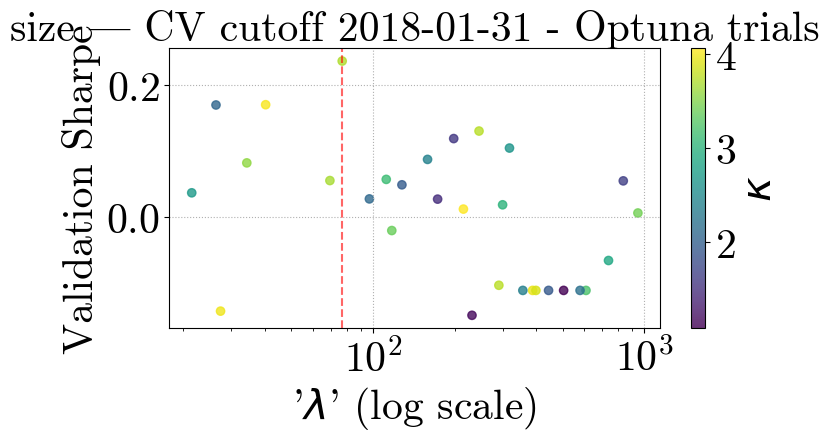

[I 2025-05-06 01:44:42,720] A new study created in memory with name: no-name-0004cb8f-4db8-4d28-880a-2a1ae345fad1
[I 2025-05-06 01:44:46,519] Trial 0 finished with value: -0.7441919578049444 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7441919578049444.
[I 2025-05-06 01:44:54,018] Trial 1 finished with value: 0.0735032180556812 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.0735032180556812.
[I 2025-05-06 01:45:00,217] Trial 2 finished with value: -0.5233266390432241 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.0735032180556812.
[I 2025-05-06 01:45:12,503] Trial 3 finished with value: -0.07993339798742854 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.0735032180556812.
[I 2025-05-06 01:45:18,367] Trial 4 finished with value: 0.0735032180556812 and par

Optuna best λ=787.9570, κ=2.1855441481340363, Sharpe=0.0735


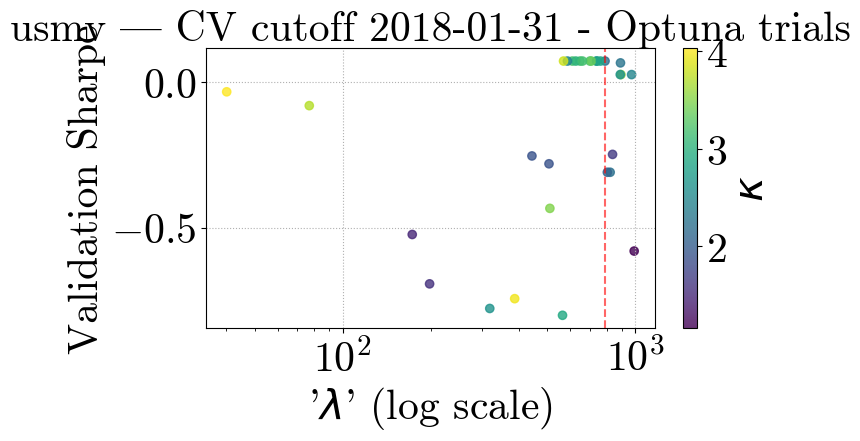

[I 2025-05-06 01:48:00,968] A new study created in memory with name: no-name-b6428a3b-b1e4-46c6-a368-7f0af77e811c
[I 2025-05-06 01:48:07,033] Trial 0 finished with value: 0.11943430805662852 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.11943430805662852.
[I 2025-05-06 01:48:11,198] Trial 1 finished with value: 0.4003827295565185 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.4003827295565185.
[I 2025-05-06 01:48:20,032] Trial 2 finished with value: 0.5461080044786997 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.5461080044786997.
[I 2025-05-06 01:48:26,633] Trial 3 finished with value: 0.14313389913420652 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.5461080044786997.
[I 2025-05-06 01:48:30,669] Trial 4 finished with value: 0.3964642705122859 and param

Optuna best λ=96.8931, κ=1.008160136605864, Sharpe=0.5832


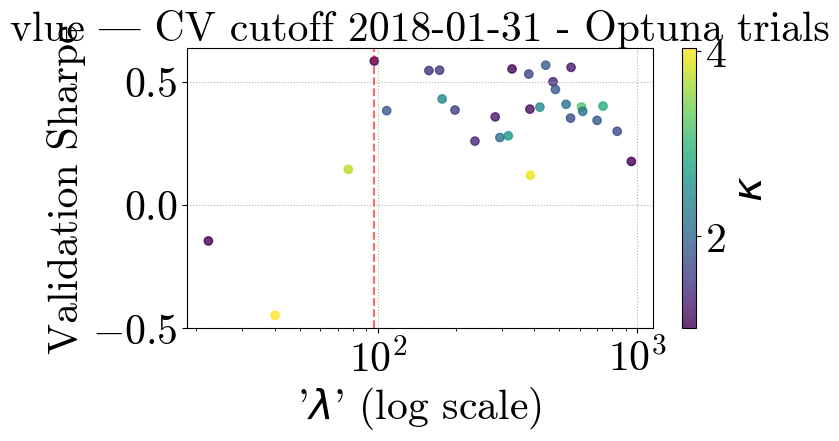

[I 2025-05-06 01:50:36,713] A new study created in memory with name: no-name-e411005c-914c-4bbf-82fa-e6add6ba3e7c
[I 2025-05-06 01:50:43,164] Trial 0 finished with value: -0.5249746972040137 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5249746972040137.
[I 2025-05-06 01:50:48,463] Trial 1 finished with value: -0.5249746972040137 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5249746972040137.
[I 2025-05-06 01:50:57,479] Trial 2 finished with value: 0.14512265454241793 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.14512265454241793.
[I 2025-05-06 01:51:09,801] Trial 3 finished with value: 0.6930212315423812 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.6930212315423812.
[I 2025-05-06 01:51:14,662] Trial 4 finished with value: -0.5249746972040137 and p

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.6930


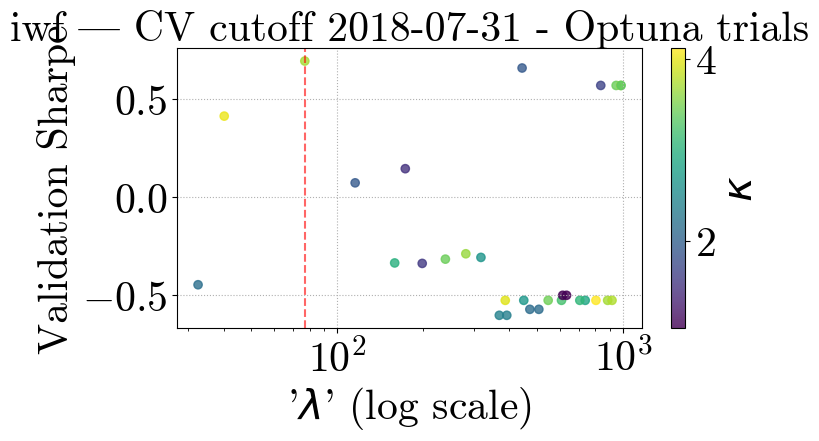

[I 2025-05-06 01:53:57,247] A new study created in memory with name: no-name-8de8ed2a-4f50-4703-b943-51a193df1570
[I 2025-05-06 01:54:01,563] Trial 0 finished with value: 1.023352444742686 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.023352444742686.
[I 2025-05-06 01:54:05,647] Trial 1 finished with value: 1.023352444742686 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.023352444742686.
[I 2025-05-06 01:54:16,545] Trial 2 finished with value: 1.0778495490138391 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.0778495490138391.
[I 2025-05-06 01:54:25,965] Trial 3 finished with value: 1.286840239136352 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.286840239136352.
[I 2025-05-06 01:54:30,313] Trial 4 finished with value: 1.023352444742686 and parameters: {'l

Optuna best λ=86.4639, κ=2.941859250399054, Sharpe=1.3471


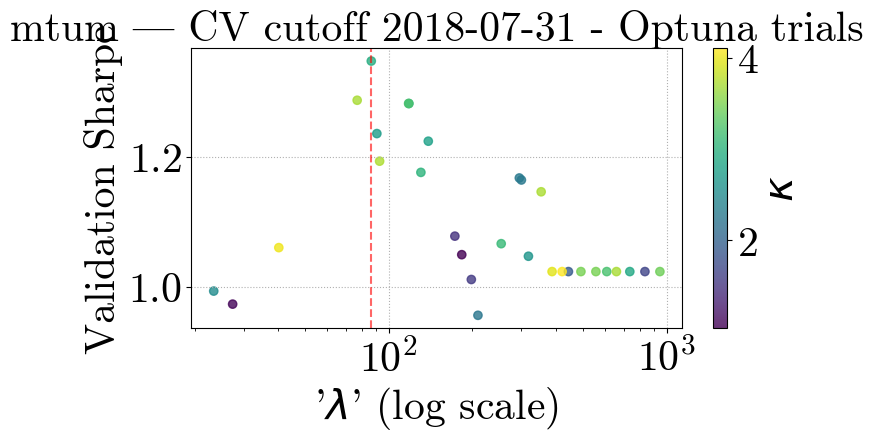

[I 2025-05-06 01:57:29,145] A new study created in memory with name: no-name-500bb5ba-3370-47fa-9d25-7616433c6a94
[I 2025-05-06 01:57:33,592] Trial 0 finished with value: 0.31813093050864066 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.31813093050864066.
[I 2025-05-06 01:57:37,345] Trial 1 finished with value: 0.31813093050864066 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.31813093050864066.
[I 2025-05-06 01:57:45,997] Trial 2 finished with value: 0.4522834438876366 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4522834438876366.
[I 2025-05-06 01:57:59,079] Trial 3 finished with value: -0.18194606293324378 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4522834438876366.
[I 2025-05-06 01:58:02,709] Trial 4 finished with value: 0.31813093050864066 and p

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.7895


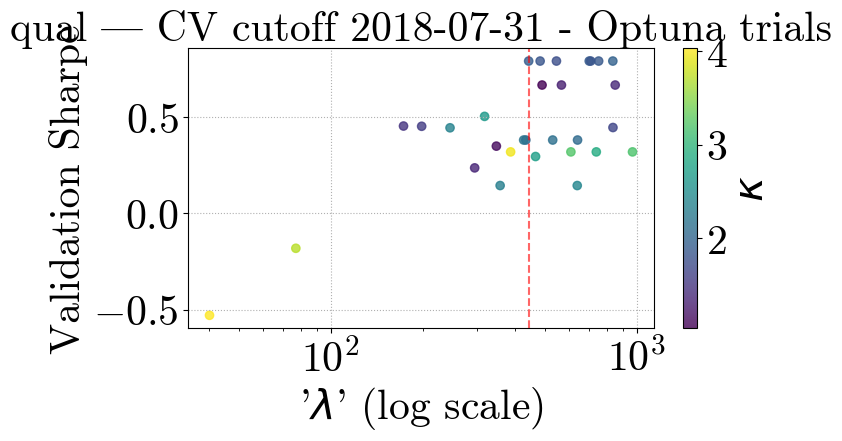

[I 2025-05-06 02:00:58,410] A new study created in memory with name: no-name-b4985419-61a5-4be8-88d3-c3415885a37f
[I 2025-05-06 02:01:02,574] Trial 0 finished with value: -0.38296688268647405 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.38296688268647405.
[I 2025-05-06 02:01:05,892] Trial 1 finished with value: -0.38296688268647405 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.38296688268647405.
[I 2025-05-06 02:01:14,841] Trial 2 finished with value: -0.05940568453369315 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.05940568453369315.
[I 2025-05-06 02:01:27,226] Trial 3 finished with value: 0.06330752601868724 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.06330752601868724.
[I 2025-05-06 02:01:30,589] Trial 4 finished with value: -0.38296688268647

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.2843


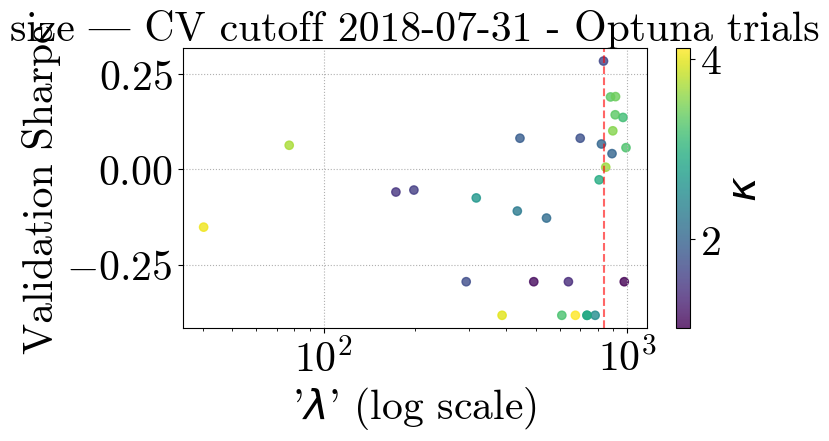

[I 2025-05-06 02:03:09,825] A new study created in memory with name: no-name-a804f738-ce60-4336-a99e-2b86c69bbfea
[I 2025-05-06 02:03:16,345] Trial 0 finished with value: -0.8150362972584724 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.8150362972584724.
[I 2025-05-06 02:03:21,378] Trial 1 finished with value: -0.09820363842566199 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.09820363842566199.
[I 2025-05-06 02:03:28,225] Trial 2 finished with value: -0.35023697058337894 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.09820363842566199.
[I 2025-05-06 02:03:40,625] Trial 3 finished with value: -0.8221500579656349 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.09820363842566199.
[I 2025-05-06 02:03:46,009] Trial 4 finished with value: -0.098203638425661

Optuna best λ=879.9806, κ=1.8744413899888643, Sharpe=-0.0401


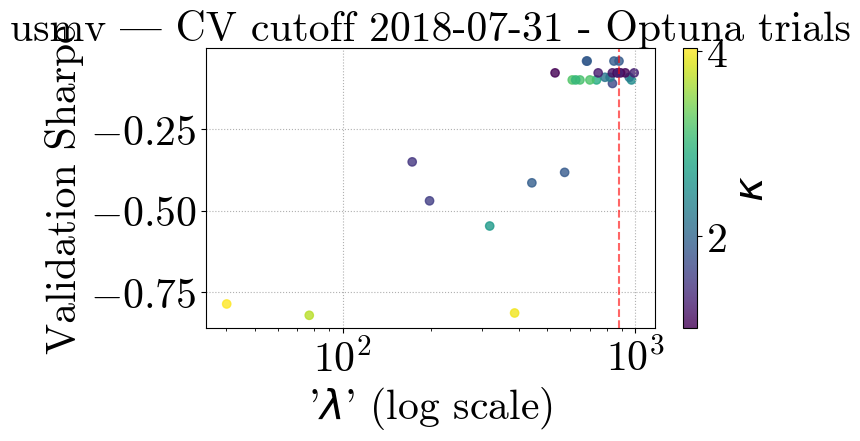

[I 2025-05-06 02:05:50,576] A new study created in memory with name: no-name-f51dc388-2b52-49c7-a168-13776ba9bb40
[I 2025-05-06 02:05:56,024] Trial 0 finished with value: 0.3881062645414233 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3881062645414233.
[I 2025-05-06 02:06:00,924] Trial 1 finished with value: 0.5863564452828456 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5863564452828456.
[I 2025-05-06 02:06:07,623] Trial 2 finished with value: 0.6522195400791735 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6522195400791735.
[I 2025-05-06 02:06:13,587] Trial 3 finished with value: 0.18630280107186709 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.6522195400791735.
[I 2025-05-06 02:06:17,174] Trial 4 finished with value: 0.69100839928734 and parameter

Optuna best λ=473.0977, κ=3.3456787036687925, Sharpe=0.8452


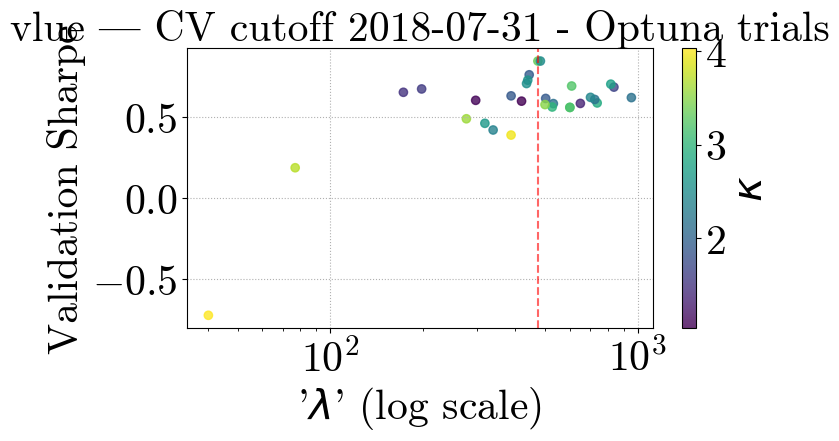

[I 2025-05-06 02:08:24,958] A new study created in memory with name: no-name-4a9ece62-65b6-42d1-adf8-7ab02b9a7b3e
[I 2025-05-06 02:08:29,957] Trial 0 finished with value: 0.27220355310557554 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.27220355310557554.
[I 2025-05-06 02:08:33,338] Trial 1 finished with value: -0.10635055383959129 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.27220355310557554.
[I 2025-05-06 02:08:42,355] Trial 2 finished with value: 0.384002612047752 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.384002612047752.
[I 2025-05-06 02:08:51,720] Trial 3 finished with value: 0.6284786159062943 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.6284786159062943.
[I 2025-05-06 02:08:55,057] Trial 4 finished with value: -0.13856437496691668 and par

Optuna best λ=69.3054, κ=3.671017647863116, Sharpe=0.7551


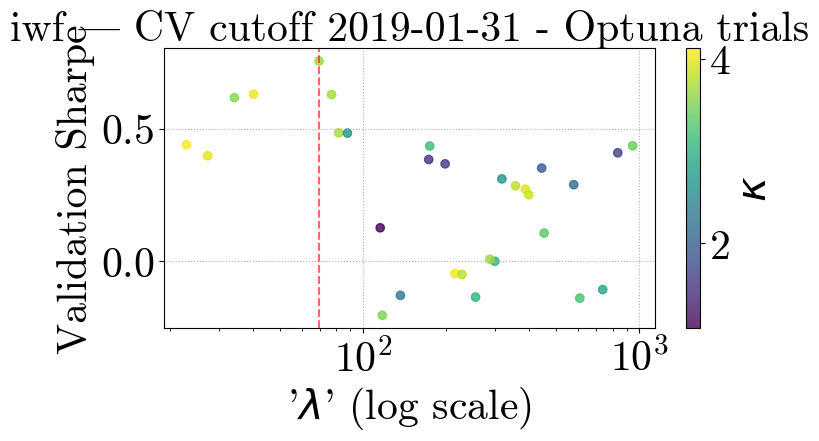

[I 2025-05-06 02:12:36,473] A new study created in memory with name: no-name-f7434421-3675-4b83-8d8c-fa27dc08be82
[I 2025-05-06 02:12:40,867] Trial 0 finished with value: 0.5780617257116116 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5780617257116116.
[I 2025-05-06 02:12:44,786] Trial 1 finished with value: 0.870103831272331 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.870103831272331.
[I 2025-05-06 02:12:50,652] Trial 2 finished with value: 0.8868104827230576 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.8868104827230576.
[I 2025-05-06 02:13:02,706] Trial 3 finished with value: 1.0662595815495353 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.0662595815495353.
[I 2025-05-06 02:13:06,452] Trial 4 finished with value: 0.8880732489087214 and parameters

Optuna best λ=81.6520, κ=3.722788413455649, Sharpe=1.0814


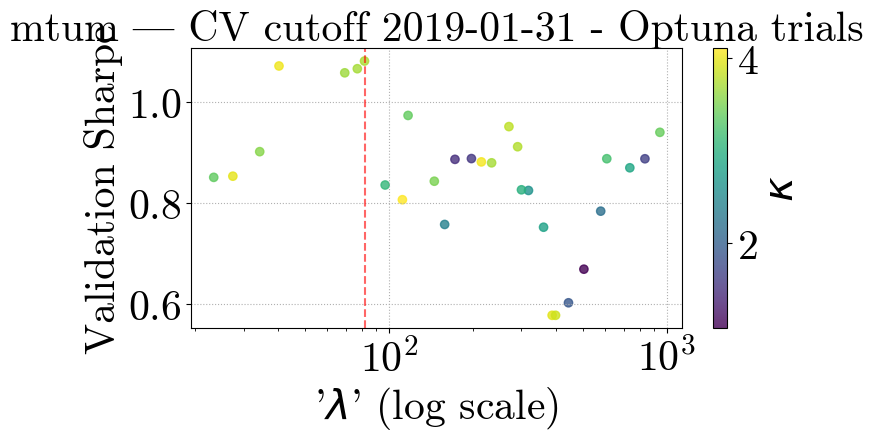

[I 2025-05-06 02:16:24,805] A new study created in memory with name: no-name-4d0e5bfd-e8f6-46d2-9a50-4a285e3c574c
[I 2025-05-06 02:16:29,201] Trial 0 finished with value: -0.12131368866431856 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.12131368866431856.
[I 2025-05-06 02:16:33,839] Trial 1 finished with value: -0.16766284919223362 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.12131368866431856.
[I 2025-05-06 02:16:43,719] Trial 2 finished with value: -0.21675949327380958 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.12131368866431856.
[I 2025-05-06 02:16:51,116] Trial 3 finished with value: -0.2445303228811256 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.12131368866431856.
[I 2025-05-06 02:16:55,166] Trial 4 finished with value: -0.1272857867320

Optuna best λ=333.3205, κ=1.053853654677886, Sharpe=0.1183


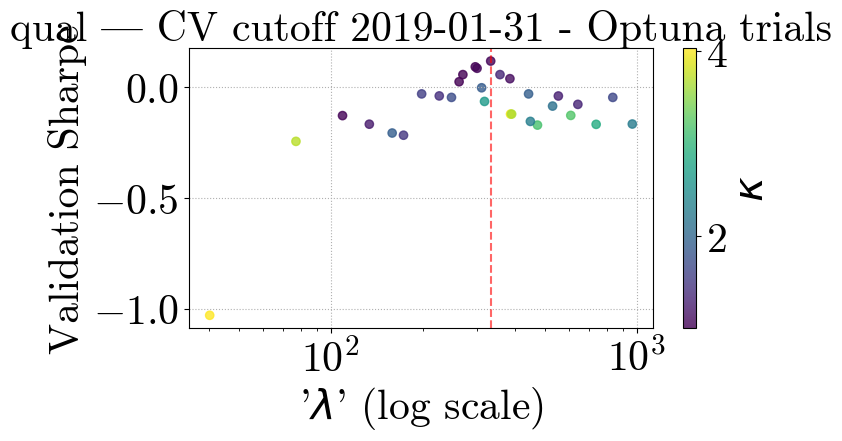

[I 2025-05-06 02:20:00,366] A new study created in memory with name: no-name-71d0d15b-59a8-4a36-930c-ed01e9e4b3ab
[I 2025-05-06 02:20:04,950] Trial 0 finished with value: 0.02357550442036281 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.02357550442036281.
[I 2025-05-06 02:20:08,884] Trial 1 finished with value: 0.02357550442036281 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.02357550442036281.
[I 2025-05-06 02:20:17,583] Trial 2 finished with value: -0.3277389035819502 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.02357550442036281.
[I 2025-05-06 02:20:31,651] Trial 3 finished with value: 0.04841298548539549 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.04841298548539549.
[I 2025-05-06 02:20:35,502] Trial 4 finished with value: 0.02357550442036281 and

Optuna best λ=126.5348, κ=2.2074370801994143, Sharpe=0.1209


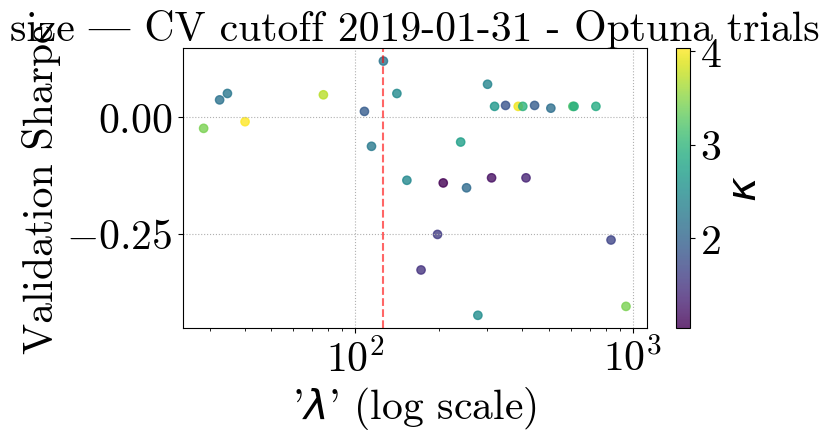

[I 2025-05-06 02:24:03,230] A new study created in memory with name: no-name-ad624bd1-060f-4684-b269-a2e3390bf862
[I 2025-05-06 02:24:08,400] Trial 0 finished with value: -0.6811611371290117 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6811611371290117.
[I 2025-05-06 02:24:13,298] Trial 1 finished with value: -0.03673518772255695 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.03673518772255695.
[I 2025-05-06 02:24:20,196] Trial 2 finished with value: -0.4693557346287038 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.03673518772255695.
[I 2025-05-06 02:24:36,179] Trial 3 finished with value: -0.7633080530384091 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.03673518772255695.
[I 2025-05-06 02:24:40,334] Trial 4 finished with value: -0.0367351877225569

Optuna best λ=643.9620, κ=1.88209113158397, Sharpe=0.0214


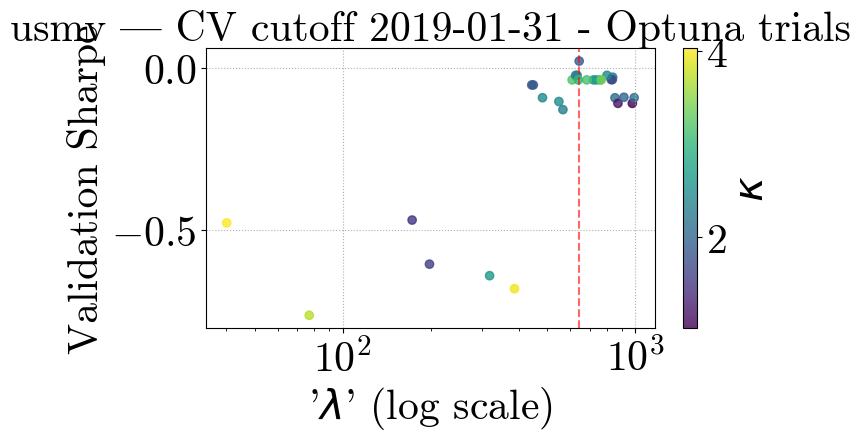

[I 2025-05-06 02:26:51,514] A new study created in memory with name: no-name-ca7cdda3-45a4-4edc-b317-06b320257f00
[I 2025-05-06 02:27:00,315] Trial 0 finished with value: 0.23954173381529634 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.23954173381529634.
[I 2025-05-06 02:27:05,132] Trial 1 finished with value: -0.11534533670977198 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.23954173381529634.
[I 2025-05-06 02:27:11,650] Trial 2 finished with value: 0.4480411724155516 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4480411724155516.
[I 2025-05-06 02:27:20,373] Trial 3 finished with value: 0.3302019380304668 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4480411724155516.
[I 2025-05-06 02:27:26,063] Trial 4 finished with value: -0.009712974636373361 and 

Optuna best λ=946.2338, κ=1.018729835827171, Sharpe=0.4650


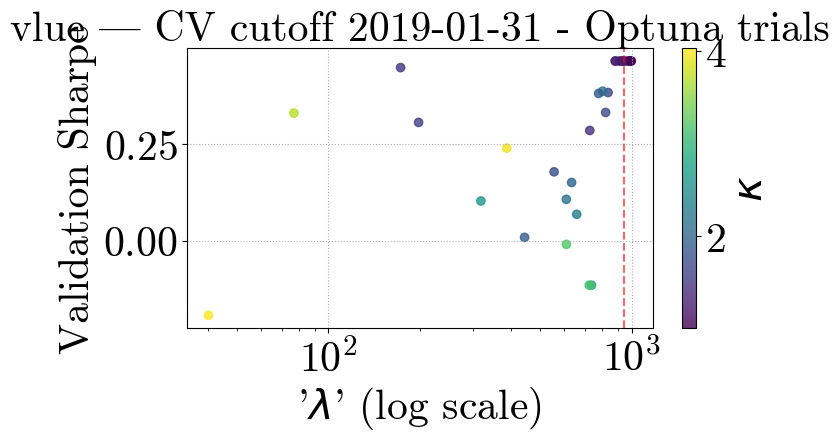

[I 2025-05-06 02:28:55,466] A new study created in memory with name: no-name-ebabd455-fc68-4223-9e31-335cd40eeaca
[I 2025-05-06 02:29:01,585] Trial 0 finished with value: 0.6006176528484374 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6006176528484374.
[I 2025-05-06 02:29:07,128] Trial 1 finished with value: 0.3621706461806041 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6006176528484374.
[I 2025-05-06 02:29:18,278] Trial 2 finished with value: 0.7376260910918387 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.7376260910918387.
[I 2025-05-06 02:29:29,598] Trial 3 finished with value: 0.9685256612253043 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.9685256612253043.
[I 2025-05-06 02:29:34,781] Trial 4 finished with value: 0.17894092052203656 and paramet

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.9685


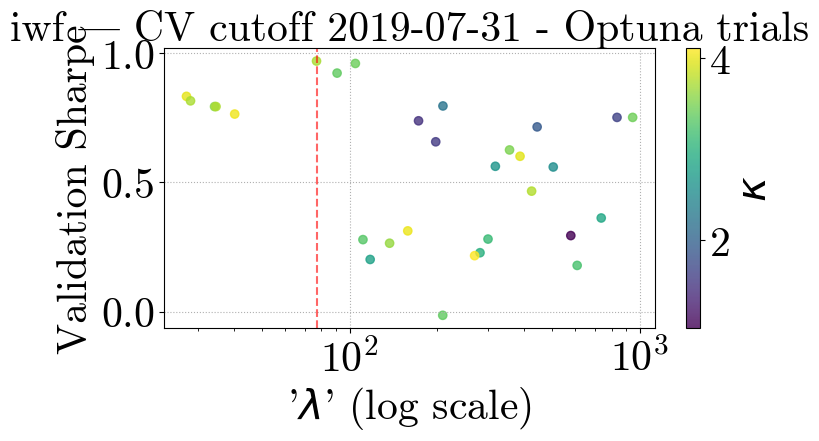

[I 2025-05-06 02:33:44,594] A new study created in memory with name: no-name-3913d1dc-fdf4-4ce4-ae30-9e0b01f35467
[I 2025-05-06 02:33:49,842] Trial 0 finished with value: 0.7870001565227207 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7870001565227207.
[I 2025-05-06 02:33:53,893] Trial 1 finished with value: 1.1220146283273418 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.1220146283273418.
[I 2025-05-06 02:33:59,812] Trial 2 finished with value: 1.08464041734852 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.1220146283273418.
[I 2025-05-06 02:34:13,059] Trial 3 finished with value: 1.1994802835113425 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.1994802835113425.
[I 2025-05-06 02:34:17,026] Trial 4 finished with value: 1.083466469346436 and parameters:

Optuna best λ=42.9972, κ=4.097964996435719, Sharpe=1.4013


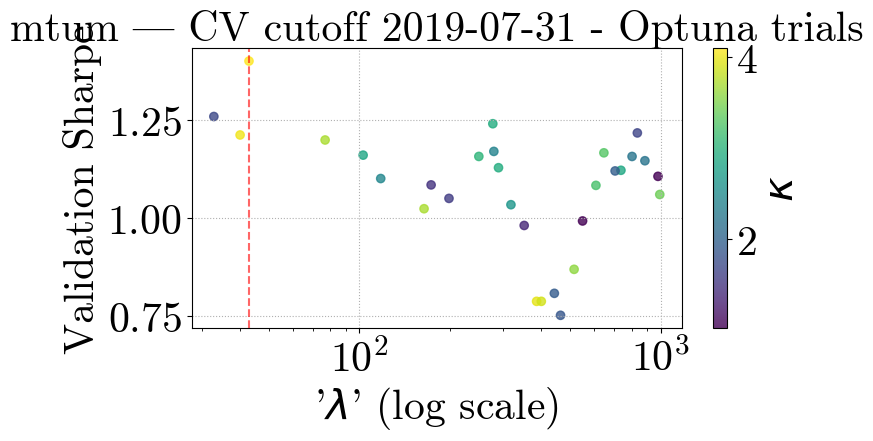

[I 2025-05-06 02:37:11,094] A new study created in memory with name: no-name-5d431c05-46e9-4ec3-b814-bfc895909e86
[I 2025-05-06 02:37:17,525] Trial 0 finished with value: 0.5589226513516413 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5589226513516413.
[I 2025-05-06 02:37:22,876] Trial 1 finished with value: 0.5264412096140363 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5589226513516413.
[I 2025-05-06 02:37:32,241] Trial 2 finished with value: 0.4680709332925556 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5589226513516413.
[I 2025-05-06 02:37:47,055] Trial 3 finished with value: -0.5947964219019803 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5589226513516413.
[I 2025-05-06 02:37:52,524] Trial 4 finished with value: 0.3798732517883835 and paramet

Optuna best λ=479.3311, κ=1.0627634878082486, Sharpe=0.7651


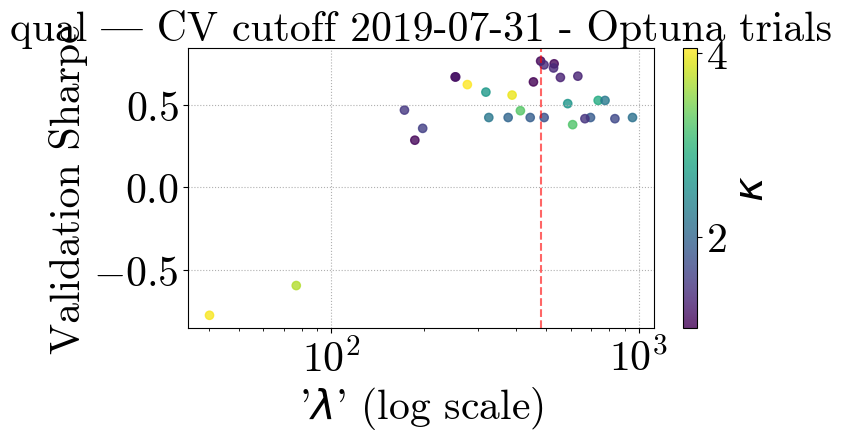

[I 2025-05-06 02:41:13,125] A new study created in memory with name: no-name-7d18edb8-53f3-4b87-9fbe-350723c09bcd
[I 2025-05-06 02:41:19,824] Trial 0 finished with value: 0.3502005174811756 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3502005174811756.
[I 2025-05-06 02:41:23,372] Trial 1 finished with value: -0.26342517750875294 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3502005174811756.
[I 2025-05-06 02:41:30,388] Trial 2 finished with value: -0.363202241871857 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3502005174811756.
[I 2025-05-06 02:41:46,387] Trial 3 finished with value: -0.3380427163678002 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3502005174811756.
[I 2025-05-06 02:41:50,588] Trial 4 finished with value: 0.3502005174811756 and param

Optuna best λ=680.1324, κ=2.81703364487058, Sharpe=0.3502


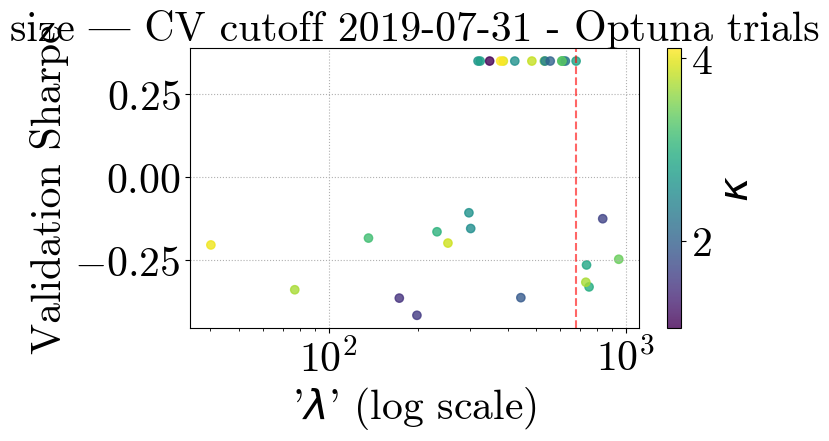

[I 2025-05-06 02:44:15,154] A new study created in memory with name: no-name-592adb89-f523-416a-bb21-817b9e85153c
[I 2025-05-06 02:44:19,817] Trial 0 finished with value: -0.7772977778200442 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7772977778200442.
[I 2025-05-06 02:44:23,020] Trial 1 finished with value: -0.05789800859845368 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.05789800859845368.
[I 2025-05-06 02:44:30,940] Trial 2 finished with value: -0.5052379046593518 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.05789800859845368.
[I 2025-05-06 02:44:42,637] Trial 3 finished with value: -0.9042065105396077 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.05789800859845368.
[I 2025-05-06 02:44:47,319] Trial 4 finished with value: -0.6034065396100342

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.1881


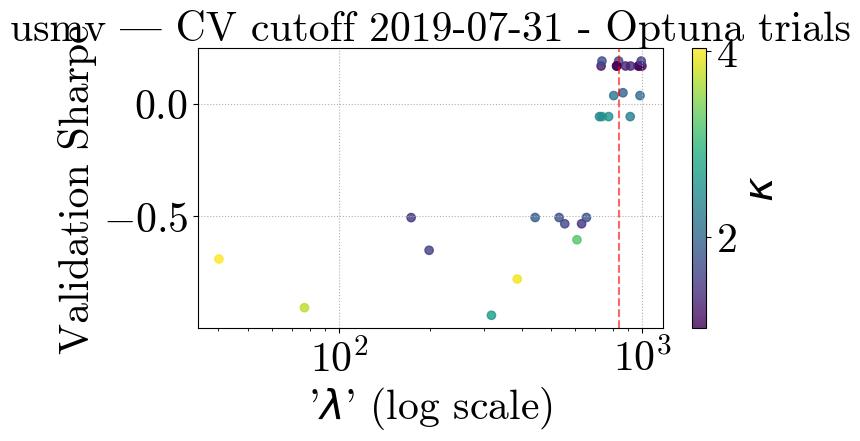

[I 2025-05-06 02:46:36,635] A new study created in memory with name: no-name-7213c415-e41a-47e7-8197-962e80245871
[I 2025-05-06 02:46:44,923] Trial 0 finished with value: 0.31186009461767367 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.31186009461767367.
[I 2025-05-06 02:46:49,252] Trial 1 finished with value: 0.30503186819629907 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.31186009461767367.
[I 2025-05-06 02:46:56,706] Trial 2 finished with value: 0.6123789986465323 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6123789986465323.
[I 2025-05-06 02:47:04,916] Trial 3 finished with value: 0.4499234142461699 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.6123789986465323.
[I 2025-05-06 02:47:09,117] Trial 4 finished with value: 0.5667929511940749 and para

Optuna best λ=231.4047, κ=1.7980101744817147, Sharpe=0.7200


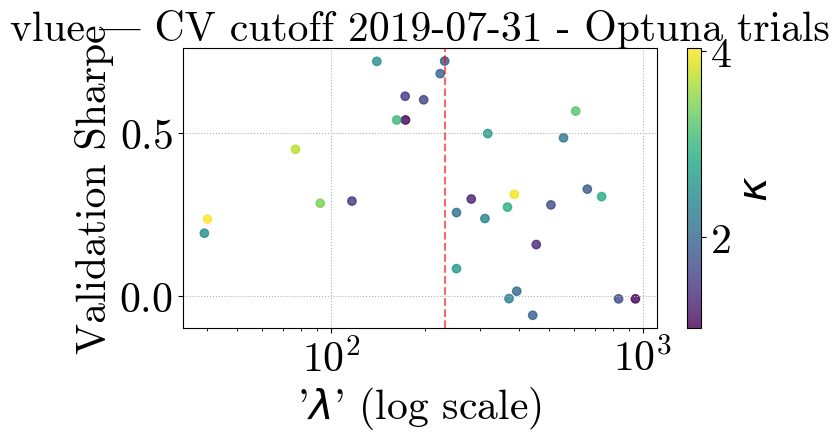

[I 2025-05-06 02:49:55,420] A new study created in memory with name: no-name-d1e720c1-f0bb-4338-9b88-dbf25d1a6d68
[I 2025-05-06 02:50:00,168] Trial 0 finished with value: 0.6459458058243535 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6459458058243535.
[I 2025-05-06 02:50:03,737] Trial 1 finished with value: 0.28888383636579223 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6459458058243535.
[I 2025-05-06 02:50:14,152] Trial 2 finished with value: 0.6095469083761194 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6459458058243535.
[I 2025-05-06 02:50:25,768] Trial 3 finished with value: 1.1593437729949714 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.1593437729949714.
[I 2025-05-06 02:50:29,438] Trial 4 finished with value: 0.31755253506480013 and parame

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.1790


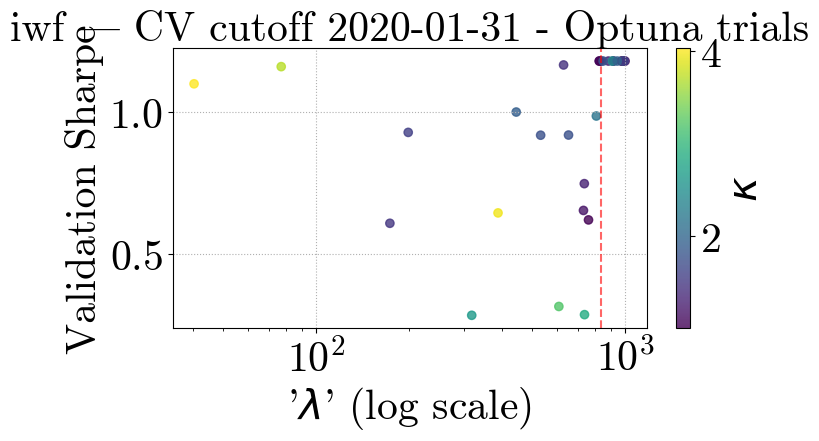

[I 2025-05-06 02:52:17,136] A new study created in memory with name: no-name-b7e0a793-45ee-47bf-82e5-5d3e9d6948c8
[I 2025-05-06 02:52:24,817] Trial 0 finished with value: 1.0543909522030608 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0543909522030608.
[I 2025-05-06 02:52:29,650] Trial 1 finished with value: 1.40889086616589 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.40889086616589.
[I 2025-05-06 02:52:37,203] Trial 2 finished with value: 1.4161757112931648 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.4161757112931648.
[I 2025-05-06 02:52:48,137] Trial 3 finished with value: 1.2744647609225055 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.4161757112931648.
[I 2025-05-06 02:52:52,785] Trial 4 finished with value: 1.3653090632029337 and parameters: 

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.5089


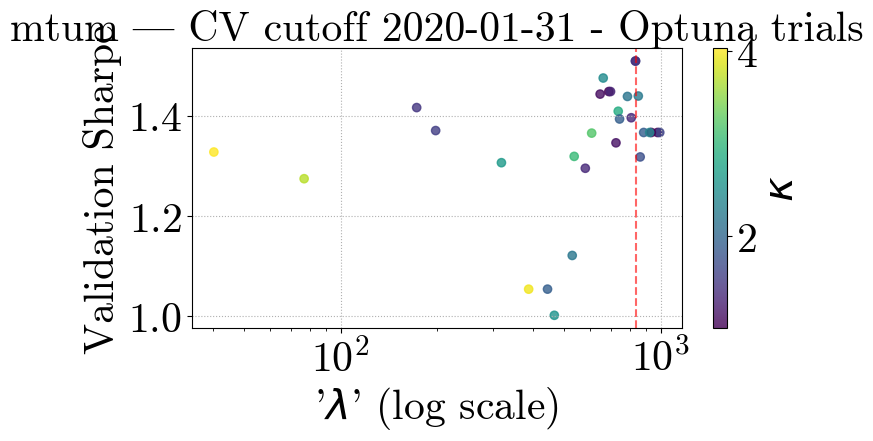

[I 2025-05-06 02:55:11,081] A new study created in memory with name: no-name-58db2113-fda6-470c-8f89-4d790a40f183
[I 2025-05-06 02:55:17,468] Trial 0 finished with value: 0.7555711412605933 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7555711412605933.
[I 2025-05-06 02:55:22,285] Trial 1 finished with value: 1.04100957810741 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.04100957810741.
[I 2025-05-06 02:55:29,117] Trial 2 finished with value: 0.15512062050406766 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.04100957810741.
[I 2025-05-06 02:55:43,382] Trial 3 finished with value: -0.6958361866272064 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.04100957810741.
[I 2025-05-06 02:55:48,316] Trial 4 finished with value: 0.5909331539165049 and parameters: {'

Optuna best λ=787.9570, κ=1.0411523272835175, Sharpe=1.0410


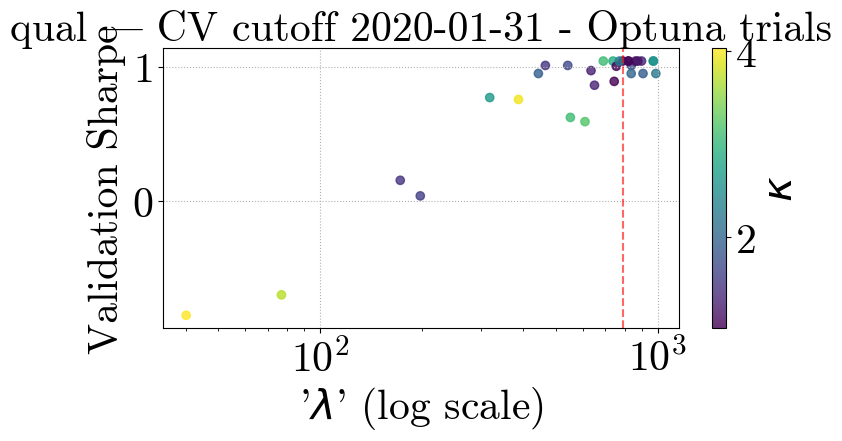

[I 2025-05-06 02:58:54,047] A new study created in memory with name: no-name-84ad220a-615c-4e45-91f7-52ec3902a002
[I 2025-05-06 02:58:58,682] Trial 0 finished with value: 0.34605950420143006 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.34605950420143006.
[I 2025-05-06 02:59:02,512] Trial 1 finished with value: 0.34605950420143006 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.34605950420143006.
[I 2025-05-06 02:59:09,933] Trial 2 finished with value: -0.3415086939234709 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.34605950420143006.
[I 2025-05-06 02:59:24,529] Trial 3 finished with value: -0.232156876709887 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.34605950420143006.
[I 2025-05-06 02:59:28,869] Trial 4 finished with value: 0.34605950420143006 and 

Optuna best λ=251.1931, κ=3.132907707315758, Sharpe=0.4544


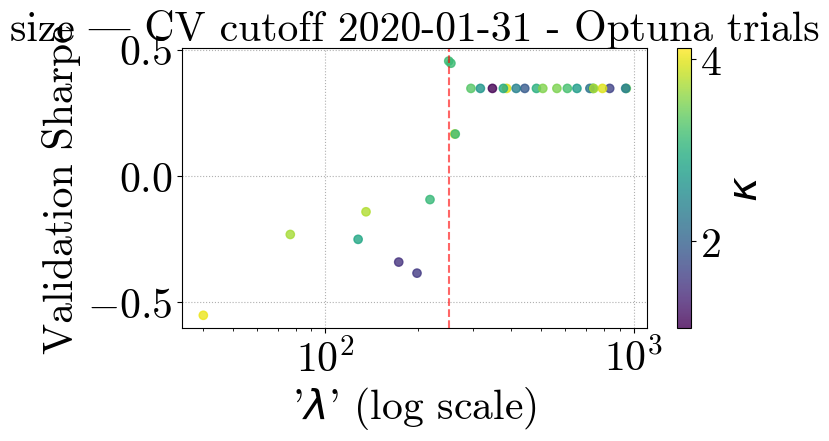

[I 2025-05-06 03:02:09,270] A new study created in memory with name: no-name-8f1ab344-7381-4a5e-8937-868c2d7f2ab6
[I 2025-05-06 03:02:13,878] Trial 0 finished with value: -1.0714872967698428 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0714872967698428.
[I 2025-05-06 03:02:17,815] Trial 1 finished with value: 0.5245216550697939 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5245216550697939.
[I 2025-05-06 03:02:23,329] Trial 2 finished with value: -0.0581640841086601 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5245216550697939.
[I 2025-05-06 03:02:34,396] Trial 3 finished with value: -0.5426764285216279 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5245216550697939.
[I 2025-05-06 03:02:38,014] Trial 4 finished with value: 0.5245216550697939 and para

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.5245


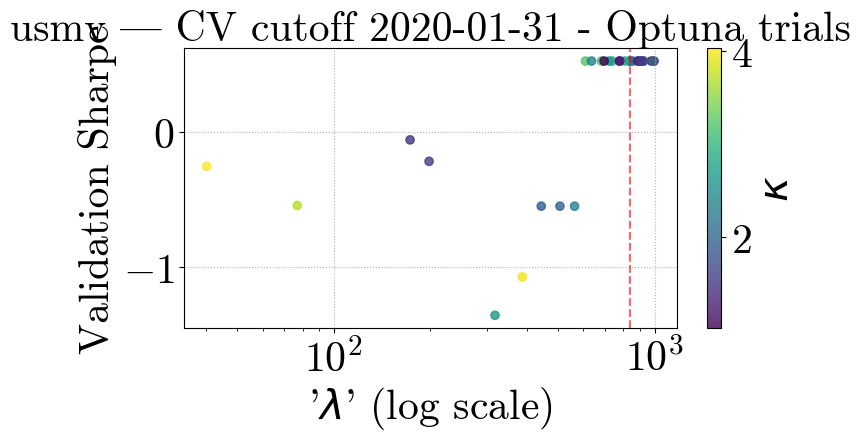

[I 2025-05-06 03:04:53,043] A new study created in memory with name: no-name-4a914774-8289-4304-8f44-3f60dddd3518
[I 2025-05-06 03:05:02,851] Trial 0 finished with value: -0.5144415779898709 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5144415779898709.
[I 2025-05-06 03:05:07,273] Trial 1 finished with value: -0.3377782314225086 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.3377782314225086.
[I 2025-05-06 03:05:14,051] Trial 2 finished with value: -0.01481655334708555 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.01481655334708555.
[I 2025-05-06 03:05:22,576] Trial 3 finished with value: -1.0012752075890234 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.01481655334708555.
[I 2025-05-06 03:05:27,647] Trial 4 finished with value: -0.8838861095585263 

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=-0.0148


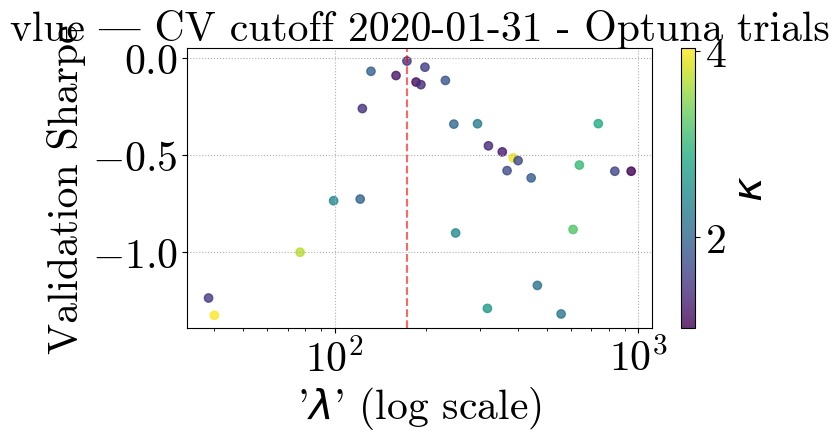

[I 2025-05-06 03:07:52,461] A new study created in memory with name: no-name-c2bbd272-69c7-486a-94f1-2af9570b6785
[I 2025-05-06 03:07:59,456] Trial 0 finished with value: 0.7365574212538951 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7365574212538951.
[I 2025-05-06 03:08:04,577] Trial 1 finished with value: 0.9442084466355359 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.9442084466355359.
[I 2025-05-06 03:08:17,148] Trial 2 finished with value: 0.8261961255081758 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.9442084466355359.
[I 2025-05-06 03:08:30,794] Trial 3 finished with value: 1.1250331601798758 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.1250331601798758.
[I 2025-05-06 03:08:36,542] Trial 4 finished with value: 1.1050842555097296 and paramete

Optuna best λ=673.1652, κ=1.708368092215901, Sharpe=1.3904


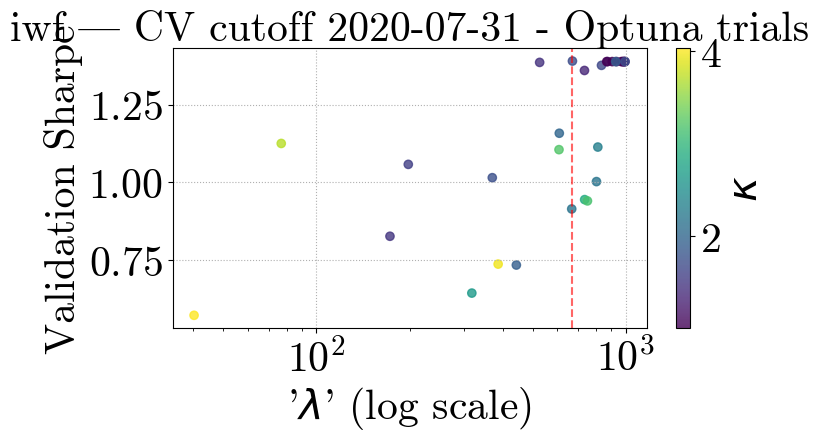

[I 2025-05-06 03:10:34,774] A new study created in memory with name: no-name-44c8af18-0572-4090-8eb5-a569e90024a8
[I 2025-05-06 03:10:41,110] Trial 0 finished with value: 0.5355861555783222 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5355861555783222.
[I 2025-05-06 03:10:45,192] Trial 1 finished with value: 1.0596333257023312 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0596333257023312.
[I 2025-05-06 03:10:54,675] Trial 2 finished with value: 0.5901675805336082 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0596333257023312.
[I 2025-05-06 03:11:12,593] Trial 3 finished with value: 0.6567168612593035 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.0596333257023312.
[I 2025-05-06 03:11:16,491] Trial 4 finished with value: 1.0391941273724707 and paramete

Optuna best λ=658.4141, κ=1.032158511026232, Sharpe=1.1379


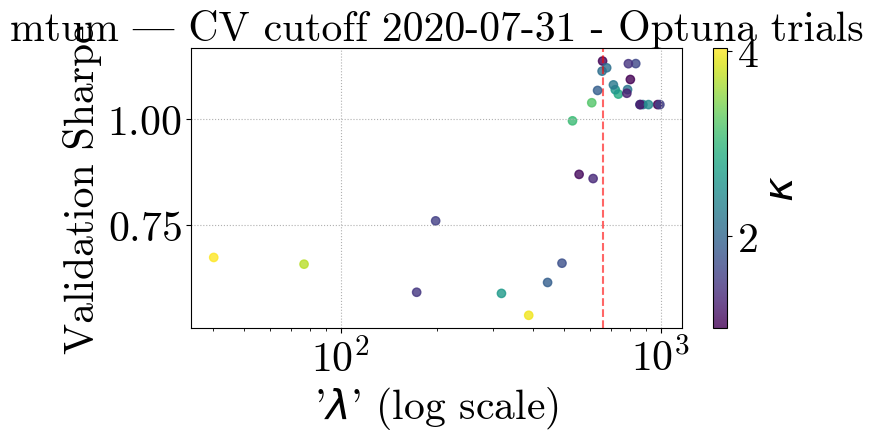

[I 2025-05-06 03:13:22,887] A new study created in memory with name: no-name-427e5cd7-c479-420e-902a-b89bc423cfd6
[I 2025-05-06 03:13:30,991] Trial 0 finished with value: -0.18622932621810076 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.18622932621810076.
[I 2025-05-06 03:13:37,391] Trial 1 finished with value: 0.6745463923635485 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6745463923635485.
[I 2025-05-06 03:13:45,326] Trial 2 finished with value: -0.19317470657627805 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6745463923635485.
[I 2025-05-06 03:13:59,704] Trial 3 finished with value: -0.14307202253347245 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.6745463923635485.
[I 2025-05-06 03:14:09,057] Trial 4 finished with value: 0.36925627780941284 and

Optuna best λ=938.6189, κ=1.0982840199321338, Sharpe=0.6745


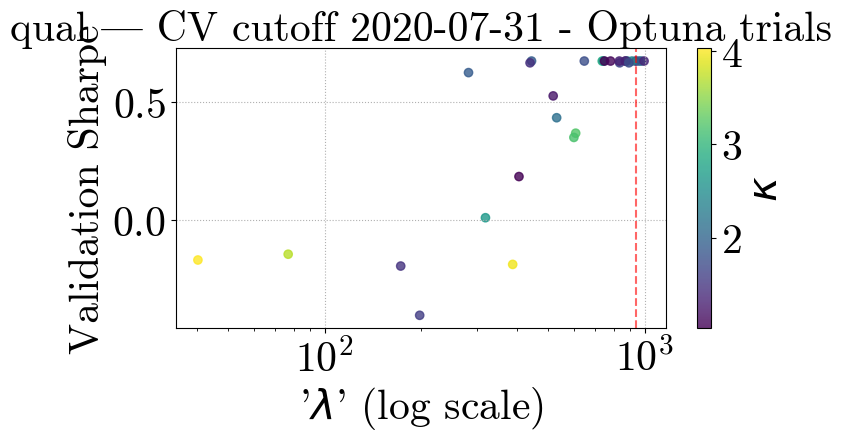

[I 2025-05-06 03:17:05,371] A new study created in memory with name: no-name-16583d7f-169f-4590-bb69-e9b8ee532f67
[I 2025-05-06 03:17:13,707] Trial 0 finished with value: 0.23396478101107446 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.23396478101107446.
[I 2025-05-06 03:17:20,590] Trial 1 finished with value: 0.1601123253170662 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.23396478101107446.
[I 2025-05-06 03:17:29,190] Trial 2 finished with value: -0.276029779653617 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.23396478101107446.
[I 2025-05-06 03:17:41,872] Trial 3 finished with value: -0.34964848883856636 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.23396478101107446.
[I 2025-05-06 03:17:47,503] Trial 4 finished with value: 0.33111550715437815 and 

Optuna best λ=727.2091, κ=1.0823503127445395, Sharpe=0.6624


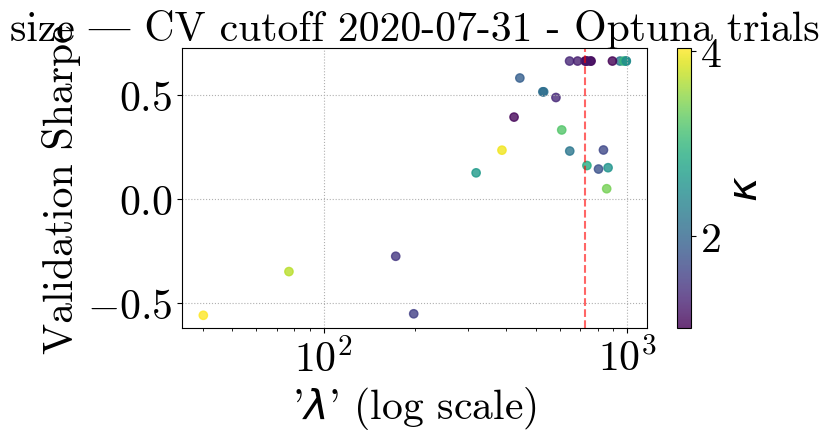

[I 2025-05-06 03:19:26,255] A new study created in memory with name: no-name-c5ec0012-8889-4e66-a137-9a7a57603426
[I 2025-05-06 03:19:30,623] Trial 0 finished with value: -1.3393032813435952 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.3393032813435952.
[I 2025-05-06 03:19:34,967] Trial 1 finished with value: 0.007055147838346251 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.007055147838346251.
[I 2025-05-06 03:19:42,339] Trial 2 finished with value: -0.7483129722437107 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.007055147838346251.
[I 2025-05-06 03:19:54,304] Trial 3 finished with value: -1.2414066375233144 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.007055147838346251.
[I 2025-05-06 03:19:59,086] Trial 4 finished with value: 0.00705514783834625

Optuna best λ=491.6627, κ=1.3004390574945772, Sharpe=0.0071


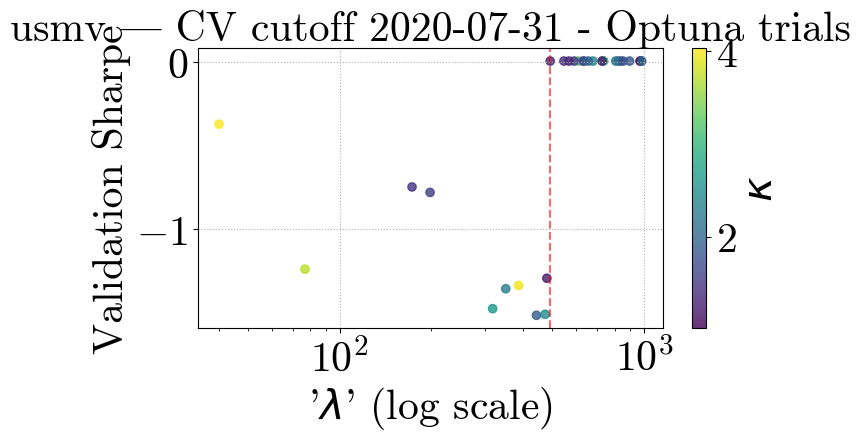

[I 2025-05-06 03:21:59,288] A new study created in memory with name: no-name-b0c36245-2666-4535-9755-cf2cdb2aaf94
[I 2025-05-06 03:22:05,768] Trial 0 finished with value: -0.09033745080161609 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.09033745080161609.
[I 2025-05-06 03:22:12,952] Trial 1 finished with value: -0.5885534857286281 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.09033745080161609.
[I 2025-05-06 03:22:19,668] Trial 2 finished with value: -0.4823825008762902 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.09033745080161609.
[I 2025-05-06 03:22:27,738] Trial 3 finished with value: -0.8938653465769603 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.09033745080161609.
[I 2025-05-06 03:22:31,784] Trial 4 finished with value: -1.217128805542994

Optuna best λ=396.9335, κ=4.097948080441039, Sharpe=0.0728


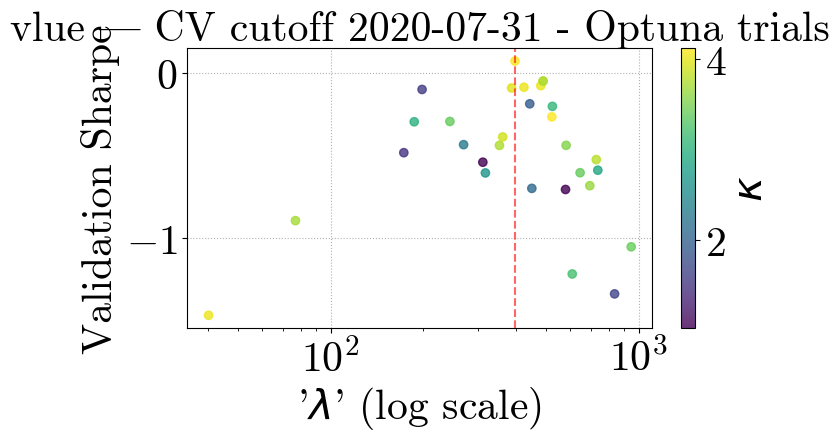

[I 2025-05-06 03:24:58,600] A new study created in memory with name: no-name-627038eb-b8ad-4a3f-8b22-682c17d32850
[I 2025-05-06 03:25:03,215] Trial 0 finished with value: 0.8453233478737339 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8453233478737339.
[I 2025-05-06 03:25:08,498] Trial 1 finished with value: 0.846122627529692 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.846122627529692.
[I 2025-05-06 03:25:13,832] Trial 2 finished with value: 0.6535687266227427 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.846122627529692.
[I 2025-05-06 03:25:25,616] Trial 3 finished with value: 0.4217184869473557 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.846122627529692.
[I 2025-05-06 03:25:29,185] Trial 4 finished with value: 0.9320146932566433 and parameters: 

Optuna best λ=556.1259, κ=1.080273450452684, Sharpe=1.1017


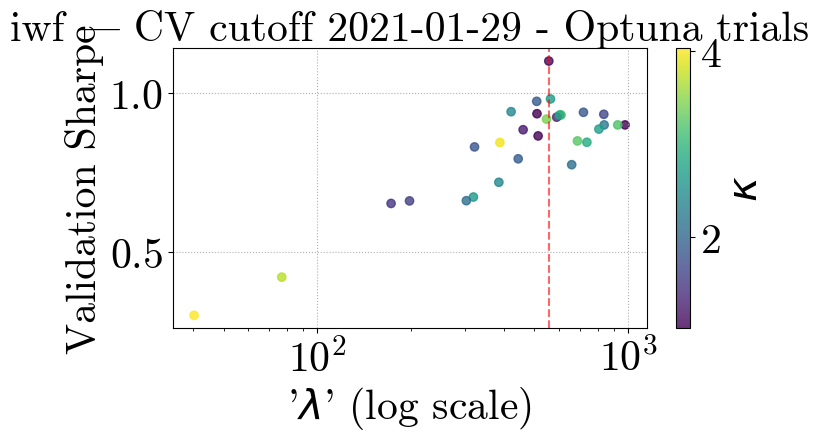

[I 2025-05-06 03:27:31,868] A new study created in memory with name: no-name-daf9fe4d-adf9-4df0-8198-4b06261df4f4
[I 2025-05-06 03:27:36,264] Trial 0 finished with value: 0.2348730375866143 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2348730375866143.
[I 2025-05-06 03:27:41,196] Trial 1 finished with value: 0.4610667719314715 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.4610667719314715.
[I 2025-05-06 03:27:48,551] Trial 2 finished with value: 0.12856213573733044 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.4610667719314715.
[I 2025-05-06 03:28:03,097] Trial 3 finished with value: 0.3078421880592462 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.4610667719314715.
[I 2025-05-06 03:28:08,001] Trial 4 finished with value: 0.46213767977020404 and parame

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.6623


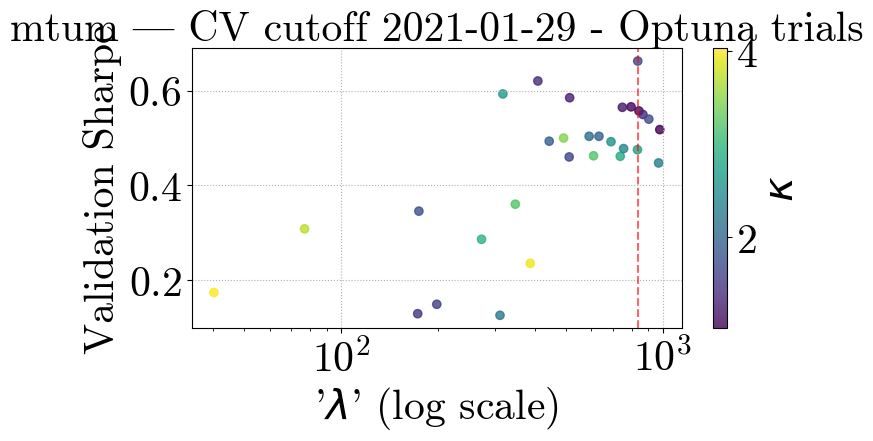

[I 2025-05-06 03:30:30,201] A new study created in memory with name: no-name-b23eaec5-24ce-42ab-94f3-01d0cd3c8b74
[I 2025-05-06 03:30:37,963] Trial 0 finished with value: -0.28324197257167333 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.28324197257167333.
[I 2025-05-06 03:30:44,879] Trial 1 finished with value: 0.07486414062252505 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.07486414062252505.
[I 2025-05-06 03:30:52,784] Trial 2 finished with value: 0.11624996685141523 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.11624996685141523.
[I 2025-05-06 03:31:05,386] Trial 3 finished with value: 0.013620625878254406 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.11624996685141523.
[I 2025-05-06 03:31:11,029] Trial 4 finished with value: 0.06893643670707857 

Optuna best λ=684.1158, κ=1.3359849390607732, Sharpe=0.4907


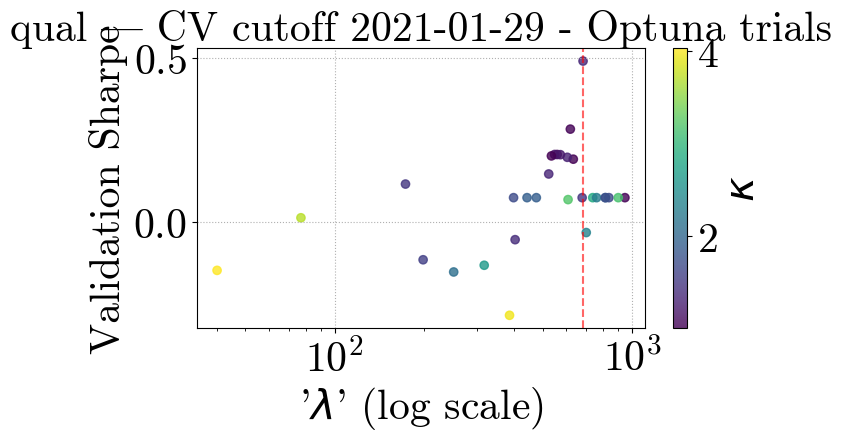

[I 2025-05-06 03:33:42,697] A new study created in memory with name: no-name-c7d694e4-b899-46c0-9d32-ffb40018480f
[I 2025-05-06 03:33:48,598] Trial 0 finished with value: 0.45257331033883136 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.45257331033883136.
[I 2025-05-06 03:33:52,998] Trial 1 finished with value: 0.4351964880555386 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.45257331033883136.
[I 2025-05-06 03:34:00,799] Trial 2 finished with value: 0.2909808619614161 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.45257331033883136.
[I 2025-05-06 03:34:13,993] Trial 3 finished with value: -0.25744921297559664 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.45257331033883136.
[I 2025-05-06 03:34:19,027] Trial 4 finished with value: 0.5111118349093522 and p

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.6137


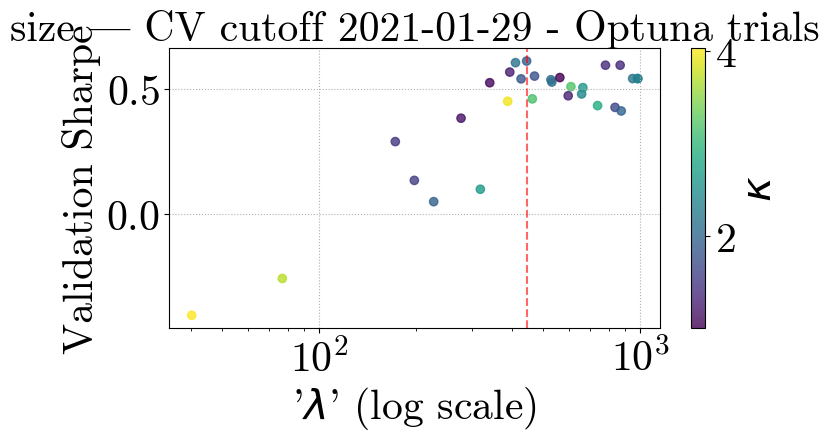

[I 2025-05-06 03:36:36,303] A new study created in memory with name: no-name-b6b85ea4-5db8-451d-b5d4-f38b09967c09
[I 2025-05-06 03:36:42,707] Trial 0 finished with value: -1.8211389713429178 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.8211389713429178.
[I 2025-05-06 03:36:47,062] Trial 1 finished with value: 0.041424659721431105 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.041424659721431105.
[I 2025-05-06 03:36:52,647] Trial 2 finished with value: -1.0278686924726828 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.041424659721431105.
[I 2025-05-06 03:37:10,279] Trial 3 finished with value: -0.7999298435227812 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.041424659721431105.
[I 2025-05-06 03:37:14,763] Trial 4 finished with value: -1.396036639177772 

Optuna best λ=987.3911, κ=2.2256718351156524, Sharpe=0.0714


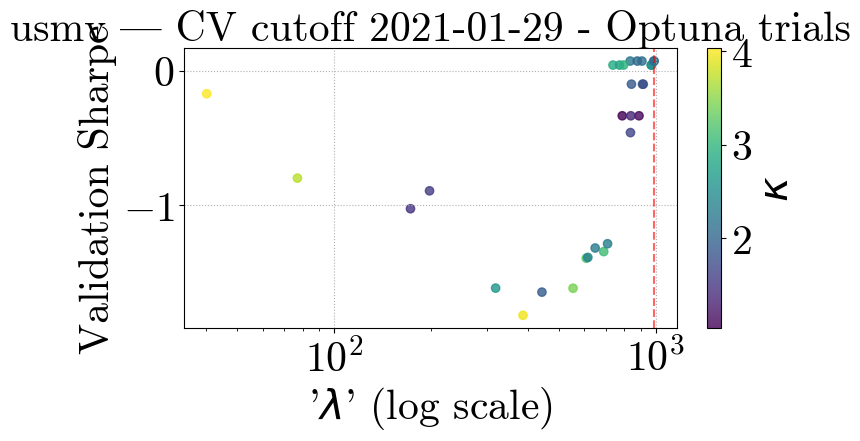

[I 2025-05-06 03:39:16,126] A new study created in memory with name: no-name-a842f690-078b-4ee1-bfd1-876c718e036a
[I 2025-05-06 03:39:24,346] Trial 0 finished with value: -0.0783127848022594 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.0783127848022594.
[I 2025-05-06 03:39:27,890] Trial 1 finished with value: -0.7926926049321046 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.0783127848022594.
[I 2025-05-06 03:39:37,394] Trial 2 finished with value: -0.15426532143266444 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.0783127848022594.
[I 2025-05-06 03:39:48,858] Trial 3 finished with value: -0.6101585088748018 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.0783127848022594.
[I 2025-05-06 03:39:52,645] Trial 4 finished with value: -1.4214933110468981 an

Optuna best λ=130.0925, κ=3.017077883301691, Sharpe=0.1008


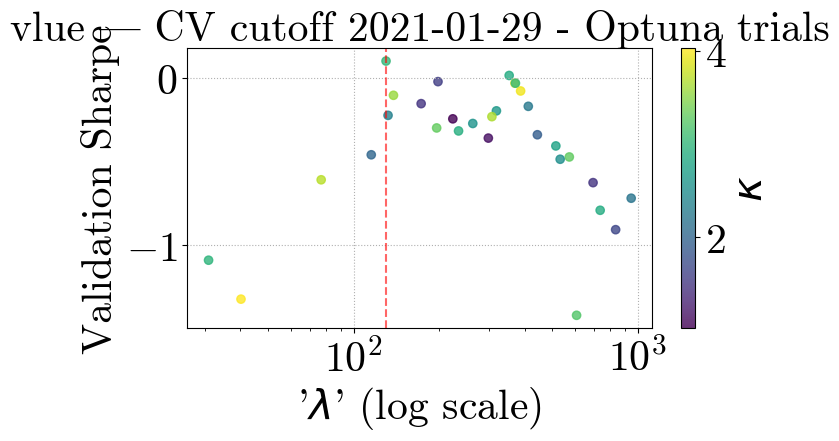

[I 2025-05-06 03:43:01,689] A new study created in memory with name: no-name-6e983937-9eef-4f8c-ad4e-15b8dbfc2def
[I 2025-05-06 03:43:06,639] Trial 0 finished with value: 0.6738223626628049 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6738223626628049.
[I 2025-05-06 03:43:11,643] Trial 1 finished with value: 0.6381802582603675 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6738223626628049.
[I 2025-05-06 03:43:20,109] Trial 2 finished with value: 0.6252039439073303 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6738223626628049.
[I 2025-05-06 03:43:30,643] Trial 3 finished with value: 0.34176925064084623 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6738223626628049.
[I 2025-05-06 03:43:35,661] Trial 4 finished with value: 0.6763523496577227 and paramet

Optuna best λ=601.2250, κ=2.0161336400150702, Sharpe=0.7992


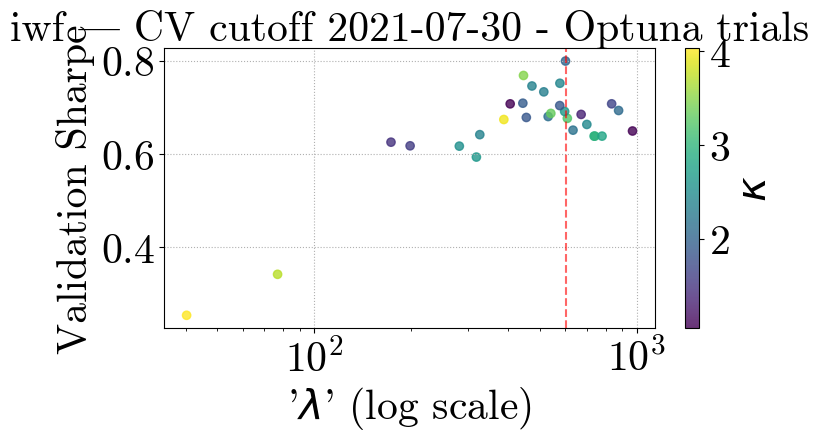

[I 2025-05-06 03:45:57,173] A new study created in memory with name: no-name-c1b168b5-8404-49e5-b3a8-18cc0ab81b03
[I 2025-05-06 03:46:05,375] Trial 0 finished with value: 0.08953612997564661 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.08953612997564661.
[I 2025-05-06 03:46:09,789] Trial 1 finished with value: 0.28544197460609494 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.28544197460609494.
[I 2025-05-06 03:46:17,703] Trial 2 finished with value: 0.10322157698970268 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.28544197460609494.
[I 2025-05-06 03:46:35,007] Trial 3 finished with value: -0.4358918306842072 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.28544197460609494.
[I 2025-05-06 03:46:40,492] Trial 4 finished with value: 0.28544197460609494 and

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.2854


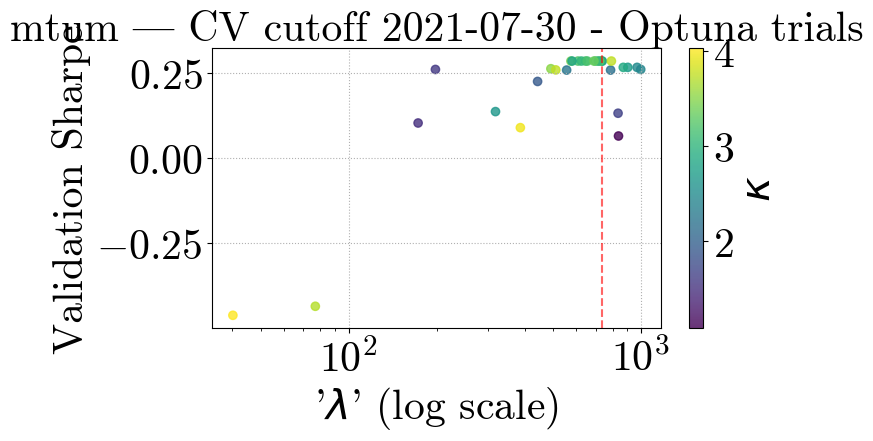

[I 2025-05-06 03:48:57,175] A new study created in memory with name: no-name-217f9dc6-643b-4b0e-bd2a-6931b0a1ad41
[I 2025-05-06 03:49:04,204] Trial 0 finished with value: -0.03694063410899846 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.03694063410899846.
[I 2025-05-06 03:49:10,407] Trial 1 finished with value: 0.5061903906810902 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5061903906810902.
[I 2025-05-06 03:49:18,952] Trial 2 finished with value: -0.08711427739349749 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5061903906810902.
[I 2025-05-06 03:49:31,122] Trial 3 finished with value: 0.3488507102388983 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5061903906810902.
[I 2025-05-06 03:49:39,877] Trial 4 finished with value: 0.357114738321349 and par

Optuna best λ=636.2610, κ=1.2224080892977907, Sharpe=0.5581


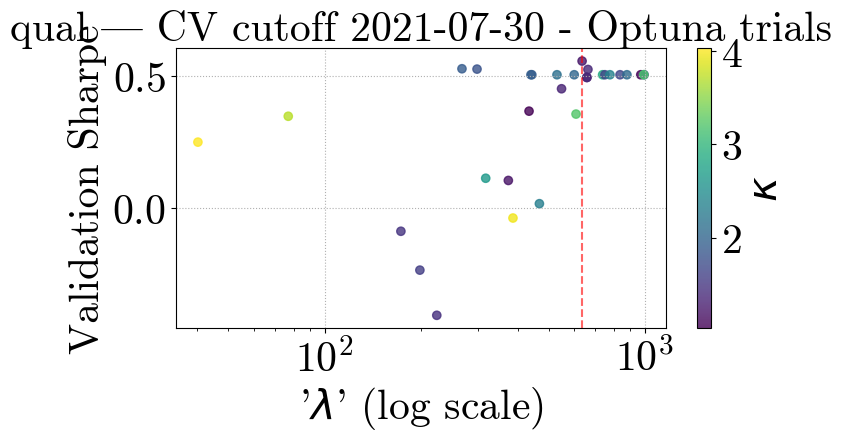

[I 2025-05-06 03:52:41,969] A new study created in memory with name: no-name-4c2ec939-285a-4a73-9176-7df810d17966
[I 2025-05-06 03:52:47,802] Trial 0 finished with value: 0.5024056670325765 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5024056670325765.
[I 2025-05-06 03:52:51,973] Trial 1 finished with value: 0.49347999802157777 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5024056670325765.
[I 2025-05-06 03:53:01,736] Trial 2 finished with value: 0.21589941445620417 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5024056670325765.
[I 2025-05-06 03:53:15,371] Trial 3 finished with value: -0.4119144756998933 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5024056670325765.
[I 2025-05-06 03:53:19,682] Trial 4 finished with value: 0.5458309295102983 and param

Optuna best λ=600.7803, κ=3.2506760653696363, Sharpe=0.5926


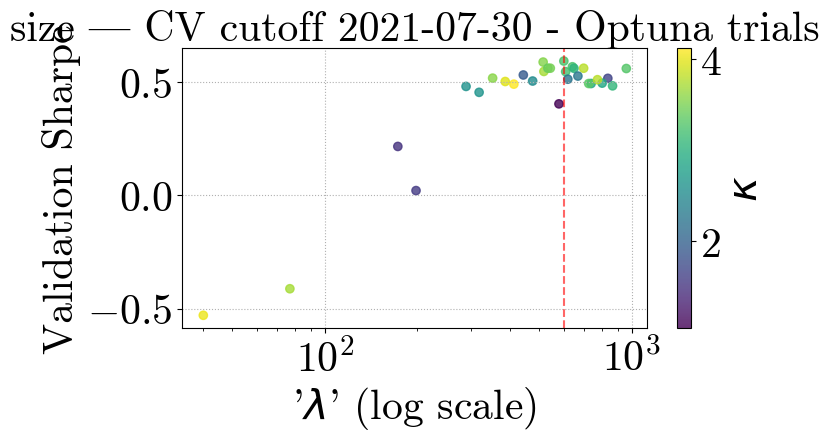

[I 2025-05-06 03:55:37,756] A new study created in memory with name: no-name-c77ee5a0-9803-4efc-a033-4190863b58db
[I 2025-05-06 03:55:42,784] Trial 0 finished with value: -1.4256448053647368 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.4256448053647368.
[I 2025-05-06 03:55:47,588] Trial 1 finished with value: -0.5148537219188278 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.5148537219188278.
[I 2025-05-06 03:55:53,517] Trial 2 finished with value: -1.0288099661364756 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.5148537219188278.
[I 2025-05-06 03:56:02,499] Trial 3 finished with value: -0.6874285758760842 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.5148537219188278.
[I 2025-05-06 03:56:07,951] Trial 4 finished with value: -0.8976050760680604 and

Optuna best λ=822.7978, κ=2.077924366834204, Sharpe=0.3283


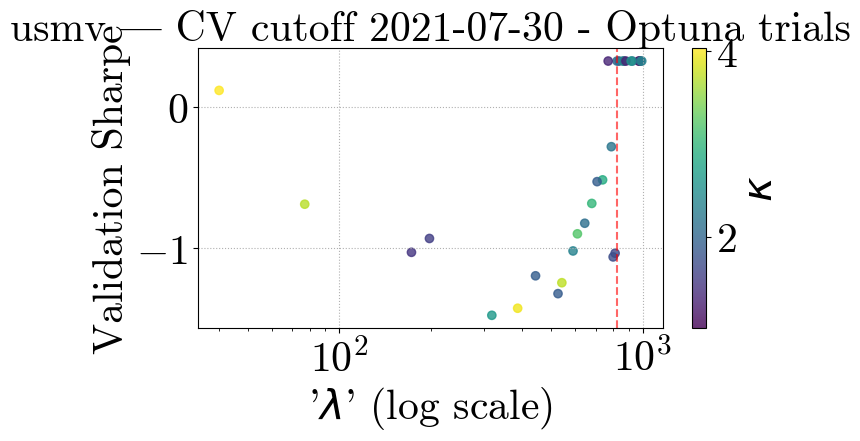

[I 2025-05-06 03:58:09,353] A new study created in memory with name: no-name-9246b4b3-ee62-4db9-97c9-216476bdb04f
[I 2025-05-06 03:58:17,218] Trial 0 finished with value: 0.1244378345745815 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.1244378345745815.
[I 2025-05-06 03:58:21,048] Trial 1 finished with value: -0.8526992512403353 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.1244378345745815.
[I 2025-05-06 03:58:29,104] Trial 2 finished with value: 0.12821572954938237 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.12821572954938237.
[I 2025-05-06 03:58:41,799] Trial 3 finished with value: -0.4518054007168283 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.12821572954938237.
[I 2025-05-06 03:58:46,054] Trial 4 finished with value: -0.7246706975312038 and pa

Optuna best λ=297.0686, κ=2.1264100430875756, Sharpe=0.1916


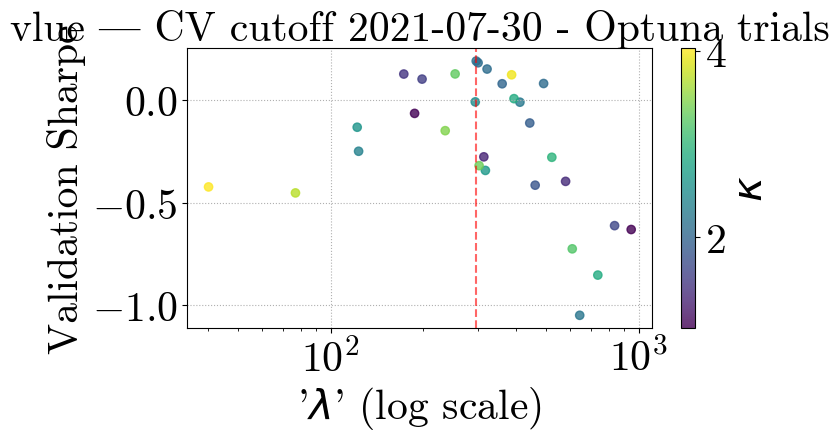

[I 2025-05-06 04:01:38,765] A new study created in memory with name: no-name-756e0bb9-f35f-4337-8efa-3fd2353deea4
[I 2025-05-06 04:01:43,801] Trial 0 finished with value: 0.6061468279516175 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6061468279516175.
[I 2025-05-06 04:01:49,168] Trial 1 finished with value: 0.5806937446241767 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6061468279516175.
[I 2025-05-06 04:01:57,618] Trial 2 finished with value: 0.5647603183198997 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6061468279516175.
[I 2025-05-06 04:02:07,105] Trial 3 finished with value: 0.1492864006325037 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6061468279516175.
[I 2025-05-06 04:02:12,765] Trial 4 finished with value: 0.5806937446241767 and paramete

Optuna best λ=574.2538, κ=2.268842850975212, Sharpe=0.6617


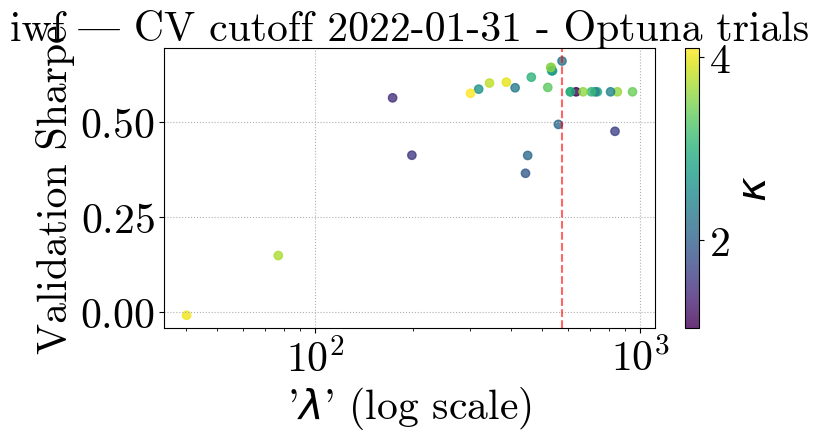

[I 2025-05-06 04:04:40,769] A new study created in memory with name: no-name-54b3aadd-9c21-4075-9118-ed414ac77879
[I 2025-05-06 04:04:47,698] Trial 0 finished with value: -0.1601607976082968 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1601607976082968.
[I 2025-05-06 04:04:51,664] Trial 1 finished with value: 0.09790937968712625 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.09790937968712625.
[I 2025-05-06 04:04:56,746] Trial 2 finished with value: -0.2352888974261642 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.09790937968712625.
[I 2025-05-06 04:05:12,312] Trial 3 finished with value: -0.2173179715949371 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.09790937968712625.
[I 2025-05-06 04:05:16,885] Trial 4 finished with value: 0.09790937968712625 and

Optuna best λ=727.5946, κ=1.0041336066094295, Sharpe=1.0076


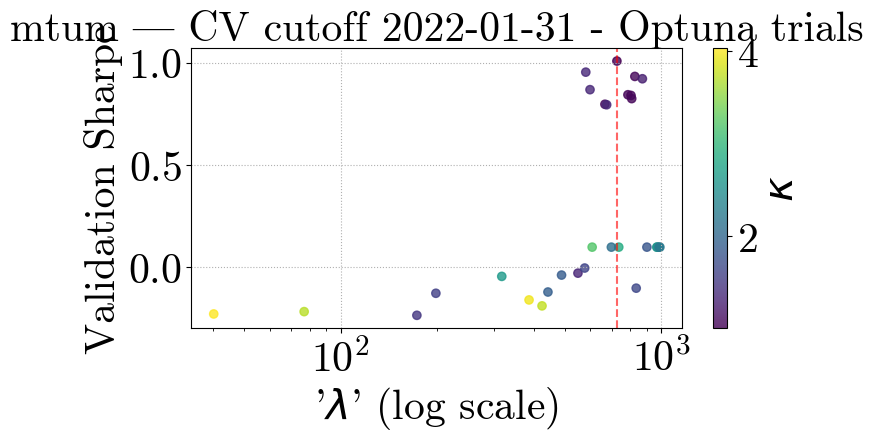

[I 2025-05-06 04:07:28,969] A new study created in memory with name: no-name-7933f271-1f3a-4f25-a5e8-4b192246abf7
[I 2025-05-06 04:07:35,992] Trial 0 finished with value: -0.2631473578661373 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2631473578661373.
[I 2025-05-06 04:07:39,665] Trial 1 finished with value: 0.19724361672826332 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.19724361672826332.
[I 2025-05-06 04:07:46,063] Trial 2 finished with value: -0.40657337855939424 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.19724361672826332.
[I 2025-05-06 04:07:56,091] Trial 3 finished with value: 0.43712034434223 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.43712034434223.
[I 2025-05-06 04:08:02,794] Trial 4 finished with value: 0.19724361672826315 and para

Optuna best λ=27.3964, κ=3.9798232276603978, Sharpe=0.4636


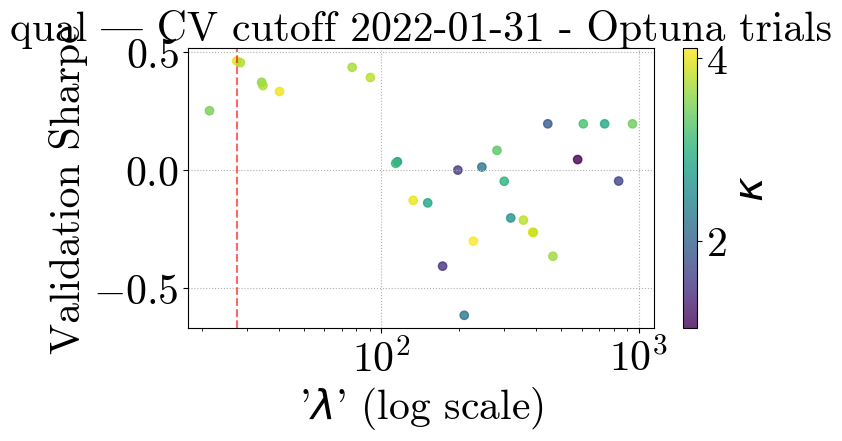

[I 2025-05-06 04:12:14,676] A new study created in memory with name: no-name-a6d0e9cb-3133-44a6-9896-697eea3b1d02
[I 2025-05-06 04:12:19,313] Trial 0 finished with value: 0.6151007202210258 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6151007202210258.
[I 2025-05-06 04:12:23,674] Trial 1 finished with value: 0.6433426898433062 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6433426898433062.
[I 2025-05-06 04:12:30,743] Trial 2 finished with value: -0.022173245567668594 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6433426898433062.
[I 2025-05-06 04:12:39,694] Trial 3 finished with value: -0.22700864405683793 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.6433426898433062.
[I 2025-05-06 04:12:45,908] Trial 4 finished with value: 0.6802003417850723 and par

Optuna best λ=934.3147, κ=1.0589408618198615, Sharpe=0.6947


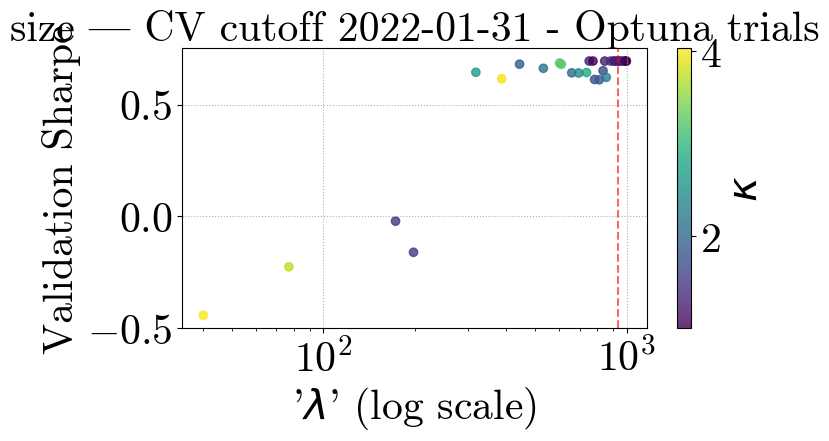

[I 2025-05-06 04:14:30,324] A new study created in memory with name: no-name-3c0b9cd0-42c6-4e2c-bd6e-7aaa21494376
[I 2025-05-06 04:14:37,344] Trial 0 finished with value: -1.1328855526594384 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.1328855526594384.
[I 2025-05-06 04:14:41,410] Trial 1 finished with value: -0.6466565085313821 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6466565085313821.
[I 2025-05-06 04:14:49,875] Trial 2 finished with value: -0.9945173558289777 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.6466565085313821.
[I 2025-05-06 04:15:04,161] Trial 3 finished with value: -0.8551629268889452 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.6466565085313821.
[I 2025-05-06 04:15:08,455] Trial 4 finished with value: -0.8622068583053905 and

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=-0.0303


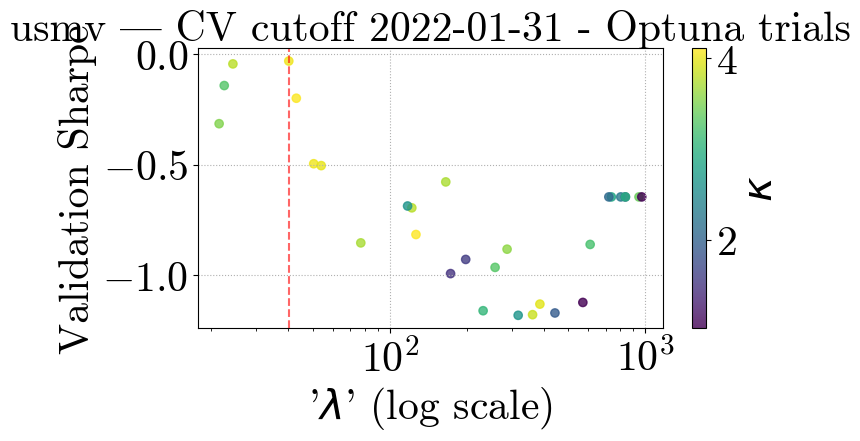

[I 2025-05-06 04:19:06,441] A new study created in memory with name: no-name-f5fb387b-de06-4a8f-bd99-ea4b74af3ed7
[I 2025-05-06 04:19:14,106] Trial 0 finished with value: 0.11233955486266924 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.11233955486266924.
[I 2025-05-06 04:19:19,323] Trial 1 finished with value: -0.13334707181550326 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.11233955486266924.
[I 2025-05-06 04:19:28,539] Trial 2 finished with value: 0.04029806513303128 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.11233955486266924.
[I 2025-05-06 04:19:38,670] Trial 3 finished with value: -0.17684051408770876 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.11233955486266924.
[I 2025-05-06 04:19:44,988] Trial 4 finished with value: -0.18957005316506603 

Optuna best λ=302.6155, κ=2.640561910157082, Sharpe=0.5519


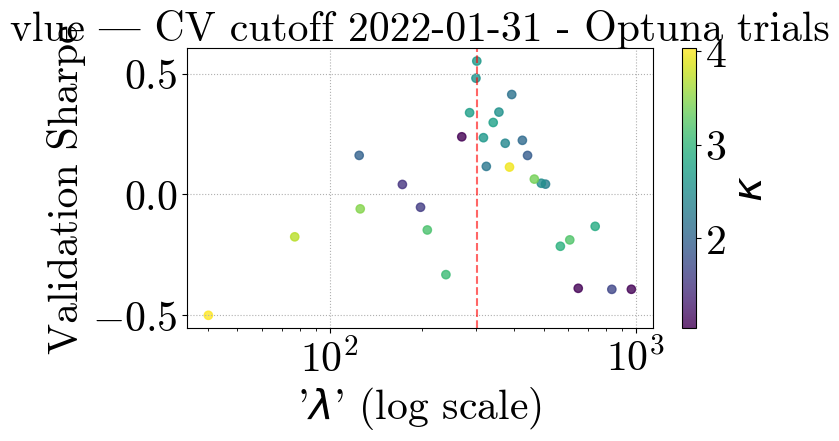

[I 2025-05-06 04:22:36,952] A new study created in memory with name: no-name-79d807cd-51d8-4036-a2d2-3e06a25e759a
[I 2025-05-06 04:22:41,891] Trial 0 finished with value: 0.10362053873468559 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.10362053873468559.
[I 2025-05-06 04:22:44,922] Trial 1 finished with value: 0.04516600193071811 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.10362053873468559.
[I 2025-05-06 04:22:53,174] Trial 2 finished with value: -0.04215393365696272 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.10362053873468559.
[I 2025-05-06 04:23:08,069] Trial 3 finished with value: -0.0005283226644255249 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.10362053873468559.
[I 2025-05-06 04:23:11,202] Trial 4 finished with value: -0.0640528297459096

Optuna best λ=970.1464, κ=3.470555295160849, Sharpe=0.2940


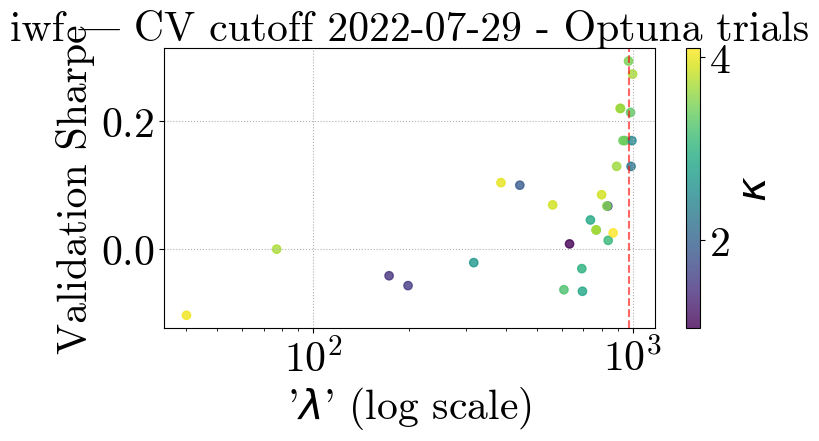

[I 2025-05-06 04:24:56,439] A new study created in memory with name: no-name-666f713f-ac4f-4dc3-b64d-e89319b96797
[I 2025-05-06 04:25:03,288] Trial 0 finished with value: -0.11749590317201701 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.11749590317201701.
[I 2025-05-06 04:25:07,534] Trial 1 finished with value: -0.11810557724245951 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.11749590317201701.
[I 2025-05-06 04:25:13,950] Trial 2 finished with value: -0.21965155210072723 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.11749590317201701.
[I 2025-05-06 04:25:34,916] Trial 3 finished with value: -0.3756022715322141 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.11749590317201701.
[I 2025-05-06 04:25:39,172] Trial 4 finished with value: -0.1162798430622

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.1959


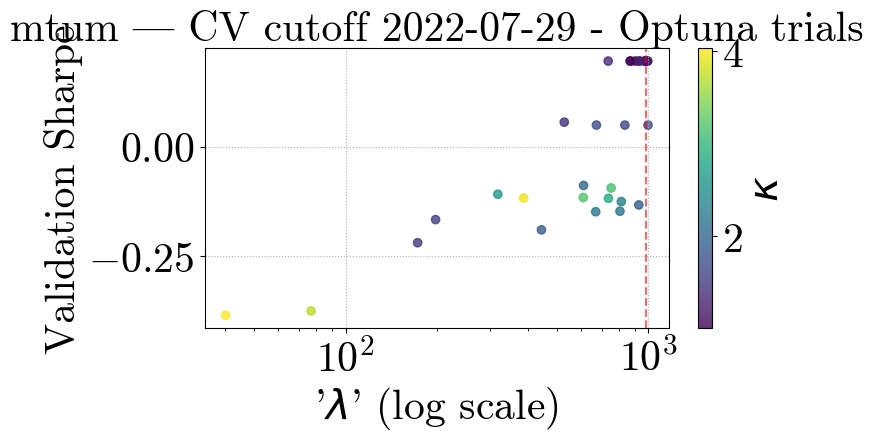

[I 2025-05-06 04:27:39,938] A new study created in memory with name: no-name-8660485a-ccf2-4c13-9e15-d69bcc961139
[I 2025-05-06 04:27:45,772] Trial 0 finished with value: -0.286061353111019 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.286061353111019.
[I 2025-05-06 04:27:49,868] Trial 1 finished with value: -0.2243646404129108 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.2243646404129108.
[I 2025-05-06 04:27:58,719] Trial 2 finished with value: -0.17467258390069262 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.17467258390069262.
[I 2025-05-06 04:28:10,768] Trial 3 finished with value: 0.1865321844964666 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1865321844964666.
[I 2025-05-06 04:28:16,617] Trial 4 finished with value: -0.09415830838720018 and 

Optuna best λ=23.3793, κ=2.302099589726057, Sharpe=0.3063


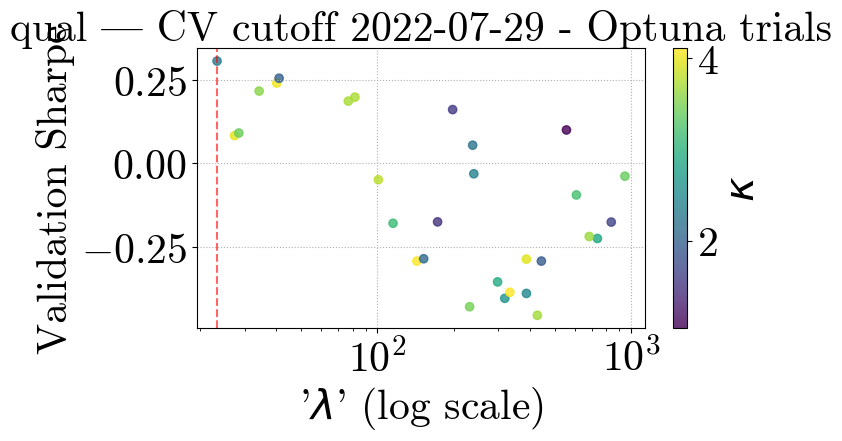

[I 2025-05-06 04:32:14,582] A new study created in memory with name: no-name-48262623-0863-41f0-9c4a-9efc8cc676ef
[I 2025-05-06 04:32:21,617] Trial 0 finished with value: 0.5866101419024818 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5866101419024818.
[I 2025-05-06 04:32:26,749] Trial 1 finished with value: 0.5961466470403587 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5961466470403587.
[I 2025-05-06 04:32:37,166] Trial 2 finished with value: 0.30337070680292266 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5961466470403587.
[I 2025-05-06 04:32:53,072] Trial 3 finished with value: 0.15899252721390839 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5961466470403587.
[I 2025-05-06 04:32:58,547] Trial 4 finished with value: 0.5977142115349448 and parame

Optuna best λ=817.2711, κ=3.392580189667147, Sharpe=0.5980


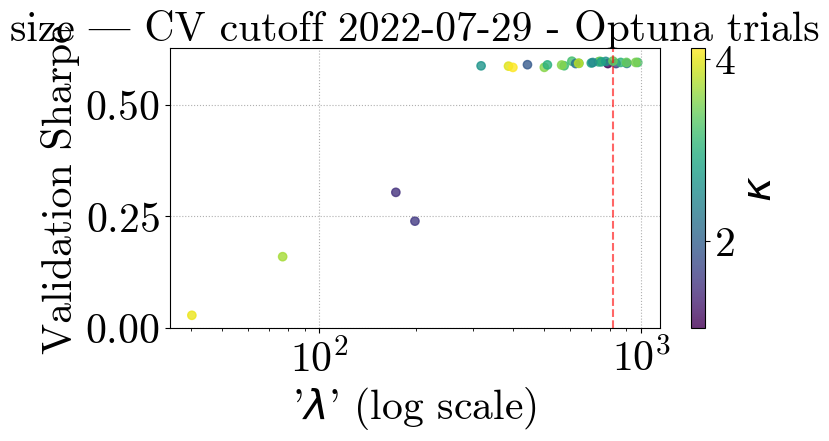

[I 2025-05-06 04:35:36,040] A new study created in memory with name: no-name-6938d96b-6b37-4bcb-a22e-f1fa20602f79
[I 2025-05-06 04:35:40,728] Trial 0 finished with value: -0.7449114295189874 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7449114295189874.
[I 2025-05-06 04:35:47,981] Trial 1 finished with value: -0.706997971536746 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.706997971536746.
[I 2025-05-06 04:35:54,616] Trial 2 finished with value: -0.3476391780199266 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.3476391780199266.
[I 2025-05-06 04:36:05,065] Trial 3 finished with value: -0.24195148984248524 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.24195148984248524.
[I 2025-05-06 04:36:09,465] Trial 4 finished with value: -0.8771234177119575 and

Optuna best λ=31.6270, κ=3.743171508134014, Sharpe=0.0997


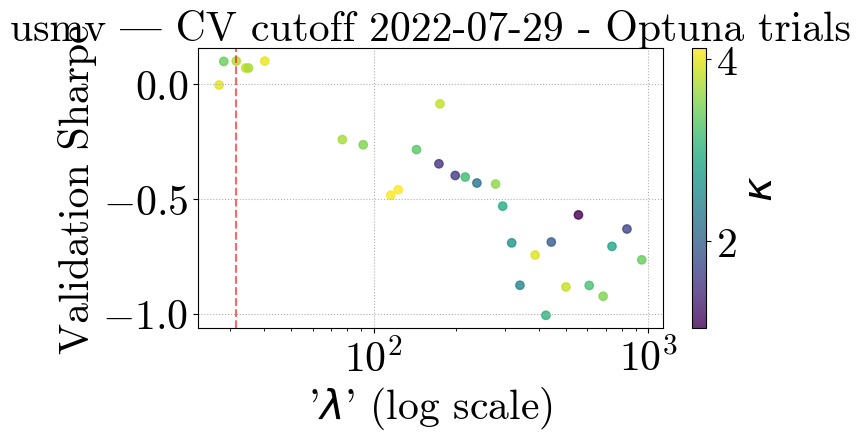

[I 2025-05-06 04:39:56,747] A new study created in memory with name: no-name-c6bb1b02-89c8-4a3b-b9d0-75645dbc8cad
[I 2025-05-06 04:40:02,594] Trial 0 finished with value: -0.2075498954953759 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2075498954953759.
[I 2025-05-06 04:40:08,497] Trial 1 finished with value: 0.18074739364036715 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.18074739364036715.
[I 2025-05-06 04:40:14,897] Trial 2 finished with value: -0.1925453272932915 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.18074739364036715.
[I 2025-05-06 04:40:24,610] Trial 3 finished with value: 0.1964116596595728 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1964116596595728.
[I 2025-05-06 04:40:30,362] Trial 4 finished with value: -0.0009934345728617037 an

Optuna best λ=709.4665, κ=3.001315520322696, Sharpe=0.3570


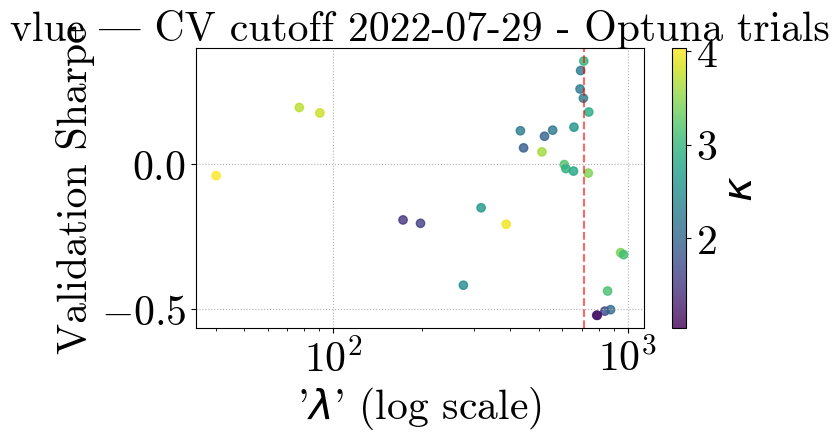

[I 2025-05-06 04:43:22,542] A new study created in memory with name: no-name-b05e55ff-dd0b-4f5d-a201-1b7bc13c9619
[I 2025-05-06 04:43:27,784] Trial 0 finished with value: -0.08846005557970907 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.08846005557970907.
[I 2025-05-06 04:43:30,442] Trial 1 finished with value: -0.2526030361609736 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.08846005557970907.
[I 2025-05-06 04:43:41,727] Trial 2 finished with value: -0.09350464544493248 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.08846005557970907.
[I 2025-05-06 04:43:55,241] Trial 3 finished with value: -0.14394226319798265 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.08846005557970907.
[I 2025-05-06 04:43:58,441] Trial 4 finished with value: -0.1854908618587

Optuna best λ=948.0226, κ=1.392115193311568, Sharpe=0.1233


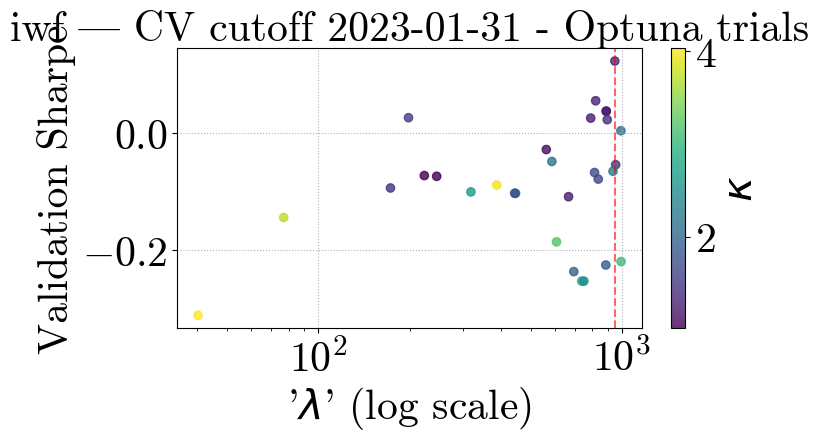

[I 2025-05-06 04:45:46,129] A new study created in memory with name: no-name-8b5b2172-2f0d-4e64-a6f7-81c1847ebbf5
[I 2025-05-06 04:45:57,525] Trial 0 finished with value: -0.12633095386486415 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.12633095386486415.
[I 2025-05-06 04:46:04,290] Trial 1 finished with value: -0.20367996963301105 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.12633095386486415.
[I 2025-05-06 04:46:13,162] Trial 2 finished with value: -0.5447709813542041 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.12633095386486415.
[I 2025-05-06 04:46:31,127] Trial 3 finished with value: -0.5894511046409987 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.12633095386486415.
[I 2025-05-06 04:46:38,144] Trial 4 finished with value: -0.13971745103355

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.6632


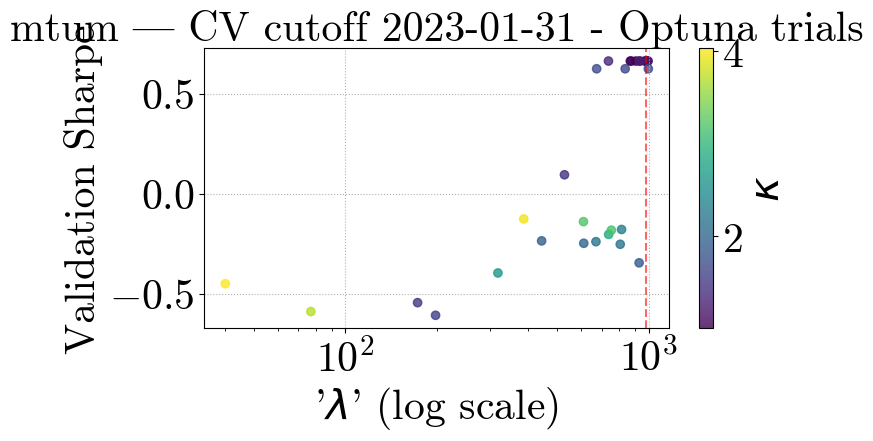

[I 2025-05-06 04:48:58,072] A new study created in memory with name: no-name-2ca86337-b896-4baa-b6bf-3ff54aecc805
[I 2025-05-06 04:49:08,457] Trial 0 finished with value: -0.09221480271637426 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.09221480271637426.
[I 2025-05-06 04:49:16,740] Trial 1 finished with value: -0.09221480271637426 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.09221480271637426.
[I 2025-05-06 04:49:42,838] Trial 2 finished with value: 0.27353199787183596 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.27353199787183596.
[I 2025-05-06 04:49:55,826] Trial 3 finished with value: 0.23017911075517 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.27353199787183596.
[I 2025-05-06 04:50:04,356] Trial 4 finished with value: -0.09221480271637426 a

Optuna best λ=27.3964, κ=1.0799836552286157, Sharpe=0.4269


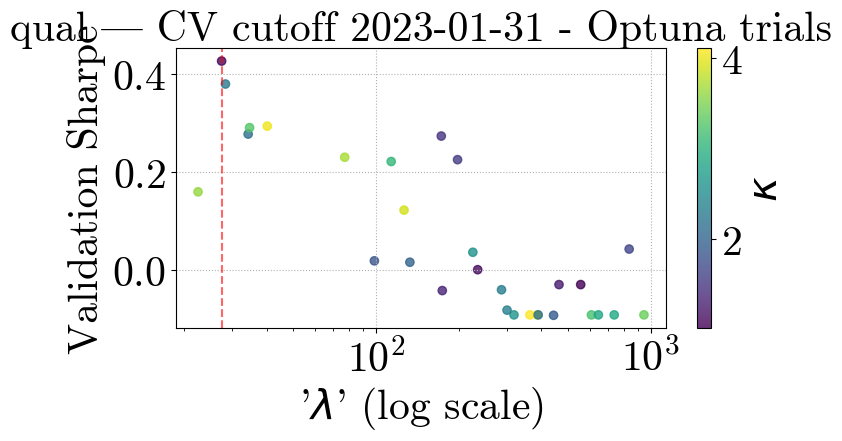

[I 2025-05-06 04:53:58,175] A new study created in memory with name: no-name-d24e2fb4-0eff-4ca8-925b-1e7cc90ffb54
[I 2025-05-06 04:54:04,686] Trial 0 finished with value: 0.39113932389610995 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.39113932389610995.
[I 2025-05-06 04:54:09,555] Trial 1 finished with value: 0.38755458307213103 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.39113932389610995.
[I 2025-05-06 04:54:19,537] Trial 2 finished with value: 0.1239895153254502 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.39113932389610995.
[I 2025-05-06 04:54:29,470] Trial 3 finished with value: 0.11003738558459988 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.39113932389610995.
[I 2025-05-06 04:54:34,721] Trial 4 finished with value: 0.38671476499176405 and 

Optuna best λ=241.8989, κ=3.729580827239918, Sharpe=0.4057


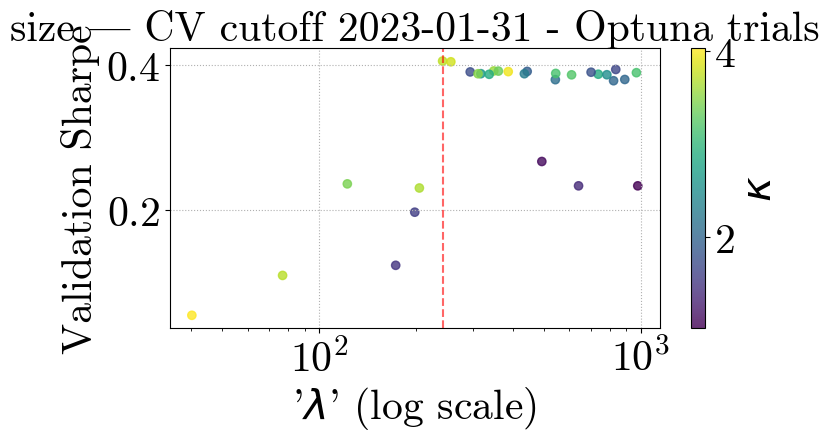

[I 2025-05-06 04:57:23,352] A new study created in memory with name: no-name-aece8c6b-052c-4ccc-b364-8b50e000482c
[I 2025-05-06 04:57:27,234] Trial 0 finished with value: -0.21035399442540242 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.21035399442540242.
[I 2025-05-06 04:57:31,223] Trial 1 finished with value: -0.624132050450707 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.21035399442540242.
[I 2025-05-06 04:57:39,356] Trial 2 finished with value: -0.46295955765863667 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.21035399442540242.
[I 2025-05-06 04:57:51,140] Trial 3 finished with value: -0.2964933148085218 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.21035399442540242.
[I 2025-05-06 04:57:54,656] Trial 4 finished with value: -0.586331005282655

Optuna best λ=28.3342, κ=3.1772915080384827, Sharpe=0.0658


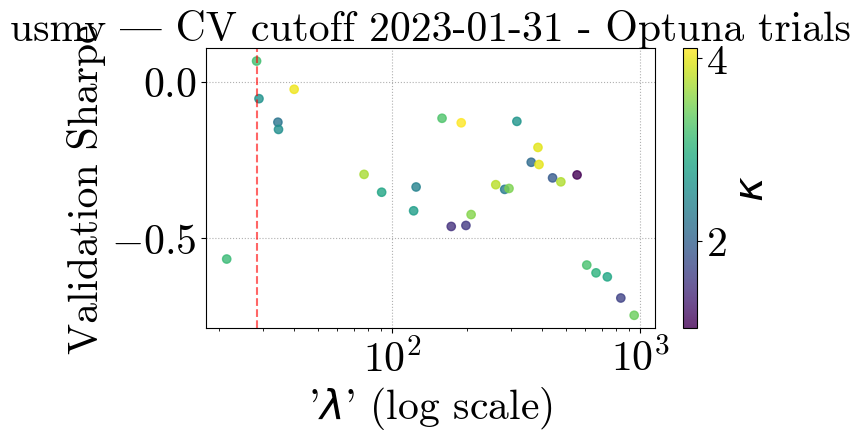

[I 2025-05-06 05:01:23,139] A new study created in memory with name: no-name-0b0c7f81-5a00-417b-b87c-680d09c7de4a
[I 2025-05-06 05:01:33,369] Trial 0 finished with value: 0.6010143539242302 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6010143539242302.
[I 2025-05-06 05:01:39,500] Trial 1 finished with value: -0.027114419207880037 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6010143539242302.
[I 2025-05-06 05:01:48,805] Trial 2 finished with value: 0.0386167172450715 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6010143539242302.
[I 2025-05-06 05:01:59,051] Trial 3 finished with value: 0.22519250816132166 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6010143539242302.
[I 2025-05-06 05:02:06,415] Trial 4 finished with value: -0.04125104401100137 and pa

Optuna best λ=362.7862, κ=3.1137742847580365, Sharpe=0.8144


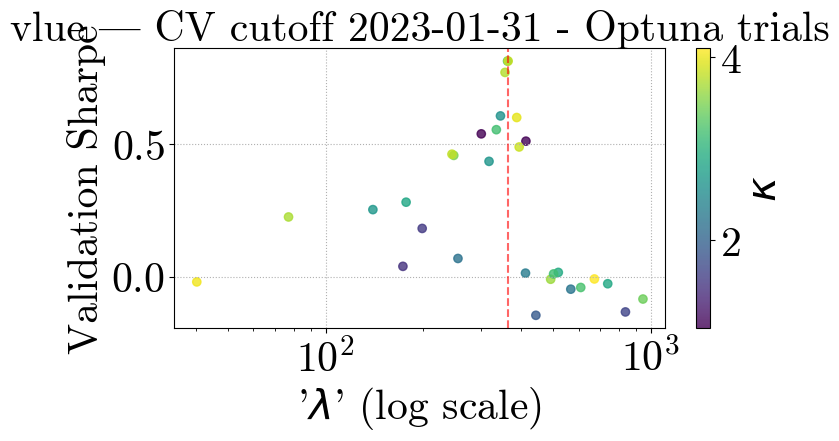

[I 2025-05-06 05:05:51,616] A new study created in memory with name: no-name-54e24072-d828-4f72-a375-453a4b730cb3
[I 2025-05-06 05:05:58,069] Trial 0 finished with value: -0.0588432777997627 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.0588432777997627.
[I 2025-05-06 05:06:03,401] Trial 1 finished with value: -0.06249253711327512 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.0588432777997627.
[I 2025-05-06 05:06:08,966] Trial 2 finished with value: -0.2841893479734127 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.0588432777997627.
[I 2025-05-06 05:06:28,369] Trial 3 finished with value: -0.09791270113077706 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.0588432777997627.
[I 2025-05-06 05:06:33,796] Trial 4 finished with value: -0.1007555681477148 a

Optuna best λ=666.7470, κ=2.4258331254949925, Sharpe=-0.0330


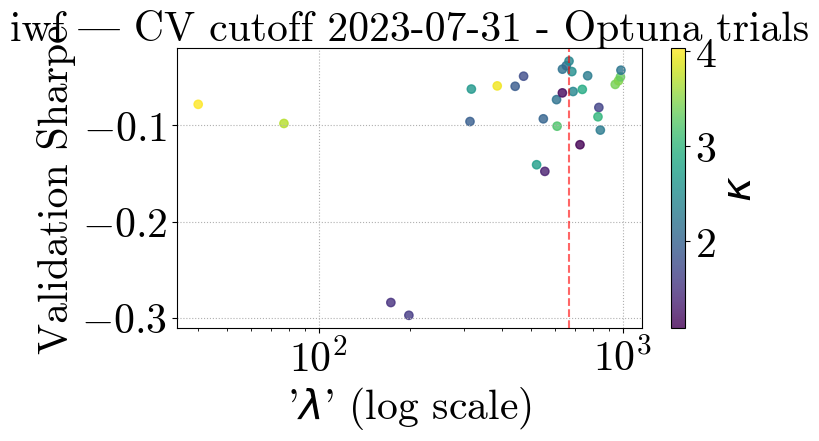

[I 2025-05-06 05:09:38,534] A new study created in memory with name: no-name-7dc68a06-2bbe-4b4c-b196-87bccae43768
[I 2025-05-06 05:09:41,470] Trial 0 finished with value: -0.7053988330163264 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7053988330163264.
[I 2025-05-06 05:09:43,733] Trial 1 finished with value: -0.049725158118392745 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.049725158118392745.
[I 2025-05-06 05:09:50,151] Trial 2 finished with value: -0.683679206025214 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.049725158118392745.
[I 2025-05-06 05:10:16,965] Trial 3 finished with value: -0.858904862449032 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.049725158118392745.
[I 2025-05-06 05:10:20,384] Trial 4 finished with value: -0.08348697329266

Optuna best λ=886.5855, κ=1.0823503127445395, Sharpe=0.6311


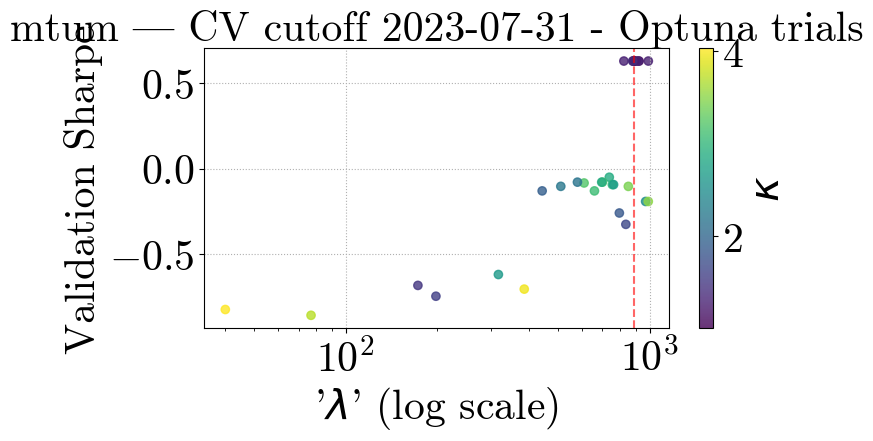

[I 2025-05-06 05:12:11,256] A new study created in memory with name: no-name-e77dd96e-af22-4c07-8ba9-96cf93a0ca7f
[I 2025-05-06 05:12:25,407] Trial 0 finished with value: 0.36438576818246643 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.36438576818246643.
[I 2025-05-06 05:12:34,060] Trial 1 finished with value: 0.36438576818246643 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.36438576818246643.
[I 2025-05-06 05:12:42,166] Trial 2 finished with value: 0.39390893123860155 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.39390893123860155.
[I 2025-05-06 05:13:00,260] Trial 3 finished with value: 0.1566115742672347 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.39390893123860155.
[I 2025-05-06 05:13:09,277] Trial 4 finished with value: 0.36438576818246643 and 

Optuna best λ=299.7239, κ=2.9146190218595196, Sharpe=0.6180


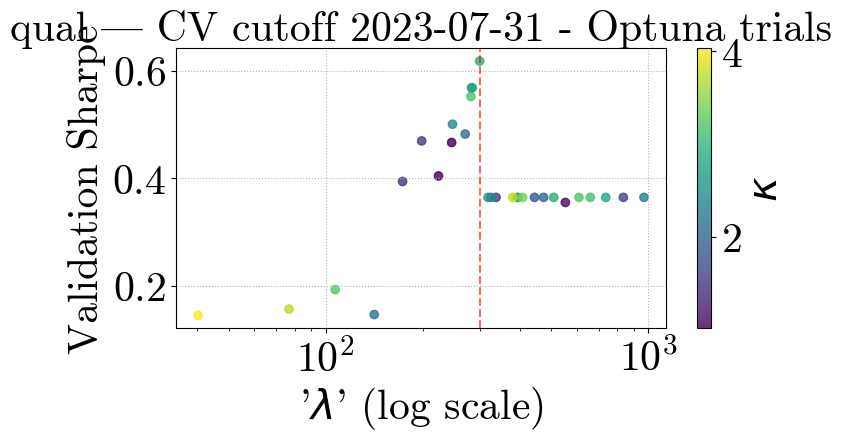

[I 2025-05-06 05:16:47,347] A new study created in memory with name: no-name-23471b7d-4402-47a6-acae-724000f1cedc
[I 2025-05-06 05:16:53,977] Trial 0 finished with value: 0.3429546734740162 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3429546734740162.
[I 2025-05-06 05:16:58,457] Trial 1 finished with value: 0.3706705662559376 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.3706705662559376.
[I 2025-05-06 05:17:07,825] Trial 2 finished with value: 0.36132099638800536 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.3706705662559376.
[I 2025-05-06 05:17:20,188] Trial 3 finished with value: 0.1069175308098496 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.3706705662559376.
[I 2025-05-06 05:17:24,909] Trial 4 finished with value: 0.3706705662559376 and paramet

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.3707


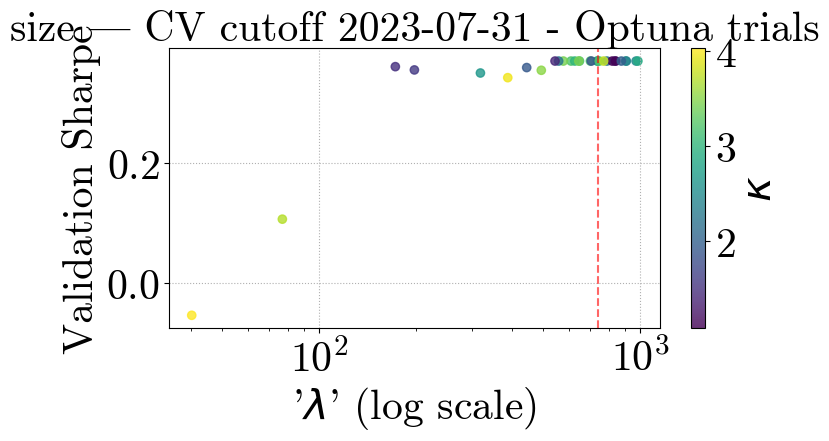

[I 2025-05-06 05:19:46,441] A new study created in memory with name: no-name-1c42bd3c-86de-4108-80bb-3e69a538a7e7
[I 2025-05-06 05:19:53,807] Trial 0 finished with value: 0.02227751936838856 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.02227751936838856.
[I 2025-05-06 05:19:57,978] Trial 1 finished with value: -0.013237540298710356 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.02227751936838856.
[I 2025-05-06 05:20:07,357] Trial 2 finished with value: -0.8409636892628227 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.02227751936838856.
[I 2025-05-06 05:20:18,540] Trial 3 finished with value: 0.4719194634709527 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.4719194634709527.
[I 2025-05-06 05:20:22,193] Trial 4 finished with value: 0.20155994136150496 and

Optuna best λ=137.4059, κ=3.6365983725805178, Sharpe=0.7201


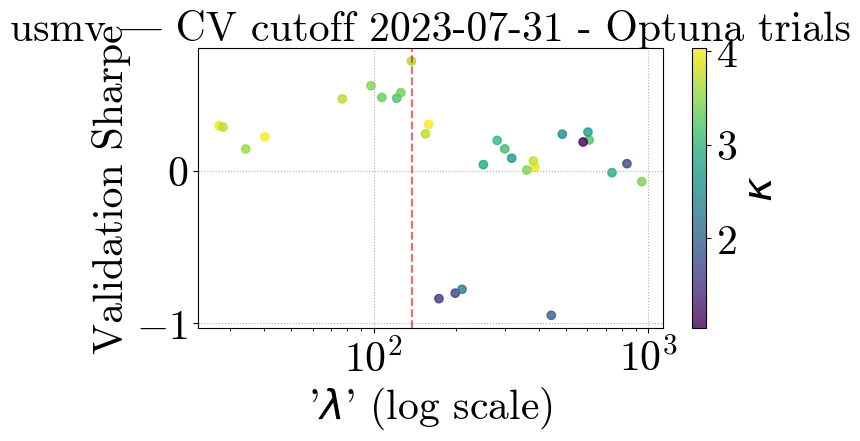

[I 2025-05-06 05:24:34,922] A new study created in memory with name: no-name-1b3369ab-0a00-4f43-9a48-d86f45ceed13
[I 2025-05-06 05:24:41,243] Trial 0 finished with value: -0.1031521229641723 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1031521229641723.
[I 2025-05-06 05:24:44,659] Trial 1 finished with value: -0.4734587350167723 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.1031521229641723.
[I 2025-05-06 05:24:57,637] Trial 2 finished with value: 0.16166775881399734 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.16166775881399734.
[I 2025-05-06 05:25:14,319] Trial 3 finished with value: 0.5686705125062047 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5686705125062047.
[I 2025-05-06 05:25:18,457] Trial 4 finished with value: -0.8013097678321419 and p

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.5855


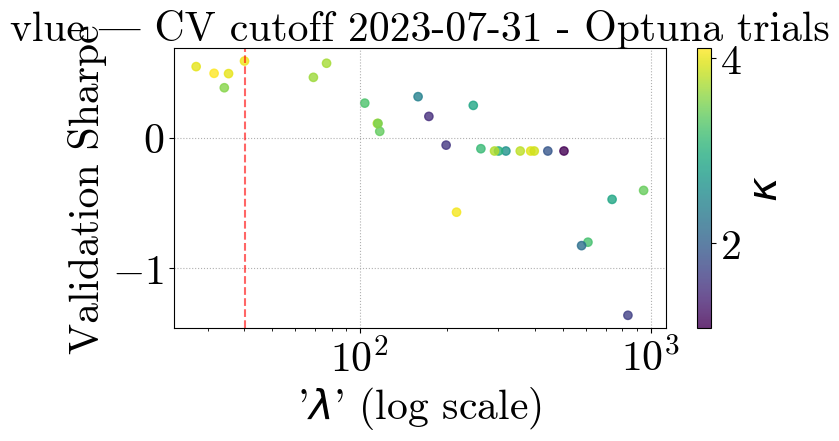

[I 2025-05-06 05:29:38,507] A new study created in memory with name: no-name-8d9456a1-d2ea-45c4-af5d-b7b17eb3042a
[I 2025-05-06 05:29:44,018] Trial 0 finished with value: -0.21738935844224616 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.21738935844224616.
[I 2025-05-06 05:29:49,737] Trial 1 finished with value: -0.2772890972114759 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.21738935844224616.
[I 2025-05-06 05:29:56,587] Trial 2 finished with value: -0.32688348100708237 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.21738935844224616.
[I 2025-05-06 05:30:08,489] Trial 3 finished with value: 0.18436457581812565 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.18436457581812565.
[I 2025-05-06 05:30:13,505] Trial 4 finished with value: -0.239295361192085

Optuna best λ=80.6479, κ=3.979848793475017, Sharpe=0.1845


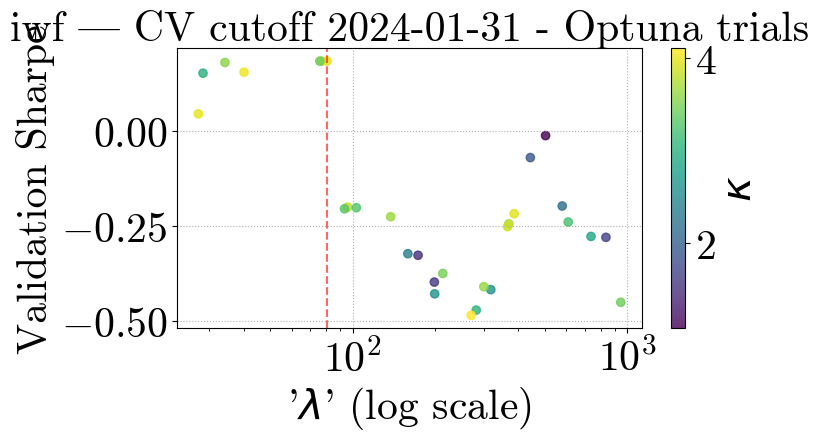

[I 2025-05-06 05:34:24,039] A new study created in memory with name: no-name-51edb477-44d7-4f5e-bffe-2026ef40b0d2
[I 2025-05-06 05:34:30,369] Trial 0 finished with value: -0.4807129579244465 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.4807129579244465.
[I 2025-05-06 05:34:35,214] Trial 1 finished with value: -0.4695537919744553 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.4695537919744553.
[I 2025-05-06 05:34:40,138] Trial 2 finished with value: -0.29977674067811266 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.29977674067811266.
[I 2025-05-06 05:34:56,887] Trial 3 finished with value: -1.3384396847225495 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.29977674067811266.
[I 2025-05-06 05:35:00,969] Trial 4 finished with value: -0.469937584854097 a

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=-0.2545


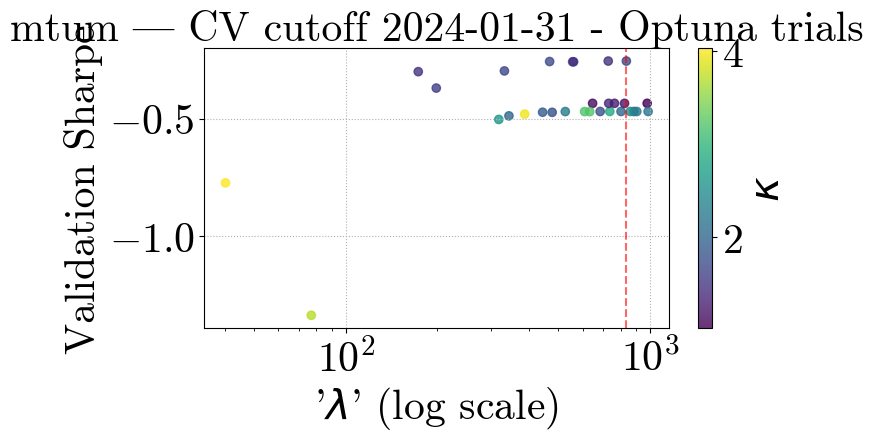

[I 2025-05-06 05:37:16,100] A new study created in memory with name: no-name-cfb98071-06c6-4d18-81bd-64a2598f1eb6
[I 2025-05-06 05:37:20,500] Trial 0 finished with value: -0.15722384680469556 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.15722384680469556.
[I 2025-05-06 05:37:23,780] Trial 1 finished with value: -0.15722384680469556 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.15722384680469556.
[I 2025-05-06 05:37:32,013] Trial 2 finished with value: 0.9004531596540754 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9004531596540754.
[I 2025-05-06 05:37:44,102] Trial 3 finished with value: -0.10078514560290405 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.9004531596540754.
[I 2025-05-06 05:37:48,080] Trial 4 finished with value: -0.15722384680469556 

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.9005


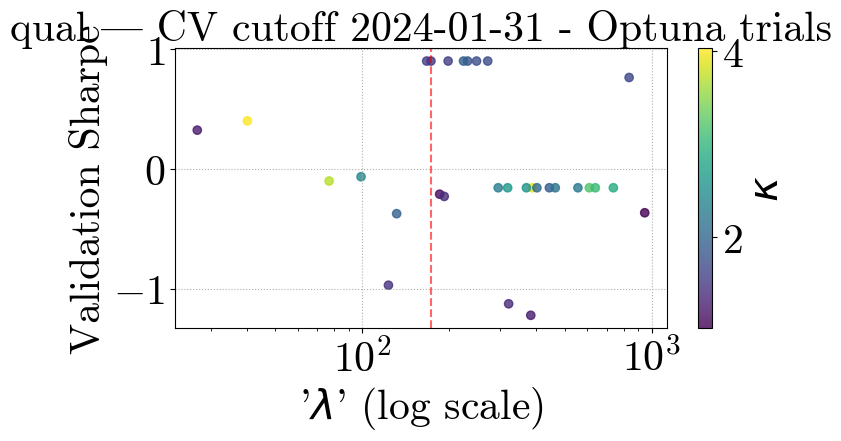

[I 2025-05-06 05:40:51,585] A new study created in memory with name: no-name-6f36c400-2f95-4bb7-ac34-923be0185912
[I 2025-05-06 05:40:56,230] Trial 0 finished with value: 0.40406132331668826 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.40406132331668826.
[I 2025-05-06 05:40:57,397] Trial 1 finished with value: 0.42441483835070337 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.42441483835070337.
[I 2025-05-06 05:41:09,185] Trial 2 finished with value: 0.17195534062622875 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.42441483835070337.
[I 2025-05-06 05:41:18,265] Trial 3 finished with value: 0.11167951466713066 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.42441483835070337.
[I 2025-05-06 05:41:24,734] Trial 4 finished with value: 0.42441483835070337 and

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.4244


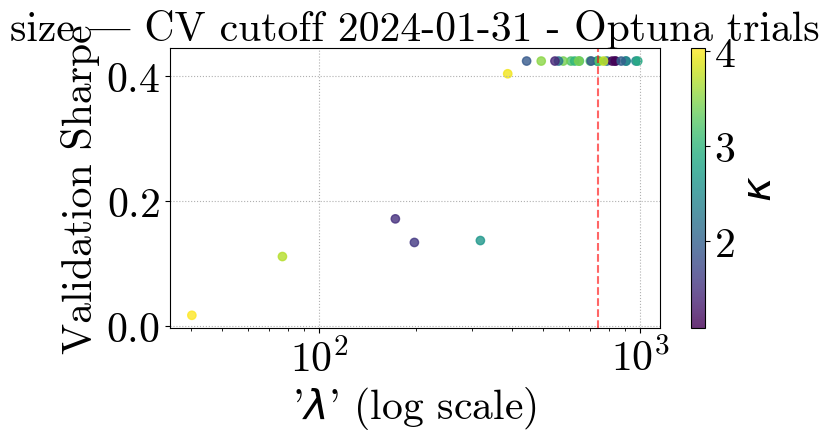

[I 2025-05-06 05:42:38,912] A new study created in memory with name: no-name-dfc3df80-b48e-4b02-8c0b-84176a482ba1
[I 2025-05-06 05:42:45,533] Trial 0 finished with value: -0.6221944852215988 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6221944852215988.
[I 2025-05-06 05:42:46,330] Trial 1 finished with value: -0.031184076453587492 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.031184076453587492.
[I 2025-05-06 05:42:53,710] Trial 2 finished with value: -0.4217816796253439 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.031184076453587492.
[I 2025-05-06 05:43:12,550] Trial 3 finished with value: 0.051686129319676435 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.051686129319676435.
[I 2025-05-06 05:43:17,986] Trial 4 finished with value: -0.238089381559

Optuna best λ=141.2897, κ=2.391977014712141, Sharpe=0.6859


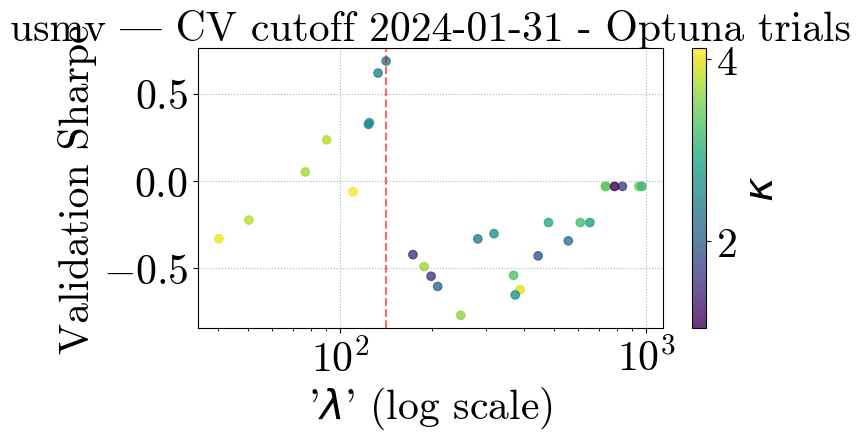

[I 2025-05-06 05:46:26,782] A new study created in memory with name: no-name-9b8ff551-e058-41c7-8225-d0f8ebac5403
[I 2025-05-06 05:46:35,930] Trial 0 finished with value: 0.16269092308732178 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.16269092308732178.
[I 2025-05-06 05:46:40,196] Trial 1 finished with value: 0.34788075410748853 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.34788075410748853.
[I 2025-05-06 05:46:51,058] Trial 2 finished with value: 0.16269092308732178 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.34788075410748853.
[I 2025-05-06 05:47:06,246] Trial 3 finished with value: 0.40304675049983035 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.40304675049983035.
[I 2025-05-06 05:47:11,198] Trial 4 finished with value: 0.34788075410748853 and

Optuna best λ=54.1609, κ=4.11127017016935, Sharpe=0.7453


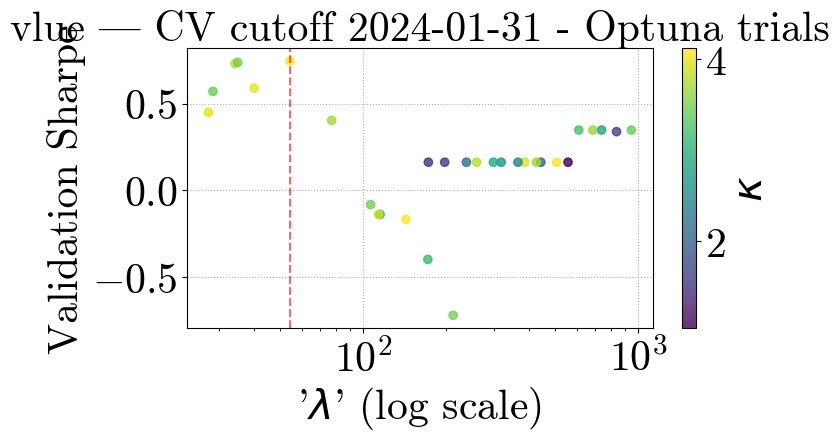

[I 2025-05-06 05:52:04,513] A new study created in memory with name: no-name-591a7eea-1bdd-454e-b9f7-c02780fd81ef
[I 2025-05-06 05:52:07,512] Trial 0 finished with value: -0.003522144160982319 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.003522144160982319.
[I 2025-05-06 05:52:10,093] Trial 1 finished with value: 0.03655802183095421 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.03655802183095421.
[I 2025-05-06 05:52:18,310] Trial 2 finished with value: 0.19963234571535396 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.19963234571535396.
[I 2025-05-06 05:52:27,528] Trial 3 finished with value: 0.10834012837591064 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.19963234571535396.
[I 2025-05-06 05:52:31,390] Trial 4 finished with value: 0.02449682392546554

Optuna best λ=882.9144, κ=1.2867137722414546, Sharpe=0.2757


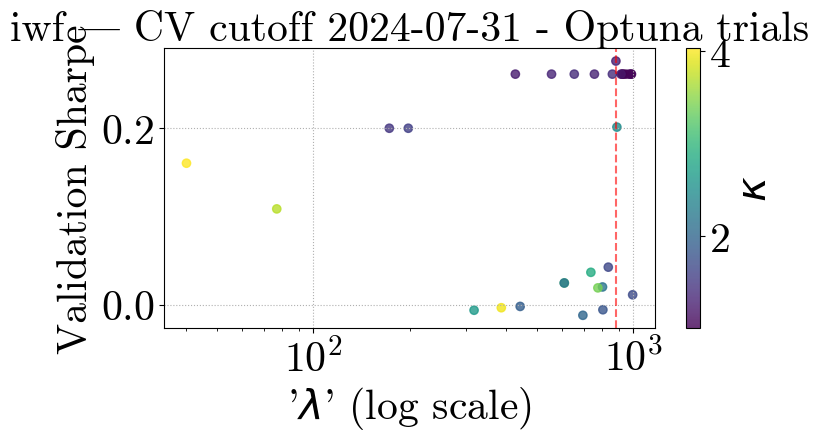

[I 2025-05-06 05:54:22,207] A new study created in memory with name: no-name-00777552-65a9-44b6-820d-9a83b9db86c4
[I 2025-05-06 05:54:27,743] Trial 0 finished with value: 0.21773322750222518 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.21773322750222518.
[I 2025-05-06 05:54:32,677] Trial 1 finished with value: 0.39139953595575916 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.39139953595575916.
[I 2025-05-06 05:54:38,922] Trial 2 finished with value: 0.18011757885631532 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.39139953595575916.
[I 2025-05-06 05:54:51,423] Trial 3 finished with value: -0.14060645347517914 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.39139953595575916.
[I 2025-05-06 05:54:56,677] Trial 4 finished with value: 0.34316168777900263 an

Optuna best λ=711.7297, κ=2.2256718351156524, Sharpe=0.5538


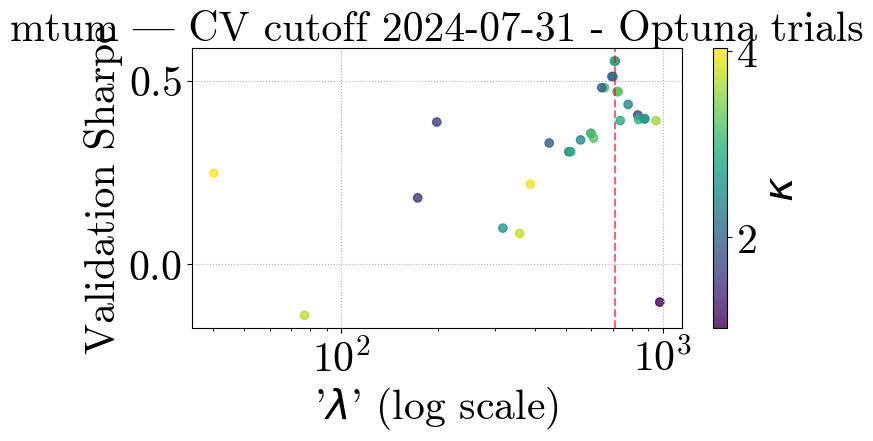

[I 2025-05-06 05:57:23,660] A new study created in memory with name: no-name-a4a40a69-6aab-4643-aa8c-c28fa0e225b1
[I 2025-05-06 05:57:27,840] Trial 0 finished with value: -0.3718763696003295 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3718763696003295.
[I 2025-05-06 05:57:31,777] Trial 1 finished with value: -0.12102820314051461 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.12102820314051461.
[I 2025-05-06 05:57:39,471] Trial 2 finished with value: 0.1803797853093704 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.1803797853093704.
[I 2025-05-06 05:57:51,923] Trial 3 finished with value: 0.2568850158454036 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.2568850158454036.
[I 2025-05-06 05:57:55,570] Trial 4 finished with value: -0.3386105632389877 and p

Optuna best λ=907.9421, κ=1.361493337186193, Sharpe=0.8762


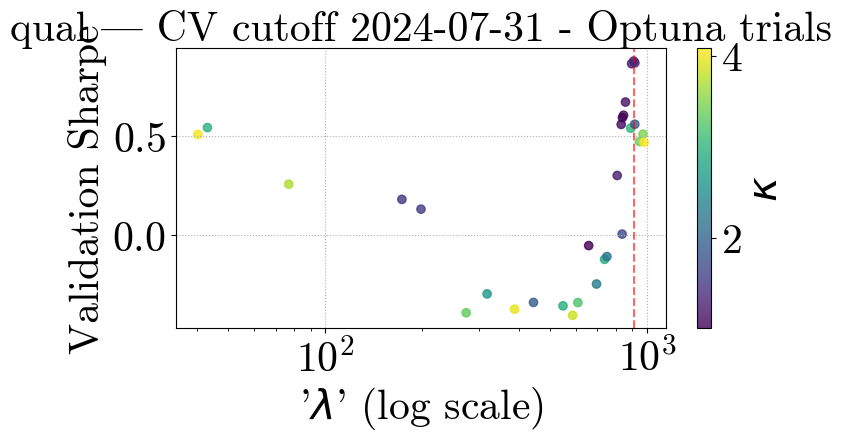

[I 2025-05-06 06:00:03,580] A new study created in memory with name: no-name-dbe7e8a5-ea28-4cab-8783-2682e1fed395
[I 2025-05-06 06:00:09,487] Trial 0 finished with value: 0.4983513576727031 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4983513576727031.
[I 2025-05-06 06:00:10,407] Trial 1 finished with value: 0.4983513576727031 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4983513576727031.
[I 2025-05-06 06:00:23,858] Trial 2 finished with value: 0.47584518399374115 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4983513576727031.
[I 2025-05-06 06:00:34,195] Trial 3 finished with value: 0.37268688524223037 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.4983513576727031.
[I 2025-05-06 06:00:35,156] Trial 4 finished with value: 0.4983513576727031 and parame

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.4984


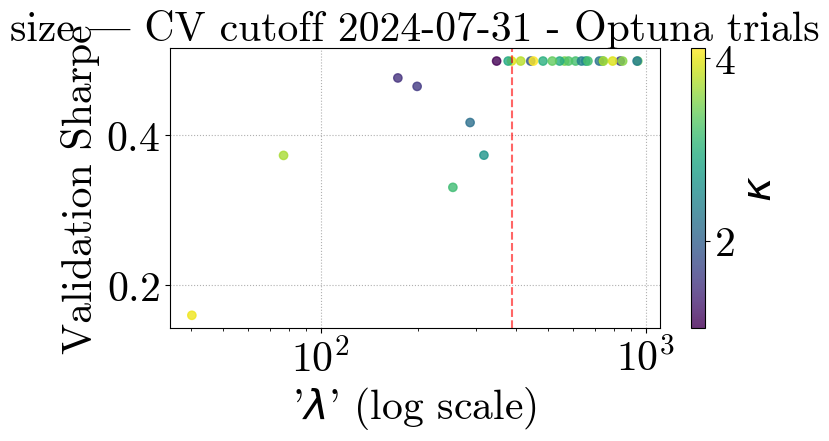

[I 2025-05-06 06:02:18,549] A new study created in memory with name: no-name-321723ac-0610-4296-a228-e6e0ae6ad3a2
[I 2025-05-06 06:02:24,070] Trial 0 finished with value: -0.710141748529941 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.710141748529941.
[I 2025-05-06 06:02:32,854] Trial 1 finished with value: -1.058998785050632 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.710141748529941.
[I 2025-05-06 06:02:38,468] Trial 2 finished with value: -0.6589209051324316 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.6589209051324316.
[I 2025-05-06 06:02:50,853] Trial 3 finished with value: 0.1983301520487192 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1983301520487192.
[I 2025-05-06 06:02:56,401] Trial 4 finished with value: -0.6677828579353126 and param

Optuna best λ=116.2359, κ=1.326184431810769, Sharpe=0.4091


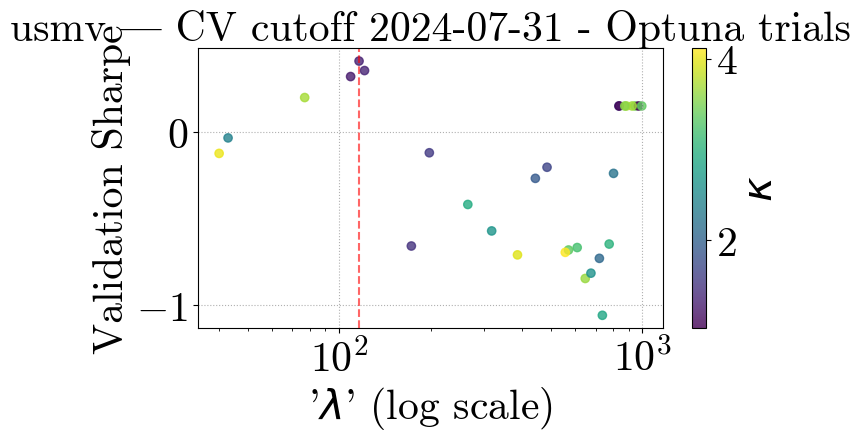

[I 2025-05-06 06:05:04,241] A new study created in memory with name: no-name-2a86b112-d3b0-44ff-ac23-ecf383f9dcc6
[I 2025-05-06 06:05:17,551] Trial 0 finished with value: 0.36586886281454556 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.36586886281454556.
[I 2025-05-06 06:05:21,872] Trial 1 finished with value: 0.36586886281454556 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.36586886281454556.
[I 2025-05-06 06:05:31,666] Trial 2 finished with value: 0.36586886281454556 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.36586886281454556.
[I 2025-05-06 06:05:44,781] Trial 3 finished with value: 0.2040903694423859 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.36586886281454556.
[I 2025-05-06 06:05:49,455] Trial 4 finished with value: 0.36586886281454556 and 

Optuna best λ=54.1609, κ=4.11127017016935, Sharpe=0.6172


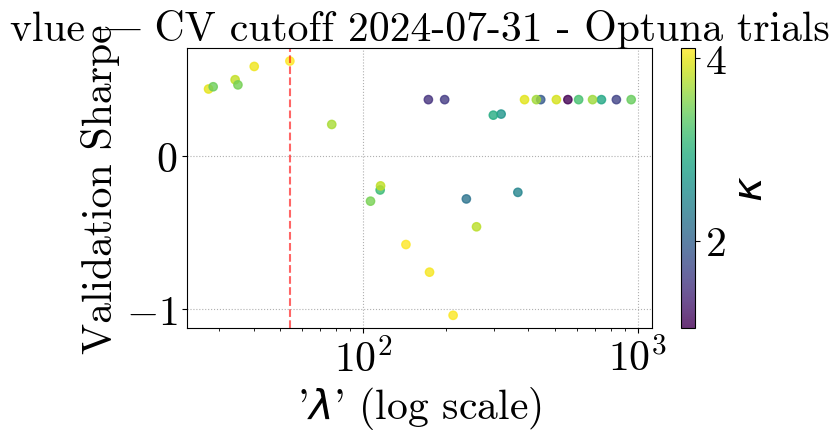

[I 2025-05-06 06:10:21,396] A new study created in memory with name: no-name-1225be5d-fcf7-4352-b31e-ec4f4349cfa3
[I 2025-05-06 06:10:25,063] Trial 0 finished with value: 0.6007516828071237 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6007516828071237.
[I 2025-05-06 06:10:28,016] Trial 1 finished with value: 0.5957827092655478 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6007516828071237.
[I 2025-05-06 06:10:35,652] Trial 2 finished with value: 0.09031106909853835 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6007516828071237.
[I 2025-05-06 06:10:47,450] Trial 3 finished with value: 0.5479976221370373 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6007516828071237.
[I 2025-05-06 06:10:52,685] Trial 4 finished with value: 0.6165799027719903 and paramet

Optuna best λ=970.1464, κ=3.419588001277772, Sharpe=0.6438


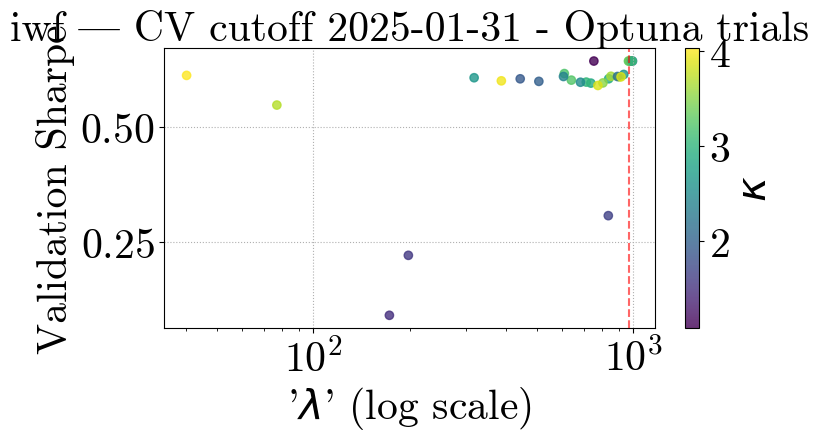

[I 2025-05-06 06:12:54,211] A new study created in memory with name: no-name-8741d1e1-6bd8-4d67-b811-447fc8625778
[I 2025-05-06 06:12:58,867] Trial 0 finished with value: -0.17574265832049576 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.17574265832049576.
[I 2025-05-06 06:13:03,581] Trial 1 finished with value: -0.06644438884453648 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.06644438884453648.
[I 2025-05-06 06:13:11,800] Trial 2 finished with value: -0.7944292735943866 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.06644438884453648.
[I 2025-05-06 06:13:26,733] Trial 3 finished with value: -0.26421128460188964 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.06644438884453648.
[I 2025-05-06 06:13:32,299] Trial 4 finished with value: -0.0162649221040

Optuna best λ=324.5298, κ=1.4194367062964883, Sharpe=0.6233


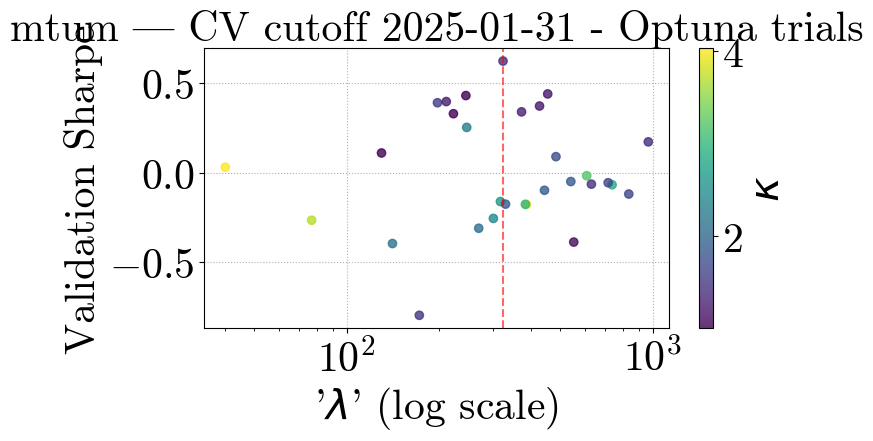

[I 2025-05-06 06:16:43,895] A new study created in memory with name: no-name-bc946303-471d-4749-a074-eaf0596b0cb8
[I 2025-05-06 06:16:47,295] Trial 0 finished with value: -0.05269674472738018 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.05269674472738018.
[I 2025-05-06 06:16:50,866] Trial 1 finished with value: 0.5516526432503671 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5516526432503671.
[I 2025-05-06 06:16:56,045] Trial 2 finished with value: -0.22254260261052614 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5516526432503671.
[I 2025-05-06 06:17:14,749] Trial 3 finished with value: 0.25548557292430674 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5516526432503671.
[I 2025-05-06 06:17:17,968] Trial 4 finished with value: -0.08755993387382706 and

Optuna best λ=838.0166, κ=2.1855441481340363, Sharpe=0.8004


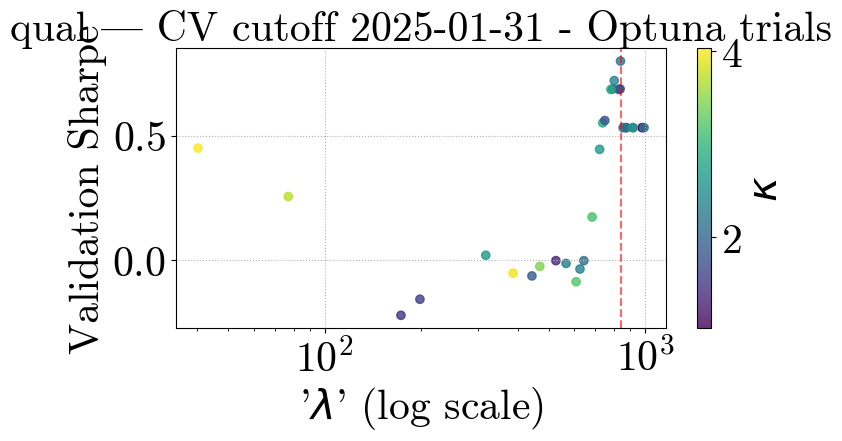

[I 2025-05-06 06:18:56,208] A new study created in memory with name: no-name-a43f1408-458c-4d34-9302-64b13730dd78
[I 2025-05-06 06:19:03,098] Trial 0 finished with value: 0.5778147690315565 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5778147690315565.
[I 2025-05-06 06:19:04,009] Trial 1 finished with value: 0.5778147690315565 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5778147690315565.
[I 2025-05-06 06:19:14,933] Trial 2 finished with value: 0.5078848464641046 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5778147690315565.
[I 2025-05-06 06:19:27,348] Trial 3 finished with value: 0.3823509145831413 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5778147690315565.
[I 2025-05-06 06:19:28,160] Trial 4 finished with value: 0.5778147690315565 and paramete

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.5778


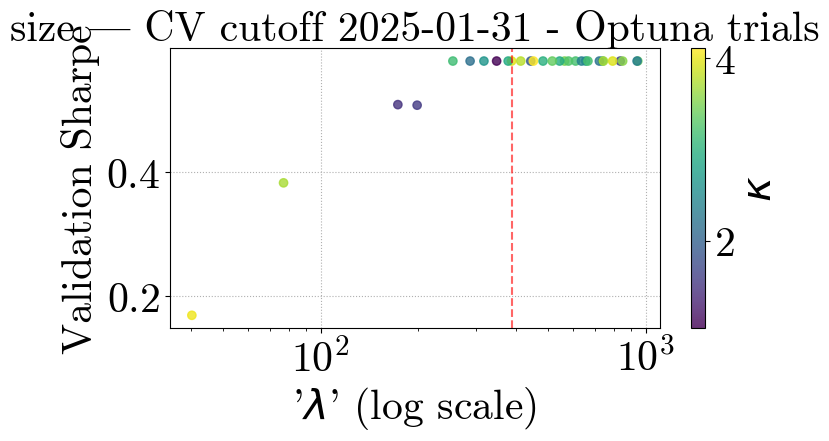

[I 2025-05-06 06:21:26,082] A new study created in memory with name: no-name-b32d8b02-e0c6-454b-b3fd-e009003bc1e3
[I 2025-05-06 06:21:33,347] Trial 0 finished with value: -0.005973221121210852 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.005973221121210852.
[I 2025-05-06 06:21:36,992] Trial 1 finished with value: 0.20440302849890282 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.20440302849890282.
[I 2025-05-06 06:21:42,492] Trial 2 finished with value: 0.8155400437752037 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.8155400437752037.
[I 2025-05-06 06:21:55,024] Trial 3 finished with value: 0.5549888450528055 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.8155400437752037.
[I 2025-05-06 06:22:00,742] Trial 4 finished with value: 0.25857906120748 and pa

Optuna best λ=198.1885, κ=1.5727916564869089, Sharpe=1.0139


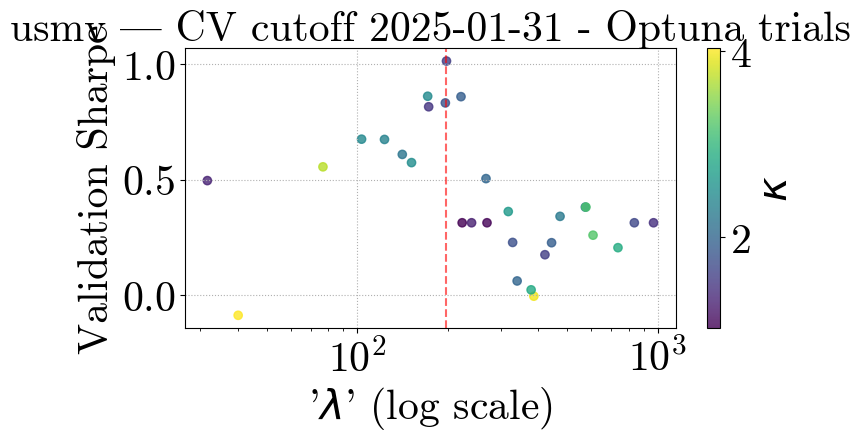

[I 2025-05-06 06:24:48,842] A new study created in memory with name: no-name-cabde392-90d0-4968-8e5b-0e19f541c14f
[I 2025-05-06 06:24:53,611] Trial 0 finished with value: 0.8641639587263361 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8641639587263361.
[I 2025-05-06 06:24:58,524] Trial 1 finished with value: 0.8641639587263361 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.8641639587263361.
[I 2025-05-06 06:25:10,456] Trial 2 finished with value: 0.5485558433308685 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.8641639587263361.
[I 2025-05-06 06:25:25,058] Trial 3 finished with value: -0.5478255041023239 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.8641639587263361.
[I 2025-05-06 06:25:29,362] Trial 4 finished with value: 0.8641639587263361 and paramet

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.8642


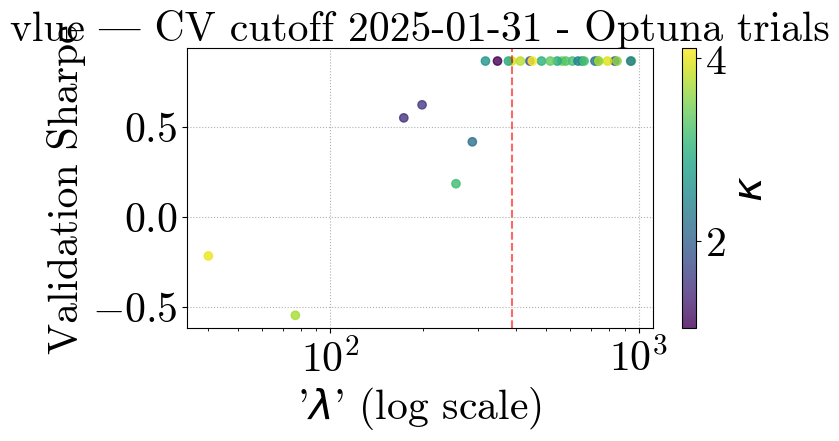

[I 2025-05-06 06:28:15,809] A new study created in memory with name: no-name-20e61136-3cfb-452c-94dd-8b91887abaed
[I 2025-05-06 06:28:21,470] Trial 0 finished with value: 0.4787499463345947 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4787499463345947.
[I 2025-05-06 06:28:25,111] Trial 1 finished with value: 0.4787499463345947 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4787499463345947.
[I 2025-05-06 06:28:32,122] Trial 2 finished with value: 0.4787499463345947 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4787499463345947.
[I 2025-05-06 06:29:00,691] Trial 3 finished with value: 0.4600336707343503 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.4787499463345947.
[I 2025-05-06 06:29:04,639] Trial 4 finished with value: 0.4787499463345947 and paramete

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.5473


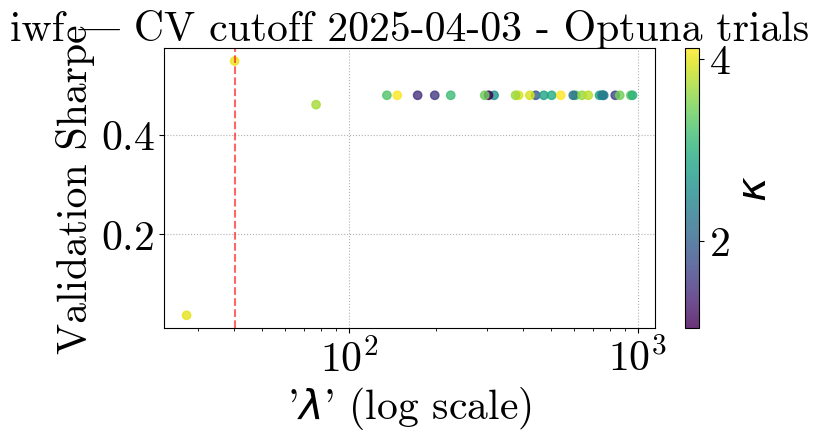

[I 2025-05-06 06:32:14,221] A new study created in memory with name: no-name-63bc285e-9541-4665-968d-a69b452db9a9
[I 2025-05-06 06:32:19,188] Trial 0 finished with value: -0.10371659239347307 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10371659239347307.
[I 2025-05-06 06:32:24,472] Trial 1 finished with value: -0.30524745363688627 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.10371659239347307.
[I 2025-05-06 06:32:37,419] Trial 2 finished with value: -0.028197935251955353 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.028197935251955353.
[I 2025-05-06 06:32:55,224] Trial 3 finished with value: -0.3933858128824992 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.028197935251955353.
[I 2025-05-06 06:32:59,436] Trial 4 finished with value: -0.2307083860

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.0652


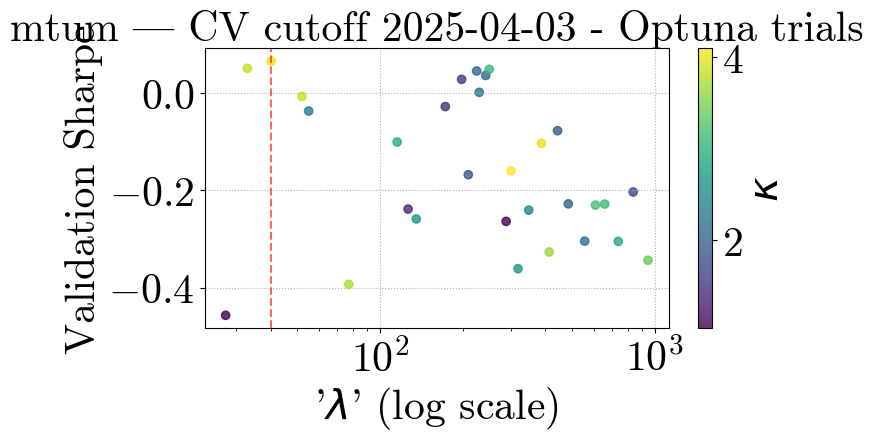

[I 2025-05-06 06:36:23,369] A new study created in memory with name: no-name-4ca92321-9658-4128-98db-9c3f05e84091
[I 2025-05-06 06:36:28,472] Trial 0 finished with value: -0.07347310031166954 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.07347310031166954.
[I 2025-05-06 06:36:29,271] Trial 1 finished with value: 0.7046630082725429 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.7046630082725429.
[I 2025-05-06 06:36:40,604] Trial 2 finished with value: -0.3898701967133937 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.7046630082725429.
[I 2025-05-06 06:36:51,219] Trial 3 finished with value: 0.11628287671423918 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.7046630082725429.
[I 2025-05-06 06:36:54,920] Trial 4 finished with value: 0.8246707550409633 and pa

Optuna best λ=621.9372, κ=3.2898558741033144, Sharpe=0.8728


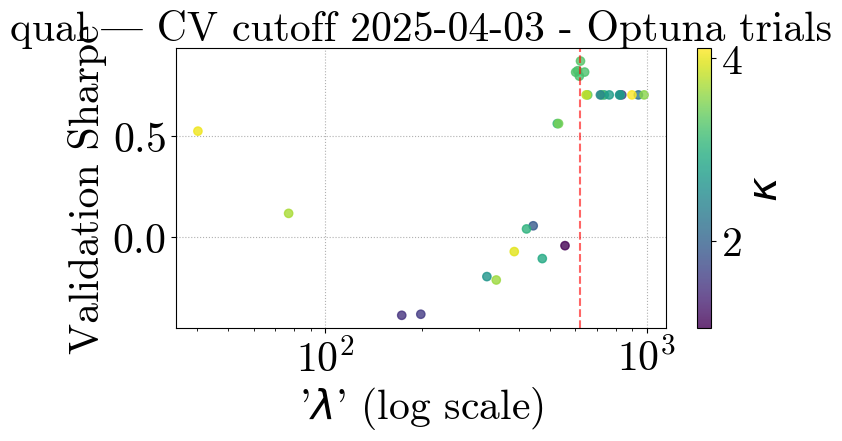

[I 2025-05-06 06:38:20,919] A new study created in memory with name: no-name-1ed24ba6-be37-4652-b57f-202ad5b9a499
[I 2025-05-06 06:38:25,938] Trial 0 finished with value: 0.19449504476574275 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19449504476574275.
[I 2025-05-06 06:38:26,833] Trial 1 finished with value: 0.19449504476574275 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.19449504476574275.
[I 2025-05-06 06:38:36,469] Trial 2 finished with value: 0.13577552519453157 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.19449504476574275.
[I 2025-05-06 06:38:48,568] Trial 3 finished with value: 0.11866053507442662 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.19449504476574275.
[I 2025-05-06 06:38:49,502] Trial 4 finished with value: 0.19449504476574275 and

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.1945


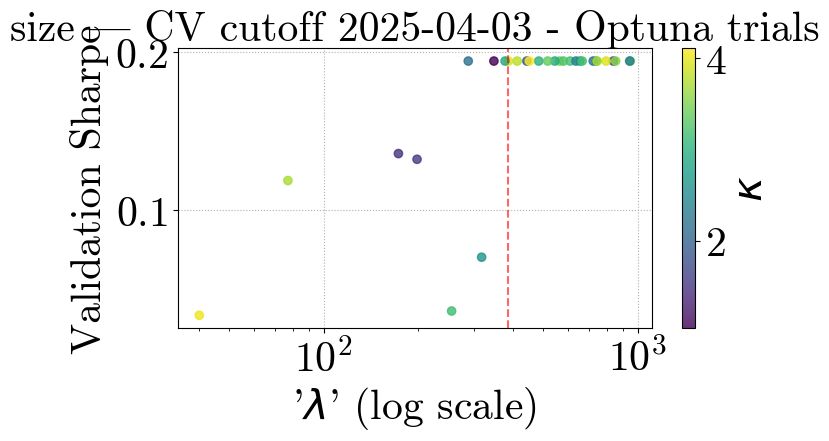

[I 2025-05-06 06:40:33,463] A new study created in memory with name: no-name-b46f95f4-d4e9-42a8-a246-722cab7740d3
[I 2025-05-06 06:40:39,034] Trial 0 finished with value: -0.043065531533156585 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.043065531533156585.
[I 2025-05-06 06:40:39,783] Trial 1 finished with value: -0.043065531533156634 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.043065531533156585.
[I 2025-05-06 06:40:48,153] Trial 2 finished with value: -0.07064209085614158 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.043065531533156585.
[I 2025-05-06 06:40:54,766] Trial 3 finished with value: 0.10213180025273685 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.10213180025273685.
[I 2025-05-06 06:40:57,980] Trial 4 finished with value: -0.043065531

Optuna best λ=150.8384, κ=2.9819723710793995, Sharpe=0.6021


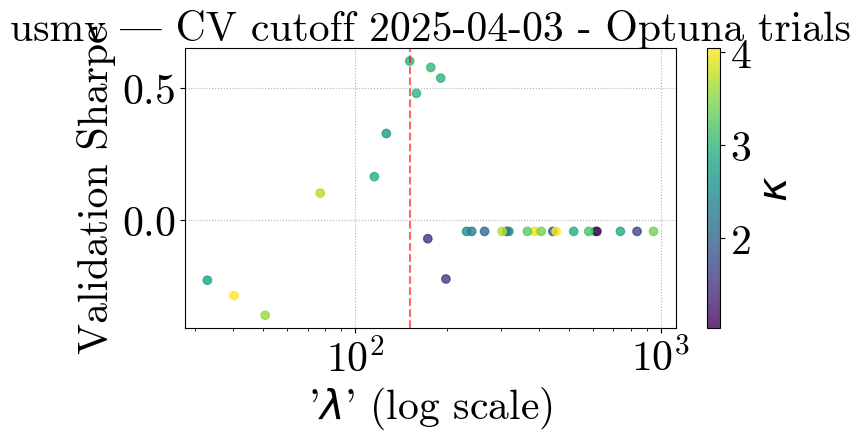

[I 2025-05-06 06:43:53,102] A new study created in memory with name: no-name-196581d3-493e-43d6-83d3-04dc75f58e49
[I 2025-05-06 06:43:57,538] Trial 0 finished with value: 0.4738084777909231 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4738084777909231.
[I 2025-05-06 06:44:00,884] Trial 1 finished with value: 0.4738084777909231 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4738084777909231.
[I 2025-05-06 06:44:09,518] Trial 2 finished with value: 0.018785616980348238 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4738084777909231.
[I 2025-05-06 06:44:20,501] Trial 3 finished with value: -0.8342456605966909 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.4738084777909231.
[I 2025-05-06 06:44:25,931] Trial 4 finished with value: 0.4738084777909231 and param

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.4738


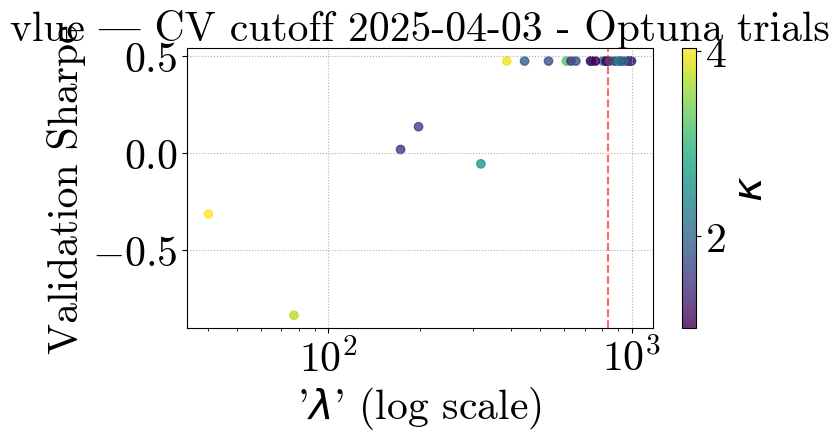

C:\Users\victo\AppData\Local\Temp\ipykernel_12748\3614096817.py:123: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


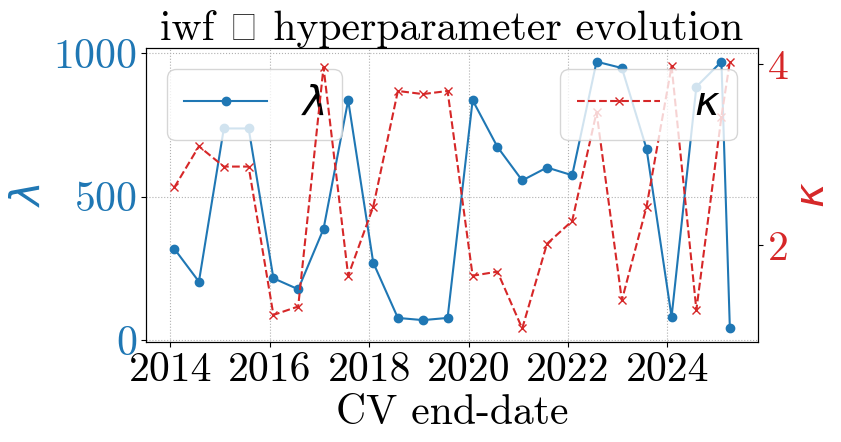

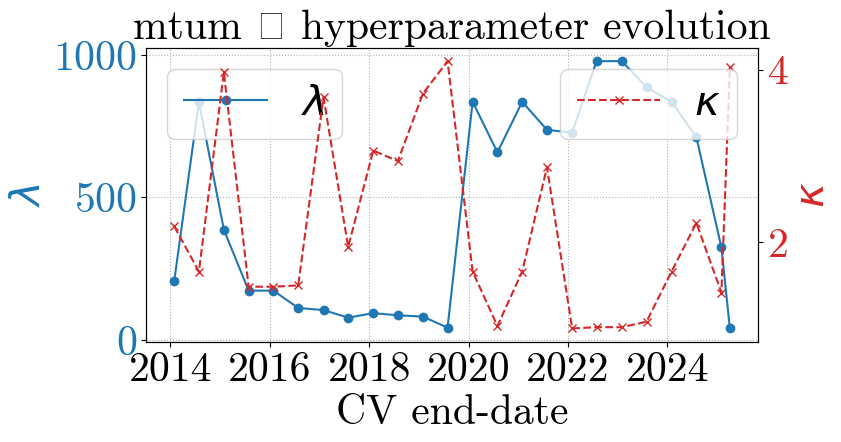

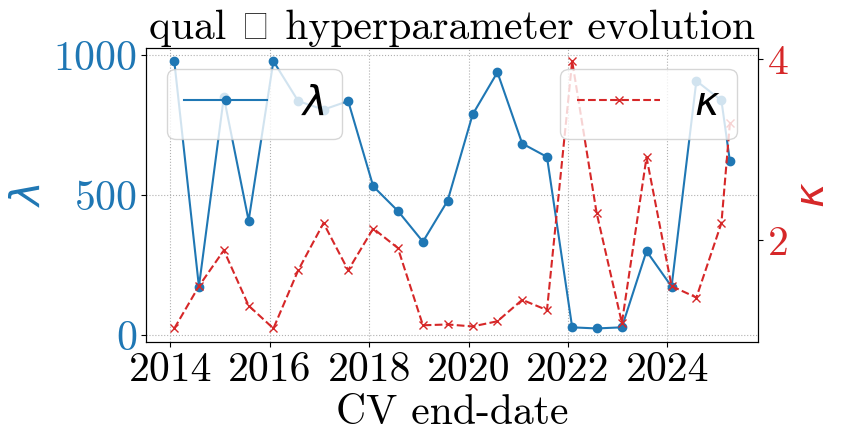

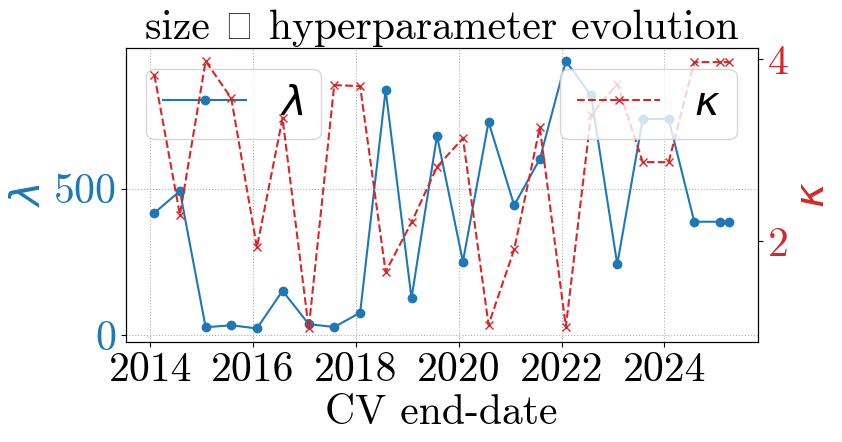

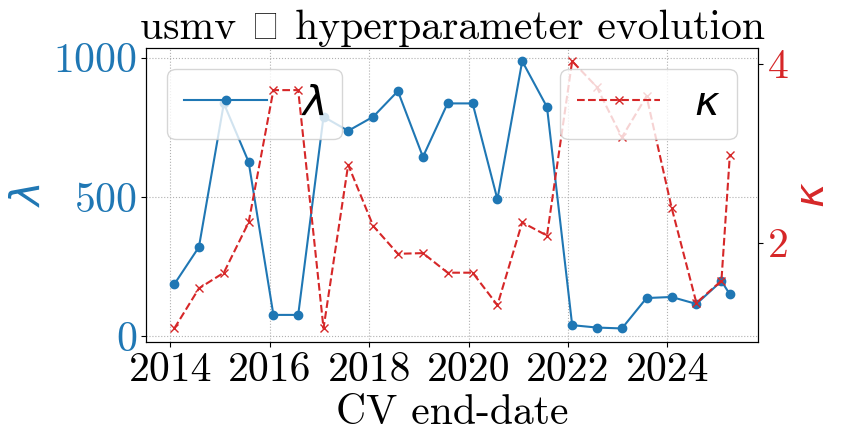

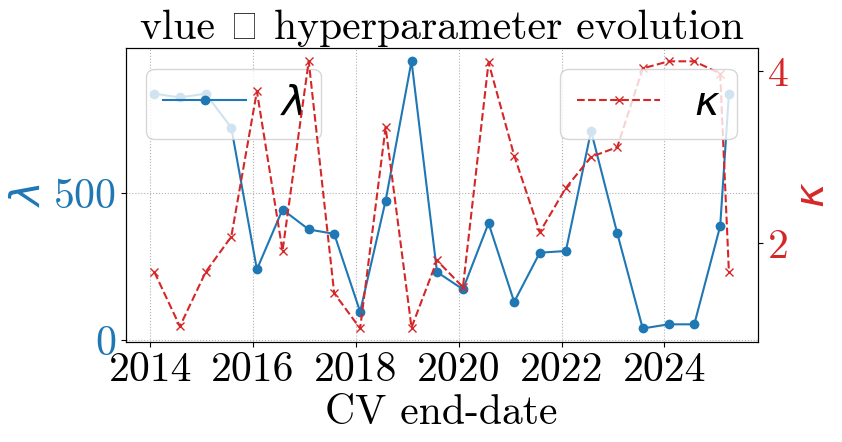

Saved tuned parameters to cv_params.parquet
         date factor  best_lambda  best_kappa
0  2014-01-31    iwf   318.157398    2.638870
6  2014-07-31    iwf   203.369514    3.094032
12 2015-01-30    iwf   737.354063    2.869674
18 2015-07-31    iwf   737.354063    2.869674
24 2016-01-29    iwf   215.223858    1.230106


In [5]:
# -------------------------  QUICK STAND‑ALONE RUN  ----------------------- #
# ---- user‑specific setup (exactly as in your original script) -------- #

# Paths & tickers -----------------------------------------------------------------------
TEST_START       = "2014-01-01"
RECROSS_VAL_FREQ = "6ME"          # six‑month‑end


script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", ".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   

# lambda_values = np.linspace(30, 400, 5)
# # kappa grid can depend on feature count; a simple fixed grid is fine
# kappa_values  = np.array([2.0, 3.0, 4.0]) # kappa = trial.suggest_int("kappa", 1, np.sqrt(17))

# ------- load full data into factor_data_dict here -------------------- #
# (use your existing MergedDataLoader logic)
factor_data_dict = {}
for fac in factors:
    data = MergedDataLoader(
                factor_file=factor_file,
                market_file=market_file,
                ver="v2",
                factor_col=fac).load()

    common_idx = (data.X.index
                    .intersection(data.ret_ser.index)
                    .intersection(data.market_ser.index))

    factor_data_dict[fac] = {
        "X":       data.X.loc[common_idx],
        "fac_ret": data.ret_ser.loc[common_idx],
        "mkt_ret": data.market_ser.loc[common_idx],
    }


master_index = factor_data_dict[factors[0]]["X"].index.sort_values()
test_index   = master_index[master_index >= TEST_START]

recross_val_boundaries = (
    test_index.to_series()
    .resample(RECROSS_VAL_FREQ)
    .last()
    .dropna()                     # Series of Timestamp objects
)
# ----------------------------------------------------------------------

cv_table = run_cv(
    factors,
    factor_data_dict,
    cv_dates=recross_val_boundaries,
    initial_train_start="2002-05-31"
)

print("Saved tuned parameters to cv_params.parquet")
print(cv_table.head())

In [ ]:
# # 1) Cast kappa to float
# cv_table["best_kappa"] = cv_table["best_kappa"].astype(float)

# # 2) (Optional) verify
# print(cv_table.dtypes)

# # 3) Save out
# cv_table.to_parquet("cv_params_bayes_v2.parquet", index=False) # v2 is the one searching from 0.1 to 1000


date           datetime64[ns]
factor                 object
best_lambda           float64
best_kappa            float64
dtype: object


In [5]:
with open("cell_output.txt", "w") as f:
    for r in records:  # or whatever your output list is
        f.write(str(r) + "\n")


NameError: name 'records' is not defined